## Evaluation of UTOPIA's performance in predicting MPs size dristributionsusing the monaco Monte Carlo framework 
#### (https://monaco.readthedocs.io/en/latest/)

With this script we preform an evaluation of UTOPIA's size distribution predictive capacity by comparing predicted size distributions in targeted compartmanes aginst observed MPs size distributions reported in the compilation of published datasets by Kooi et al.

### Import the necessary libraries

In [22]:
from utopia.monte_carlo.montecarlo_analysis_paper import run_mc_analysis_paper, set_emission, sim_to_dataframe, reshape_mc_results
from utopia.monte_carlo.monte_carlo_helpers import *
from utopia.utopia import utopiaModel
import numpy as np
import scipy.stats as st
import pandas as pd

### Load the UTOPIA's default configuration parameters 

In [23]:
data_data = utopiaModel.load_json_file("data/default_data.json")
config_data = utopiaModel.load_json_file("data/default_config.json")


### Define the parameter distributions for the Monte Carlo simulation.


Transform the discrete distributions to continuous distributions for compatibility with the current montecarlo function

In [24]:
import numpy as np
# To reproduce Rakesh results, use these following discrete values to then generate distributions (lognormal and uniform) from which to sample:

# Plastic density (mpdensity): [900, 1100, 1500] kg/m³ 
# Fragmentation style (FI): [0, 0.3, 0.5, 0.7, 1.0] - ranging from more erosive to more explosive fragmentation 
# Discorporation half time (thalf_deg): [316,1000,10000, 31600, 100000] days 
# Fragmentation timescale (thalf_frag): [10, 31.6, 100, 316] days
# your discrete support values

vals_density = np.array([900, 1100, 1500])
vals_FI = np.array([0, 0.3, 0.5, 0.7, 1.0])
vals_deg = np.array([316, 1000, 10000, 31600, 100000])
vals_frag = np.array([10, 31.6, 100, 316])

def lognorm_params_from_values(values, sigma):
    """
    Return (s, scale) for scipy.stats.lognorm given target values.
    sigma = shape parameter (spread in log space).
    We center the lognormal at the geometric mean of the values.
    """
    mu = np.mean(np.log(values))  # geometric mean in log-space
    scale = np.exp(mu - (sigma**2) / 2)
    return sigma, scale

# choose sigma to control spread (tune manually!)
s_deg, scale_deg = lognorm_params_from_values(vals_deg, sigma=0.5)
s_frag, scale_frag = lognorm_params_from_values(vals_frag, sigma=0.8)
s_density, scale_density = lognorm_params_from_values(vals_density, sigma=0.1)
s_FI, scale_FI = lognorm_params_from_values(vals_FI[vals_FI > 0], sigma=0.5)  # avoid zero for lognorm

param_distributions = {
    "MPdensity_kg_m3": ("lognorm", {"s": s_density, "scale": scale_density}),
    "FI": ("uniform", {"loc": 0.0, "scale": 1.0}),
    "t_half_deg_free": ("lognorm", {"s": s_deg, "scale": scale_deg}),
    "t_frag_gen_FreeSurfaceWater": ("lognorm", {"s": s_frag, "scale": scale_frag})
}



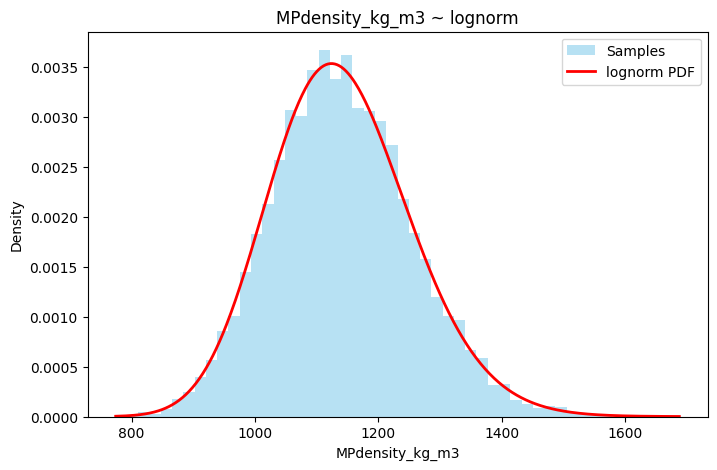

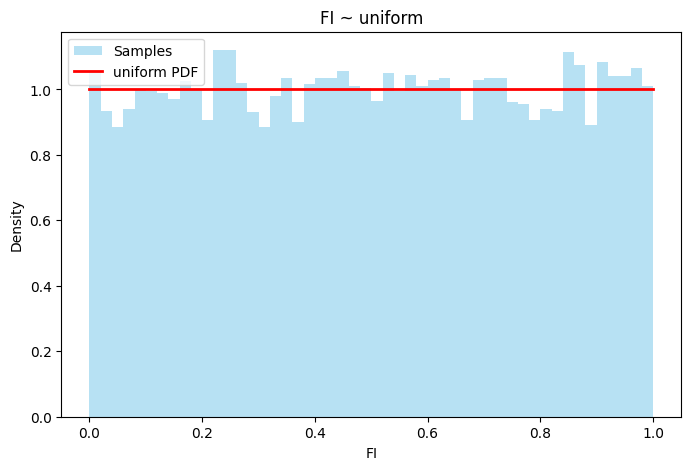

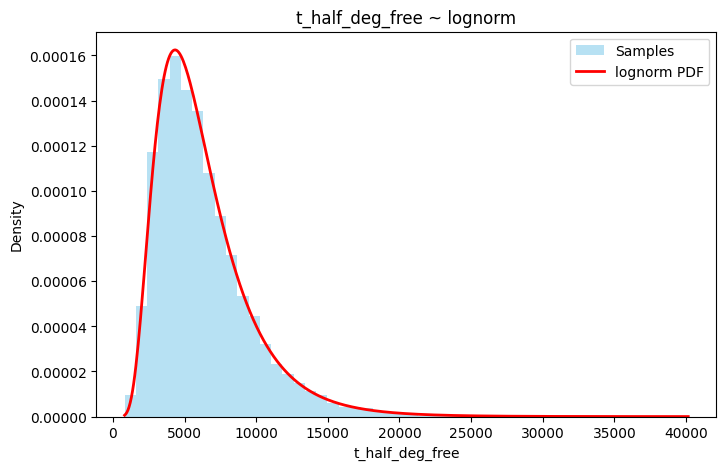

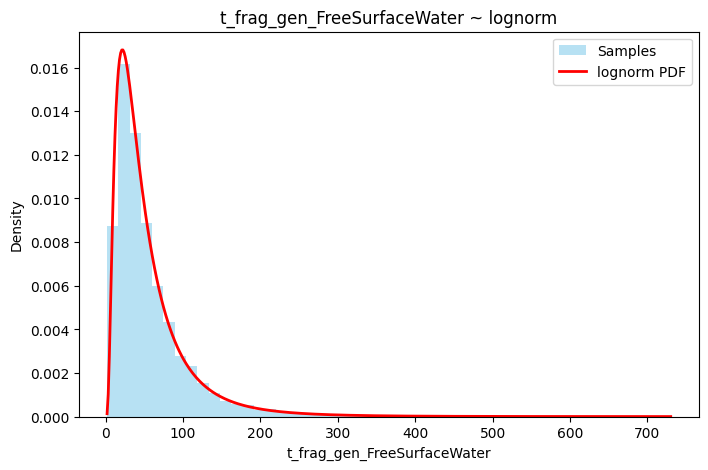

In [25]:
# Visualise the distributions by plotting

for psrsm in param_distributions:
    plot_distribution_from_dict(psrsm, param_distributions)

In [26]:

# Recent studies have challenged the density of biofilm used here (1388 kg m-3) as being too high. see e.g. # https://doi.org/10.1186/s43591-024-00098-2 
# Consider testing chnages in biofouling density

In [27]:
# Set emission scenarios to run that are compatible for comparison with observations data from Kooi et al.

##############################################
# DEFINE ARTICLE -> EMISSION SCENARIOS
##############################################

overlay_emission_scenarios = {
    "Sea Sediment | Bergmann":["Ocean_Surface_Water","Coast_Surface_Water","Coast_Column_Water"],
    "Sea Surface all | Cai":["Surface_Freshwater","Coast_Surface_Water","Impacted_Soil_Surface"],
    "Sea Surface Fragments | Enders":["Ocean_Surface_Water","Coast_Surface_Water"],
    "Sea Surface Fibers | Enders":["Ocean_Surface_Water","Coast_Surface_Water"],
    "Fragments in water | Eo":["Impacted_Soil_Surface","Surface_Freshwater"],
    "Fibers in water | Eo":["Impacted_Soil_Surface","Surface_Freshwater"],
    "Fragments in sediment | Eo":["Impacted_Soil_Surface","Surface_Freshwater"],
    "Fibers in sediment | Eo":["Impacted_Soil_Surface","Surface_Freshwater"],
    "Sea Surface all | Erni-Cassola":["Coast_Surface_Water","Impacted_Soil_Surface"],
    "Fresh water sediments | Imhof":["Surface_Freshwater","Impacted_Soil_Surface"],
    "Sea Surface all | Isobe L1":["Surface_Freshwater","Coast_Surface_Water"],
    "Sea Surface all | Isobe L2":["Surface_Freshwater","Coast_Surface_Water"],
    "Sea Surface all | Isobe L3":["Surface_Freshwater","Coast_Surface_Water"],
    "Sea Surface all | Isobe L4":["Surface_Freshwater","Coast_Surface_Water"],
    "FP all | Scheurer":["Impacted_Soil_Surface"],
    "Sea Surface Fragments | Song":["Impacted_Soil_Surface","Surface_Freshwater"],
    "Sea Surface Fibers | Song":["Impacted_Soil_Surface","Surface_Freshwater"],
    "Sea Surface all | Zhang":["Coast_Surface_Water","Surface_Freshwater"]}
    
    
    
    
# DEFINE ARTICLE->COMPARTMENTS MAPPING
#############################################
overlay_compartments_mapping = {
    "Sea Sediment | Bergmann": ["Sediment_Coast", "Sediment_Ocean"],
    "Sea Surface all | Cai": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Sea Surface Fragments | Enders": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Sea Surface Fibers | Enders": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Fragments in water | Eo": ["Bulk_Freshwater", "Surface_Freshwater"],
    "Fibers in water | Eo": ["Bulk_Freshwater", "Surface_Freshwater"],
    "Fragments in sediment | Eo": ["Sediment_Ocean", "Sediment_Coast", "Sediment_Freshwater"],
    "Fibers in sediment | Eo": ["Sediment_Ocean", "Sediment_Coast", "Sediment_Freshwater"],
    "Sea Surface all | Erni-Cassola": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Fresh water sediments | Imhof": ["Bulk_Freshwater", "Surface_Freshwater"],
    "Sea Surface all | Isobe L1": ["Coast_Surface_Water", "Ocean_Surface_Water"], 
    "Sea Surface all | Isobe L2": ["Coast_Surface_Water", "Ocean_Surface_Water"], 
    "Sea Surface all | Isobe L3": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Sea Surface all | Isobe L4": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "FP all | Scheurer": ["Impacted_Soil_Surface", "Sediment_Freshwater"], 
    "Sea Surface Fragments | Song": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Sea Surface Fibers | Song": ["Coast_Surface_Water", "Ocean_Surface_Water"],
    "Sea Surface all | Zhang": ["Coast_Surface_Water", "Ocean_Surface_Water"]
}

# NOTE!I have ch anged the mapping for the FP all | Scheurer study compared to the original data from Rakesh. Samples were collected in floodplain soils, so the impacted_soil_surface compartment and freshwater sediment compartment have been included in the compartment mapping.might be more appropriate. Since the model does not simulate floodplain soils as a separate compartment.?

# NOTE 2! Changed entry in overlay compatrments mapping for the "Fragments in sediment | Eo" and "Fibers in sediment | Eo" studies to exclude the beaches compartments. 

In [28]:
# Set emission scenarios according to the mapping defined above to the run the model for each parameter combination using the Monte Carlo framework and perform the comparison with the observed data according to mapping.

Test difference in results if run with distributions or single values for the parameters for one article

Running Monte Carlo analysis for article: Sea Sediment | Bergmann
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... 

Done
Generating cases... Done


Running cases:  12%|█▏        | 6/50 [00:12<01:31,  2.08s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:26,  2.10s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:46<00:59,  2.12s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:55,  2.21s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packag

Simulation complete! Runtime: 0:01:51.969595
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:35,  2.17s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:27,  2.13s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:53,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:48.082796
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:34,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:27,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<00:59,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:55,  2.21s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:48.750901
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:38,  2.23s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:32,  2.26s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:52<01:09,  2.49s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [01:00<01:05,  2.61s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:54.549694
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:33,  2.13s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:29,  2.18s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:48<01:03,  2.26s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:55<00:55,  2.20s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:49.154852
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:37,  2.21s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:27,  2.12s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<00:59,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:53,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:49.531052


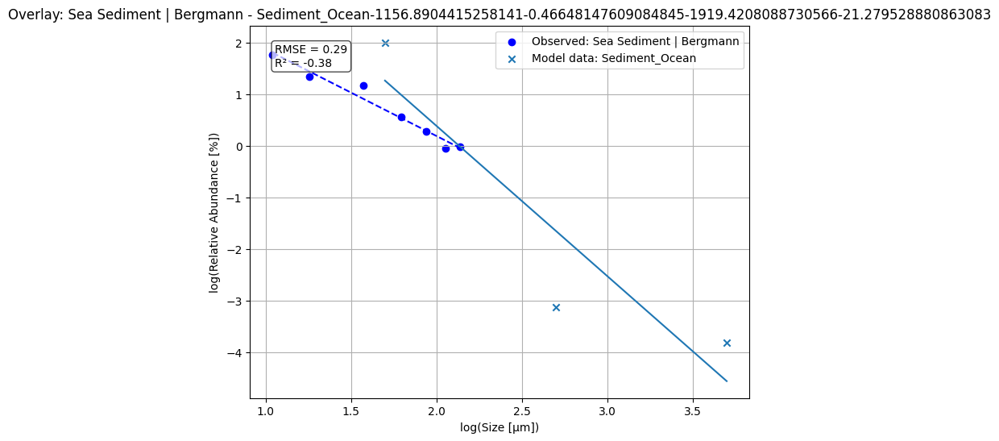

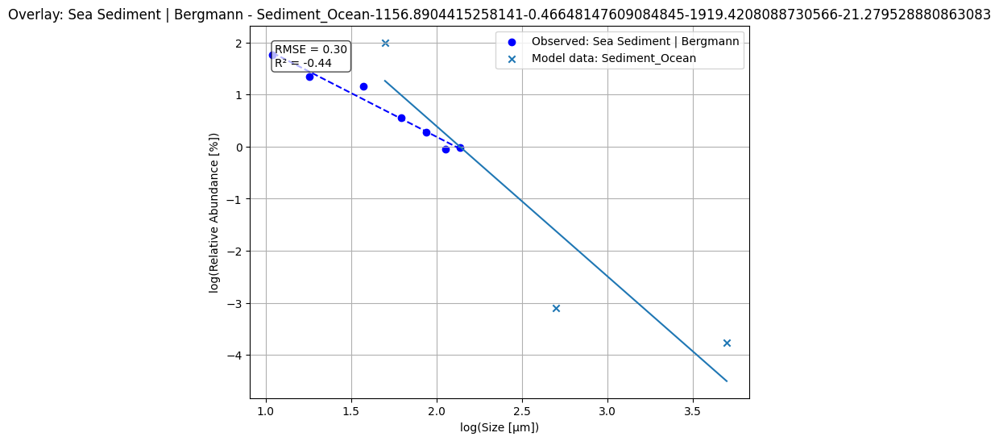

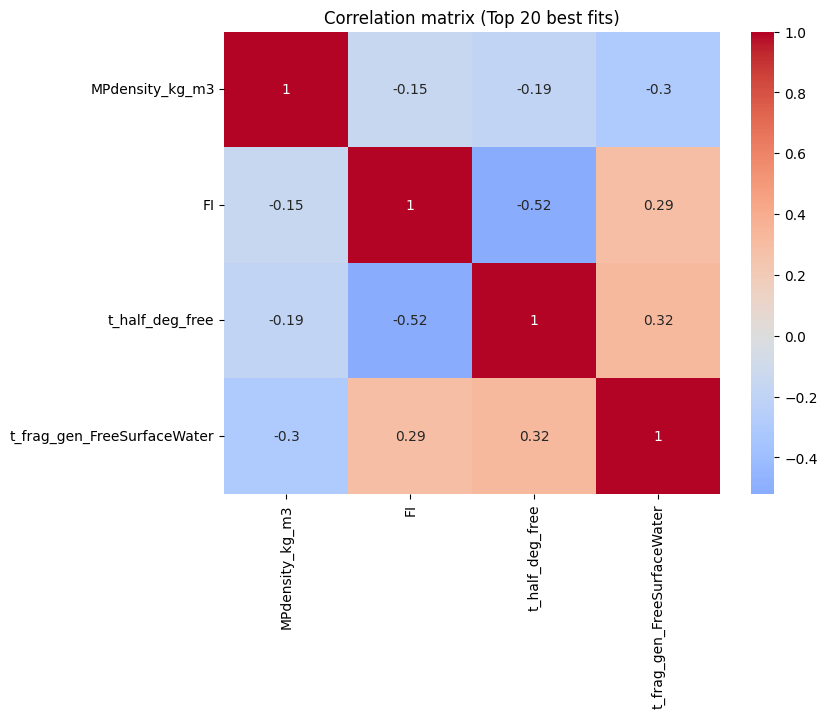

Running Monte Carlo analysis for article: Sea Surface all | Cai
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:51.678918
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 10329.27 cases/s]

Simulation complete! Runtime: 0:01:47.127465
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3692.04 cases/s]

Simulation complete! Runtime: 0:01:53.839701
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 13612.57 cases/s]

Simulation complete! Runtime: 0:01:48.186694
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:48.067443
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3164.94 cases/s]

Simulation complete! Runtime: 0:01:54.130896


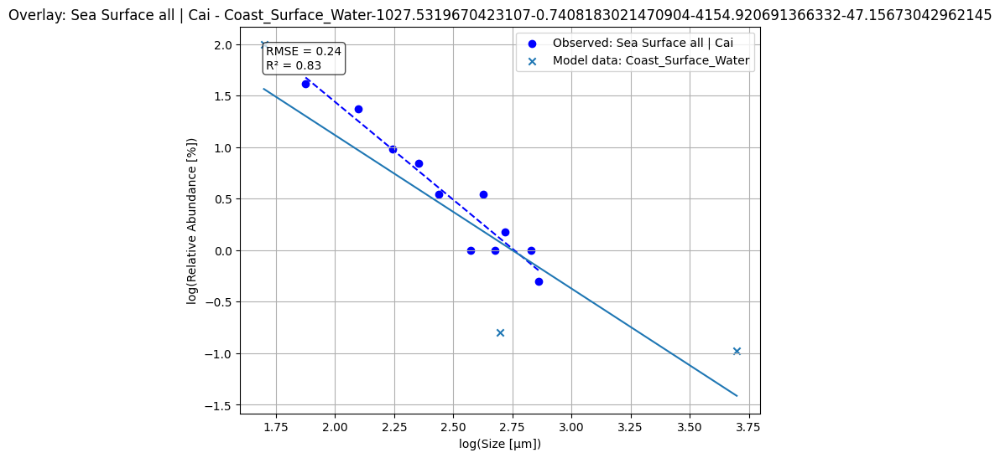

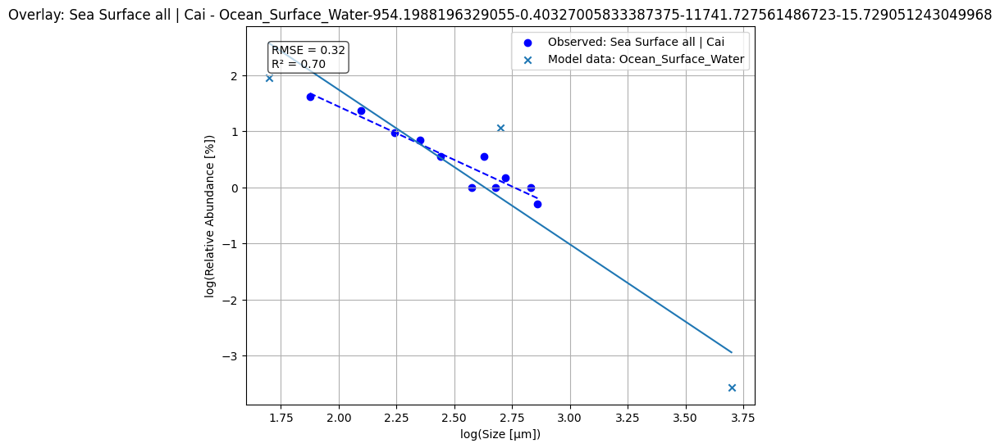

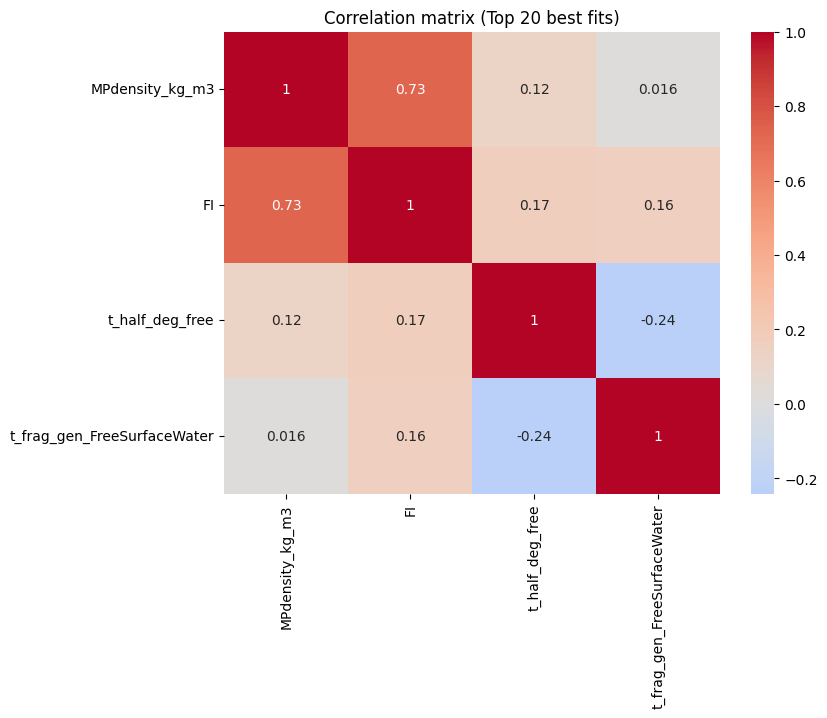

Running Monte Carlo analysis for article: Sea Surface Fragments | Enders
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 13372.14 cases/s]

Simulation complete! Runtime: 0:01:48.920206
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:47.957723
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 4381.02 cases/s]

Simulation complete! Runtime: 0:01:54.138438
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 6718.63 cases/s]

Simulation complete! Runtime: 0:01:47.751976


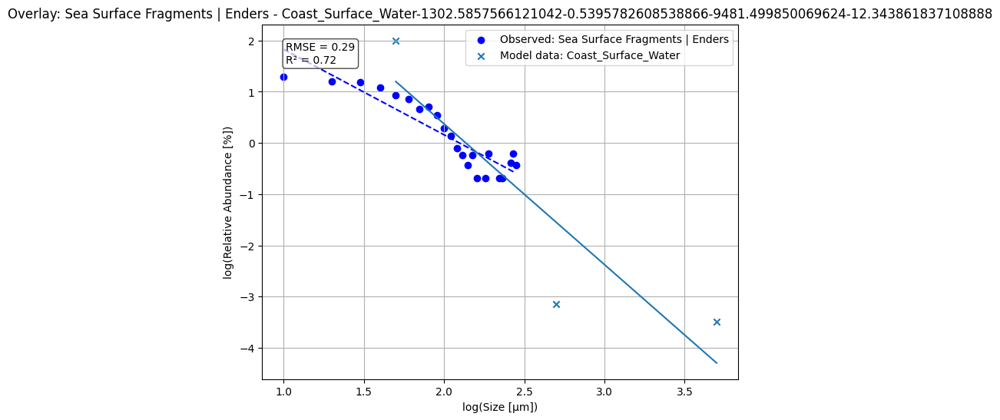

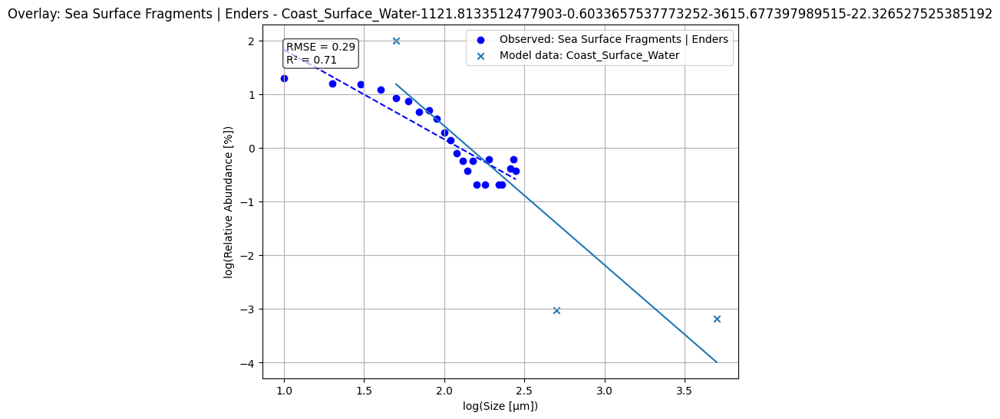

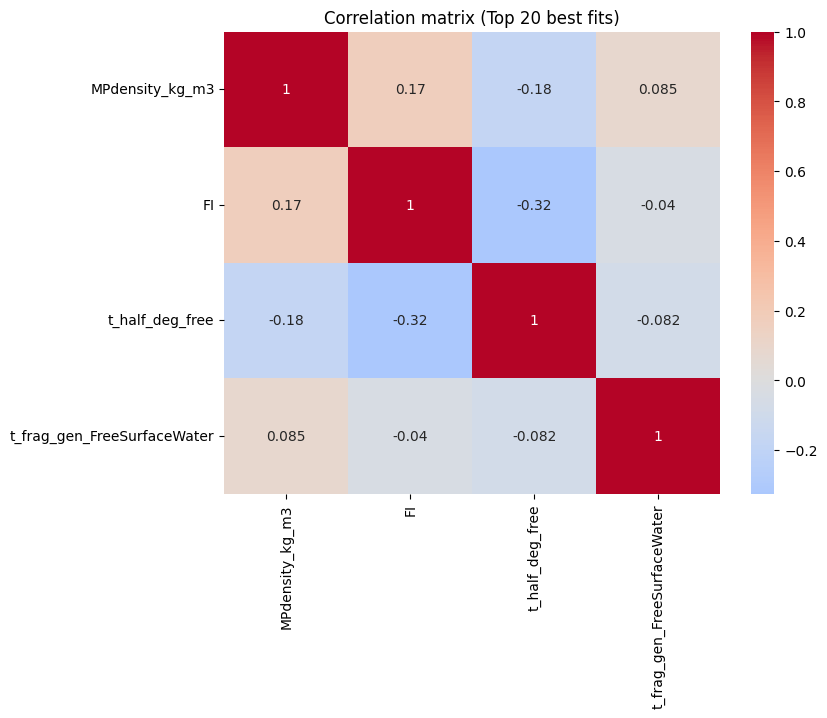

Running Monte Carlo analysis for article: Sea Surface Fibers | Enders
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 12873.86 cases/s]

Simulation complete! Runtime: 0:01:54.107270
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 12503.89 cases/s]

Simulation complete! Runtime: 0:01:48.943171
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:49.091923
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 9357.27 cases/s] 

Simulation complete! Runtime: 0:01:54.307774


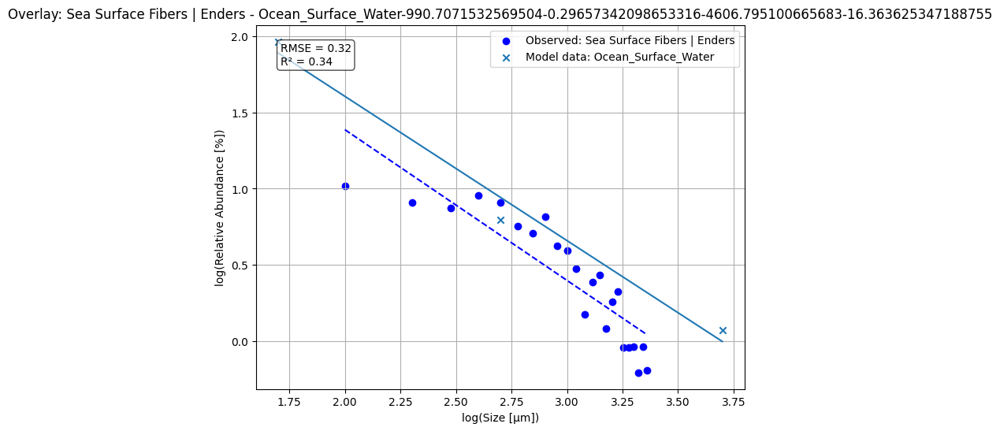

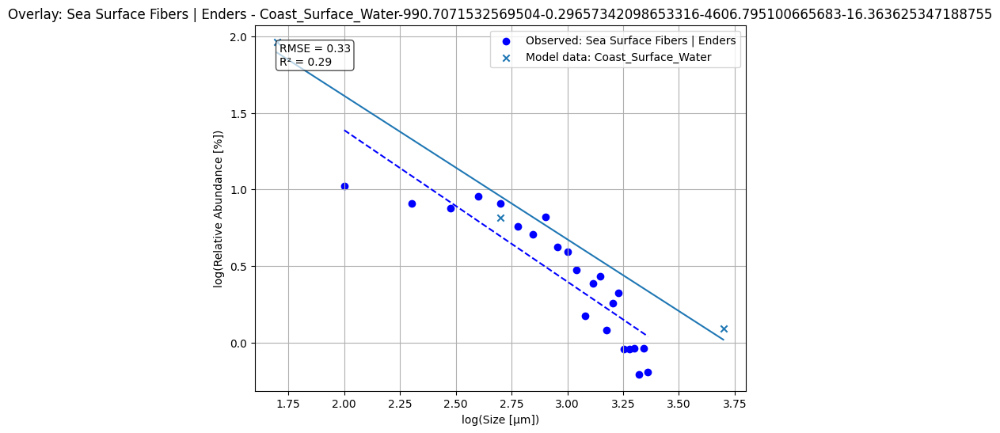

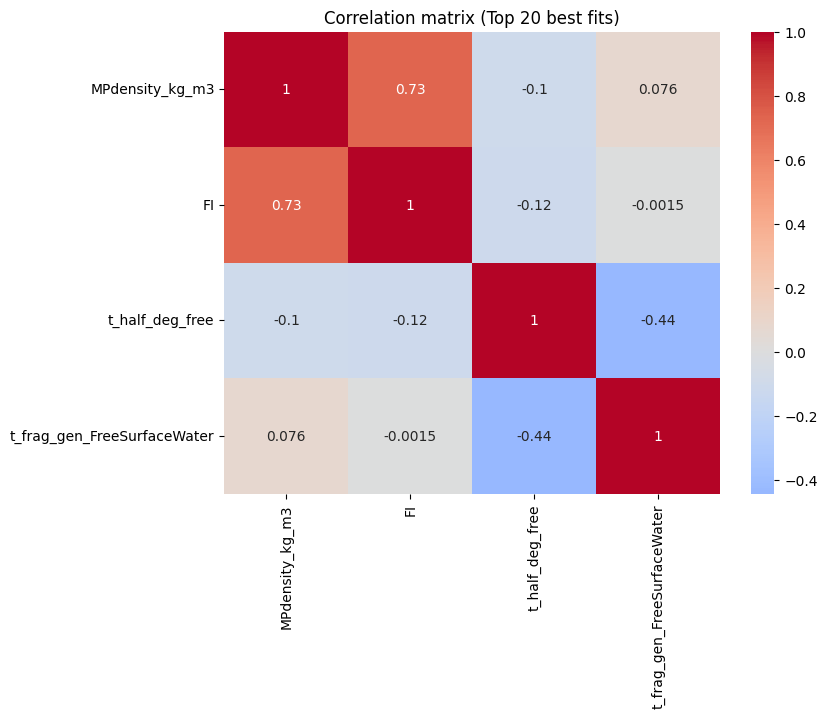

Running Monte Carlo analysis for article: Fragments in water | Eo
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 17423.99 cases/s]

Simulation complete! Runtime: 0:01:48.256727
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3797.47 cases/s]

Simulation complete! Runtime: 0:01:48.165693
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 4022.08 cases/s]

Simulation complete! Runtime: 0:01:54.277485
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:48.587131


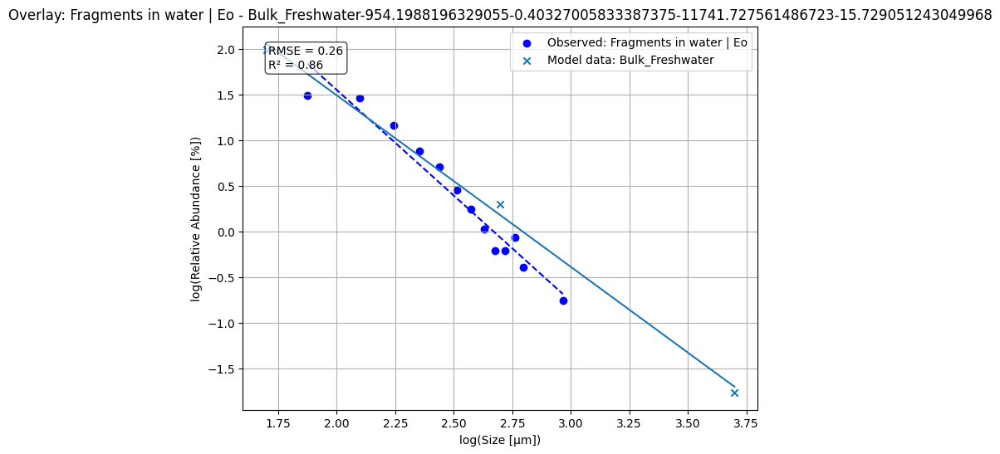

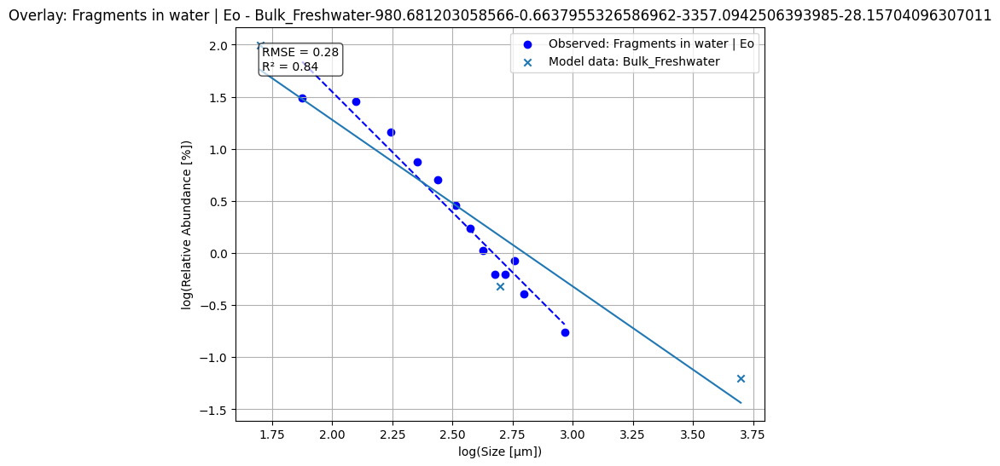

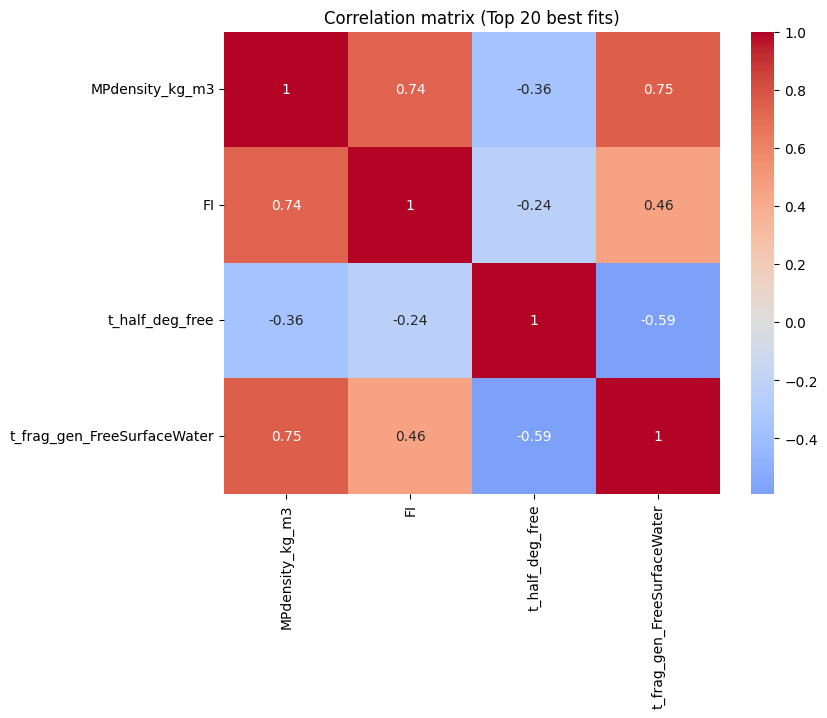

Running Monte Carlo analysis for article: Fibers in water | Eo
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 11732.32 cases/s]

Simulation complete! Runtime: 0:01:53.506248
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3960.40 cases/s]

Simulation complete! Runtime: 0:01:47.839081
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 5394.46 cases/s]

Simulation complete! Runtime: 0:01:47.842918
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:55.454614


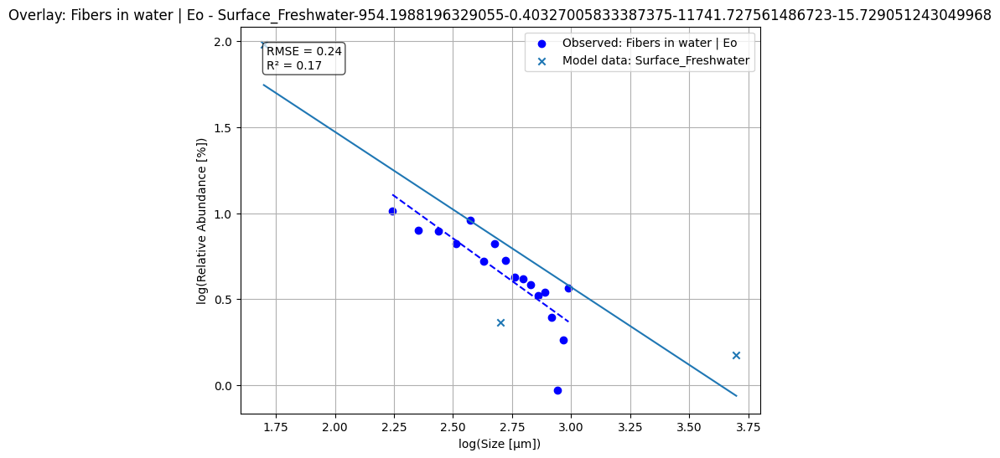

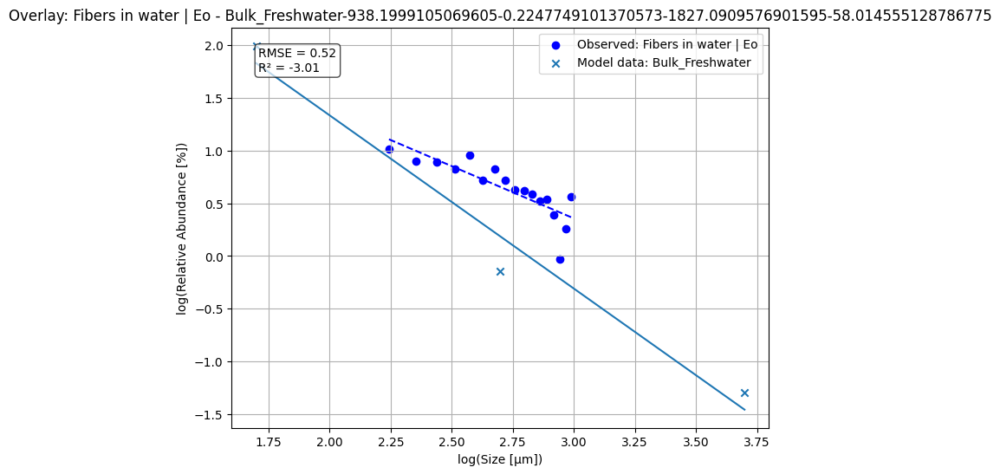

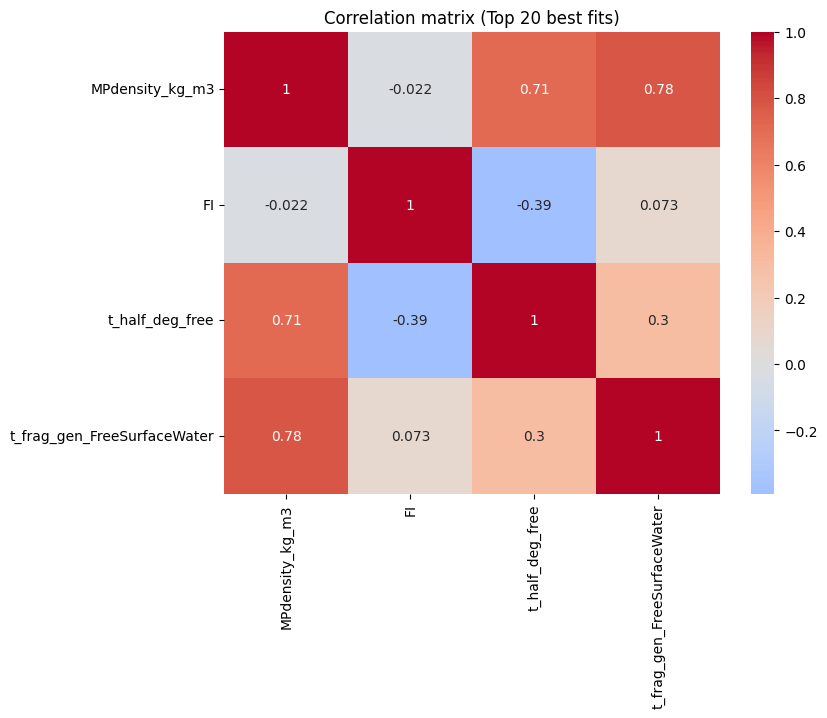

Running Monte Carlo analysis for article: Fragments in sediment | Eo
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Running cases:  12%|█▏        | 6/50 [00:12<01:33,  2.13s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:27,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:48<01:01,  2.20s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:54<00:55,  2.21s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packag

Simulation complete! Runtime: 0:01:48.958469
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:34,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:28,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:54<00:54,  2.17s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:48.386443
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:42,  2.33s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:53<01:06,  2.39s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:59<00:56,  2.26s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  76%|███████▌  | 38/50 [01:28<00:26,  2.17s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-pack

Simulation complete! Runtime: 0:01:54.257461
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:35,  2.18s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:28,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:54<00:54,  2.18s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:48.303515
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:34,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:27,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:54<00:54,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:52.239221
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:14<01:46,  2.43s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:49<01:01,  2.19s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:56<00:54,  2.18s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  76%|███████▌  | 38/50 [01:24<00:26,  2.17s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-pack

Simulation complete! Runtime: 0:01:50.317025


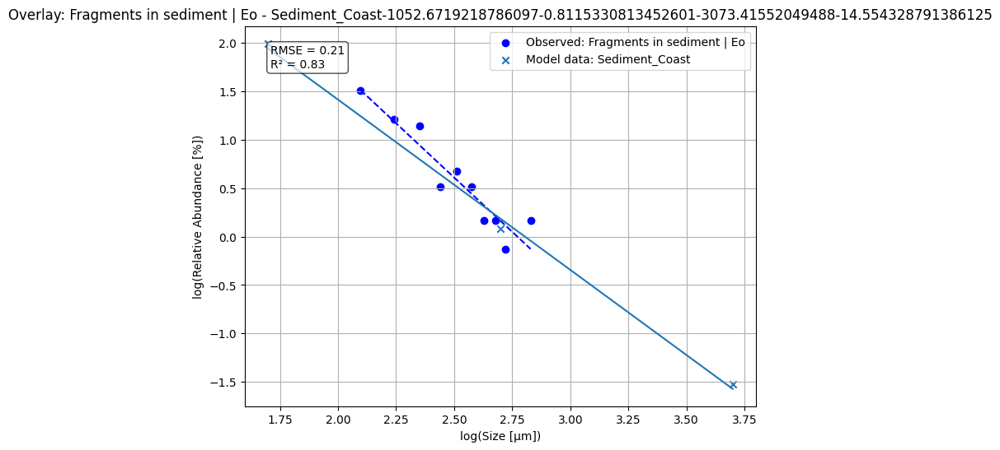

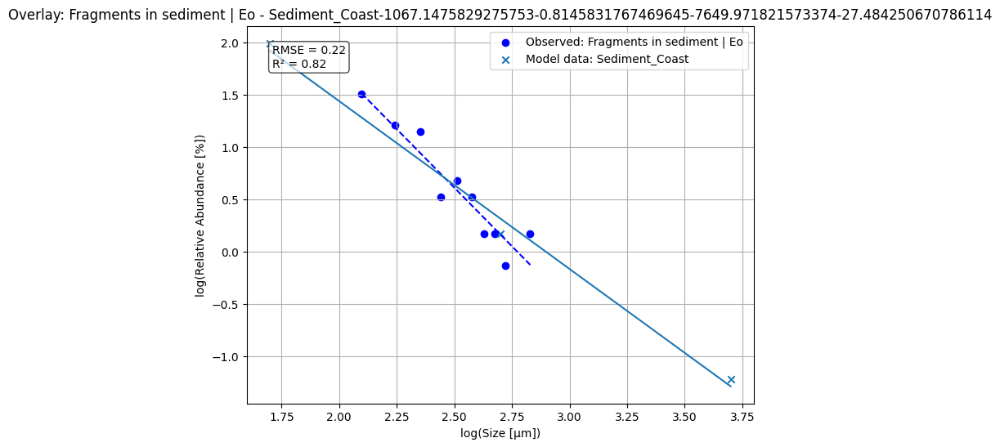

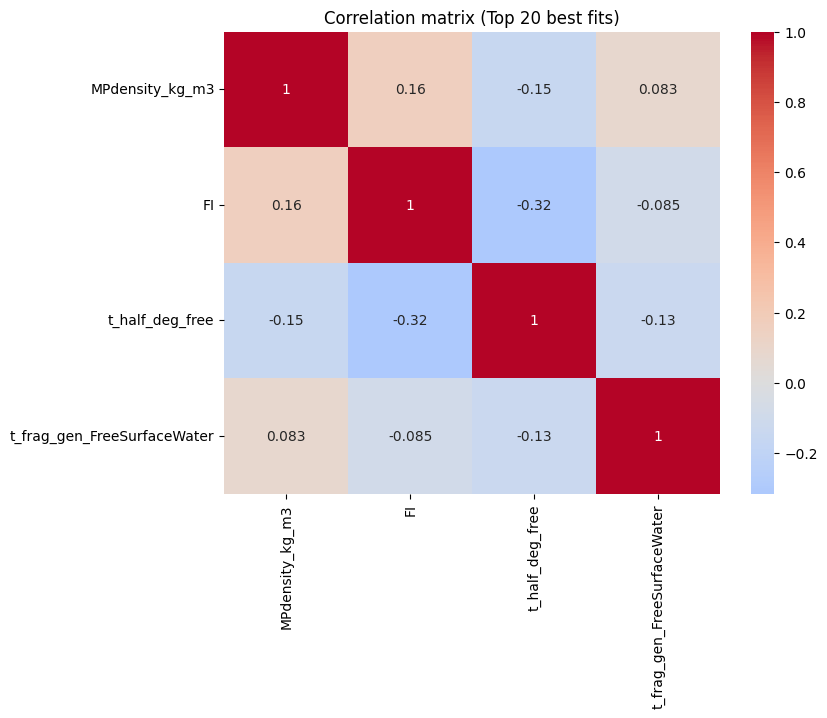

Running Monte Carlo analysis for article: Fibers in sediment | Eo
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Running cases:  12%|█▏        | 6/50 [00:13<01:36,  2.19s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:27,  2.13s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:53,  2.13s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packag

Simulation complete! Runtime: 0:01:47.927045
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:34,  2.15s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:33,  2.28s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:48<01:00,  2.17s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:55<00:59,  2.37s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:54.969620
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:35,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:01,  2.18s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:54<00:54,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  76%|███████▌  | 38/50 [01:22<00:26,  2.20s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-pack

Simulation complete! Runtime: 0:01:48.393039
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:33,  2.13s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:19<01:30,  2.20s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:53,  2.14s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:47.829998
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:36,  2.19s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  18%|█▊        | 9/50 [00:20<01:34,  2.31s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:52<01:11,  2.56s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [01:00<01:02,  2.49s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packa

Simulation complete! Runtime: 0:01:55.309034
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:12<01:35,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:47<01:00,  2.16s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:53<00:54,  2.18s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  76%|███████▌  | 38/50 [01:21<00:25,  2.11s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-pack

Simulation complete! Runtime: 0:01:47.963785


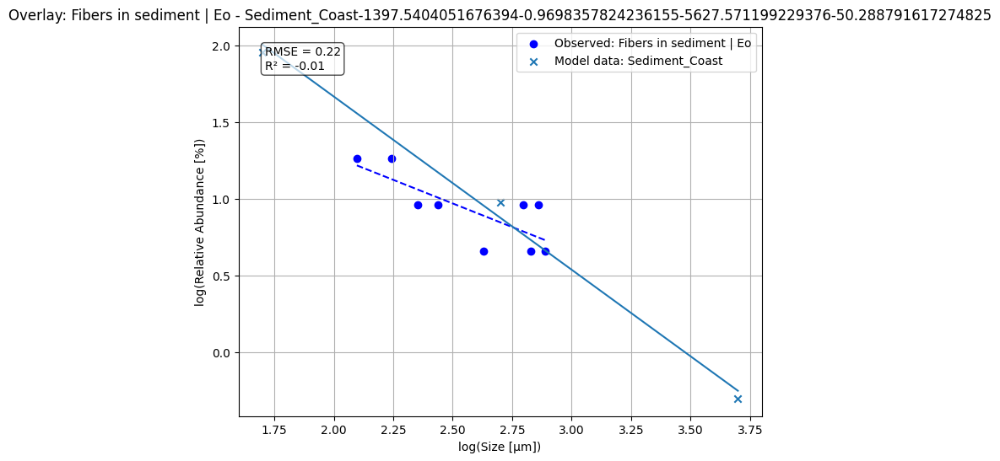

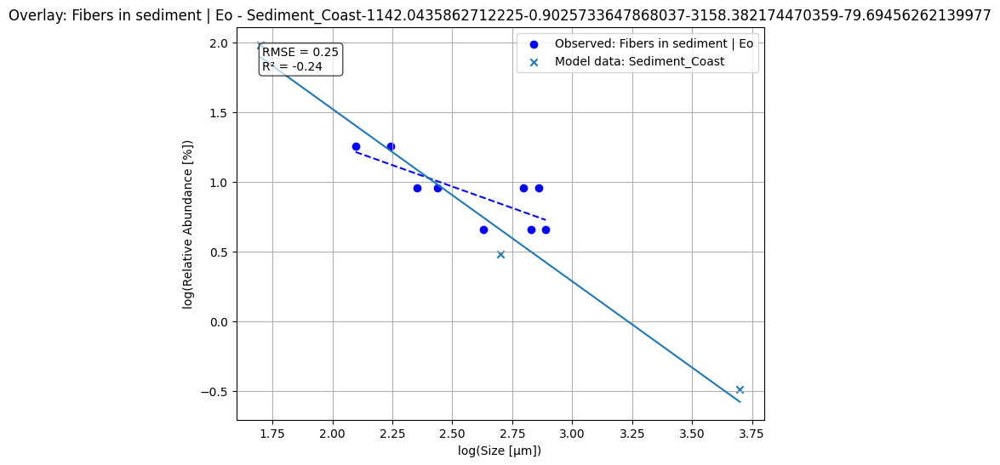

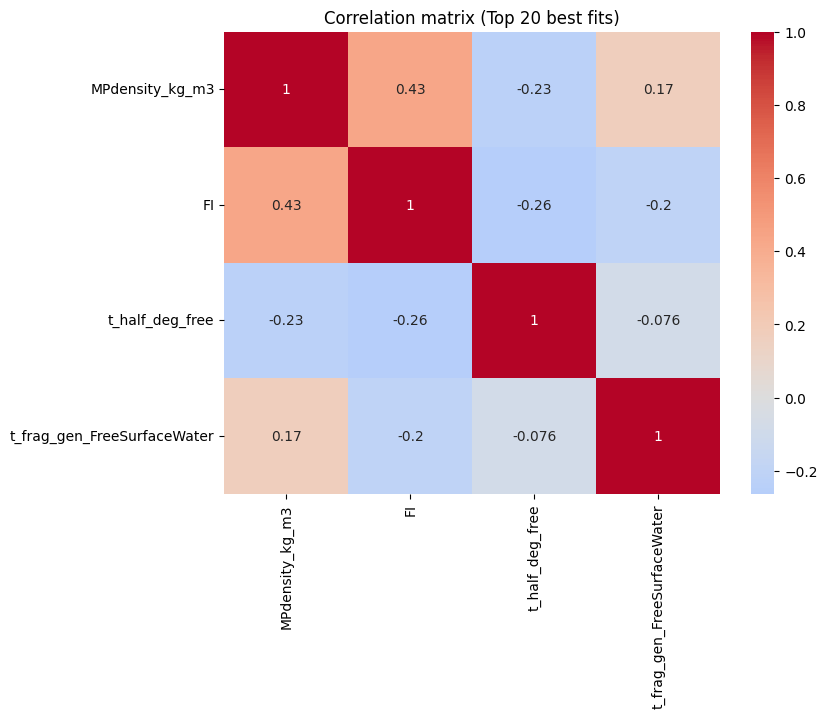

Running Monte Carlo analysis for article: Sea Surface all | Erni-Cassola
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 4097.92 cases/s]

Simulation complete! Runtime: 0:01:51.331759
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:50.935309
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 4104.98 cases/s]

Simulation complete! Runtime: 0:01:48.481834
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 27973.22 cases/s]

Simulation complete! Runtime: 0:01:54.277329


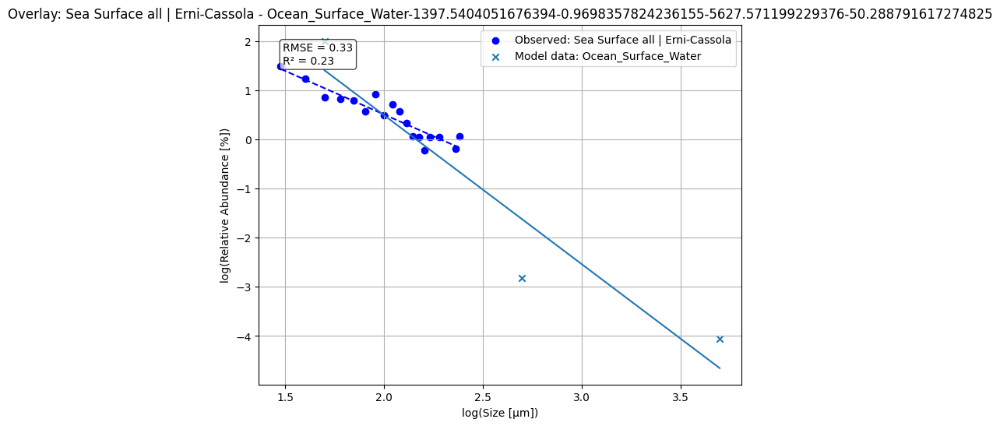

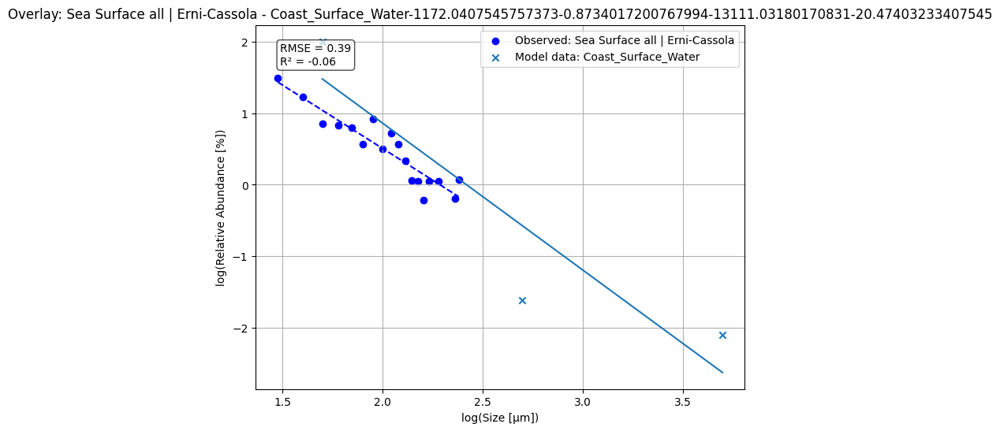

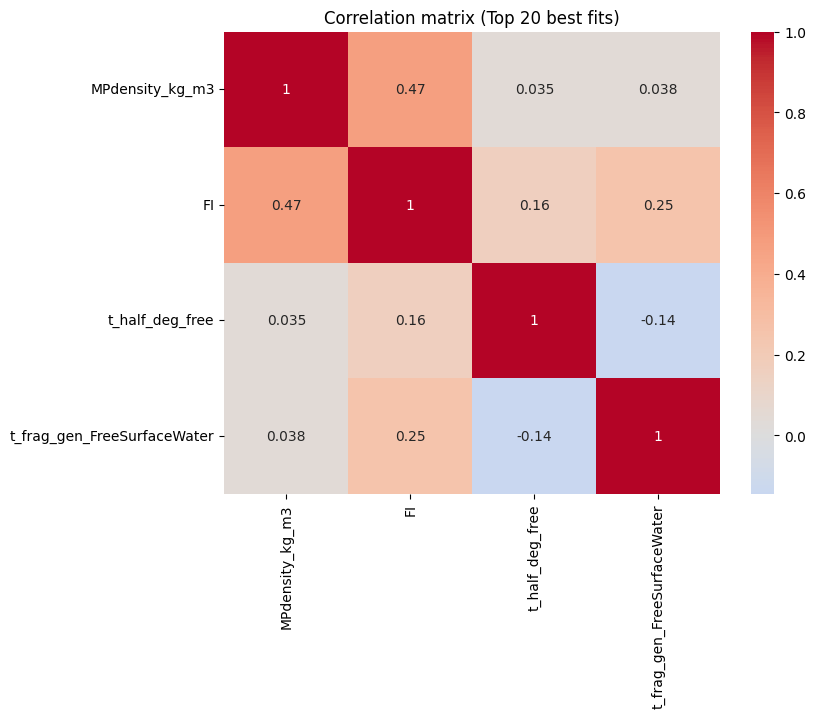

Running Monte Carlo analysis for article: Fresh water sediments | Imhof
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:49.947536
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:02:05.723527
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 11941.42 cases/s]

Simulation complete! Runtime: 0:01:56.139823
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 22472.70 cases/s]

Simulation complete! Runtime: 0:01:49.610685


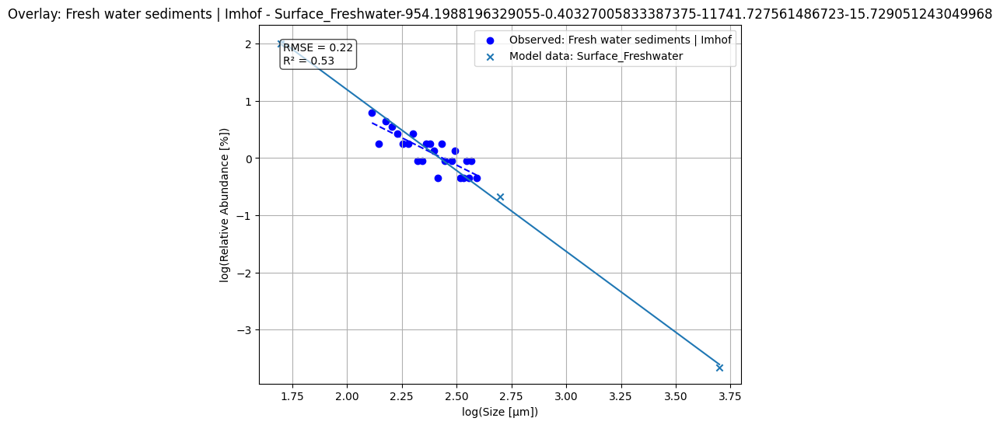

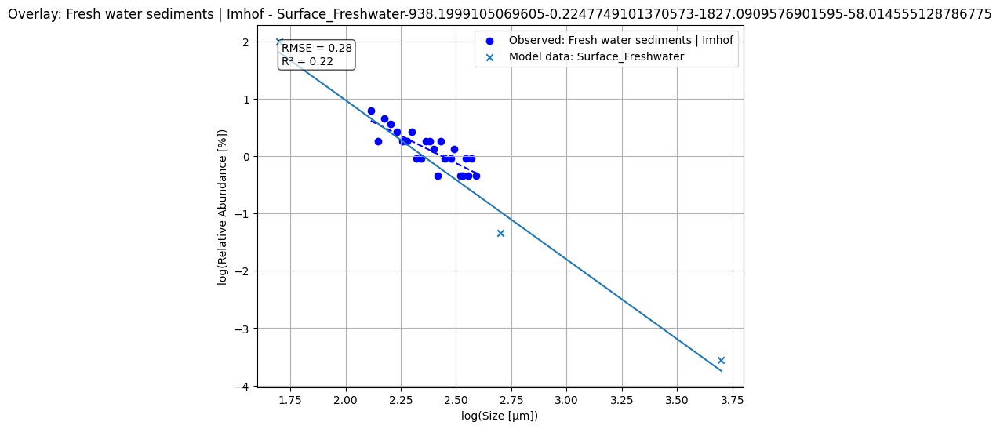

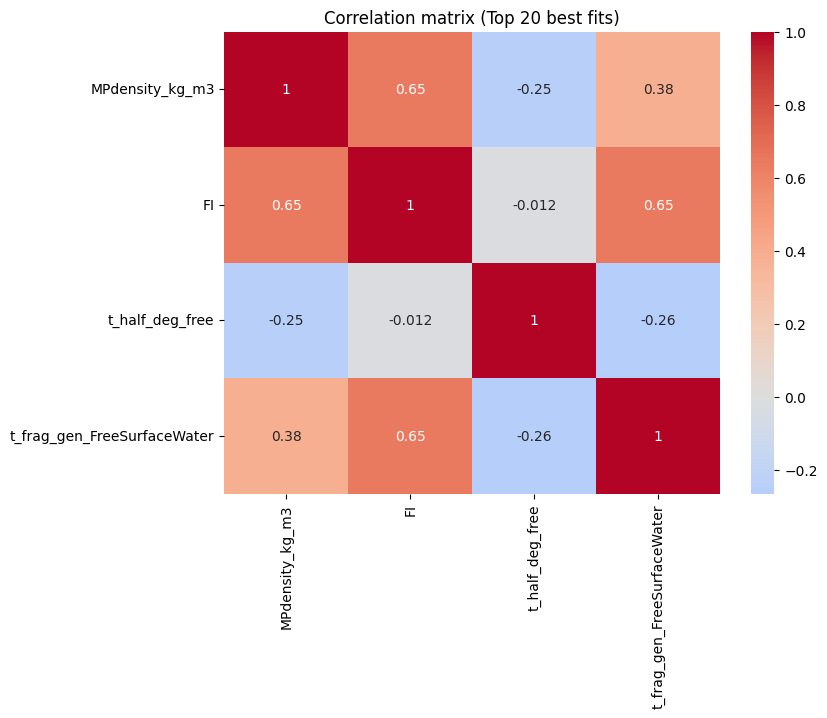

Running Monte Carlo analysis for article: Sea Surface all | Isobe L1
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:54.251939
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 6579.09 cases/s]

Simulation complete! Runtime: 0:01:49.271838
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:49.038457
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:55.353365


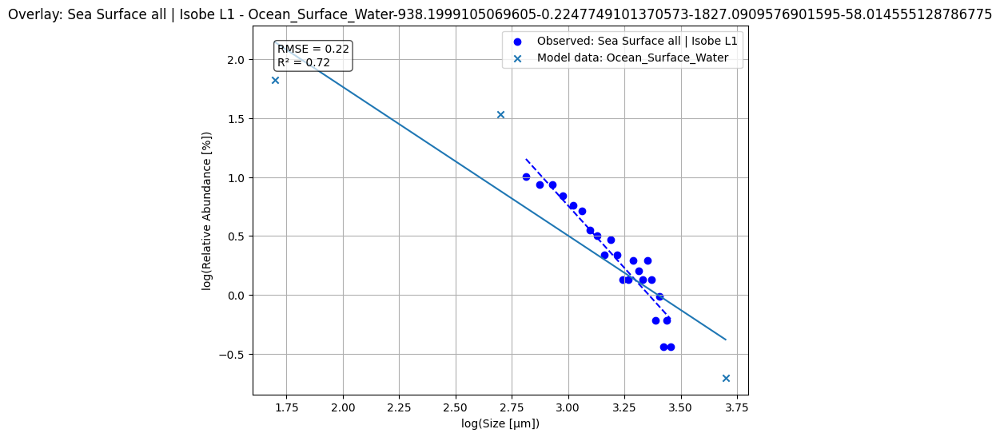

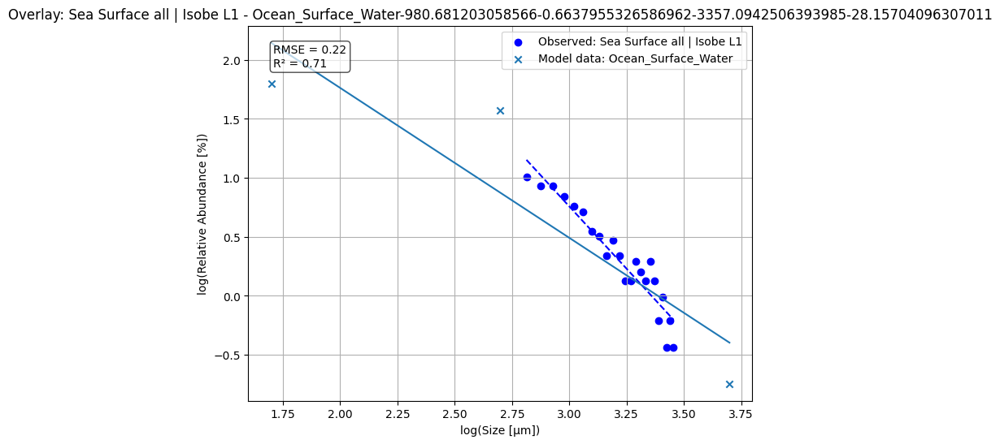

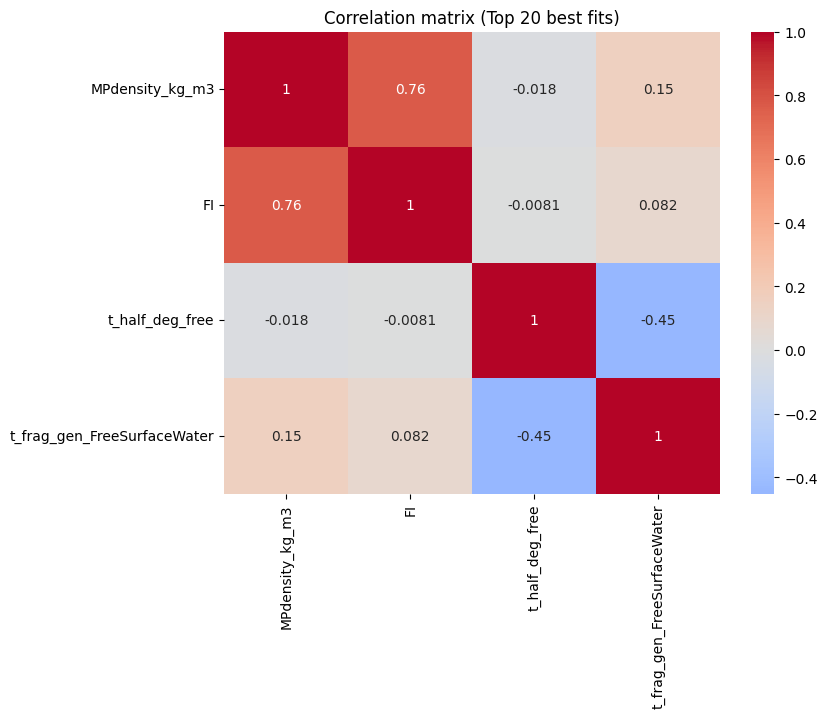

Running Monte Carlo analysis for article: Sea Surface all | Isobe L2
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:48.444155
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 8115.60 cases/s]

Simulation complete! Runtime: 0:01:48.729665
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 2984.21 cases/s]

Simulation complete! Runtime: 0:01:54.760419
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:49.039884


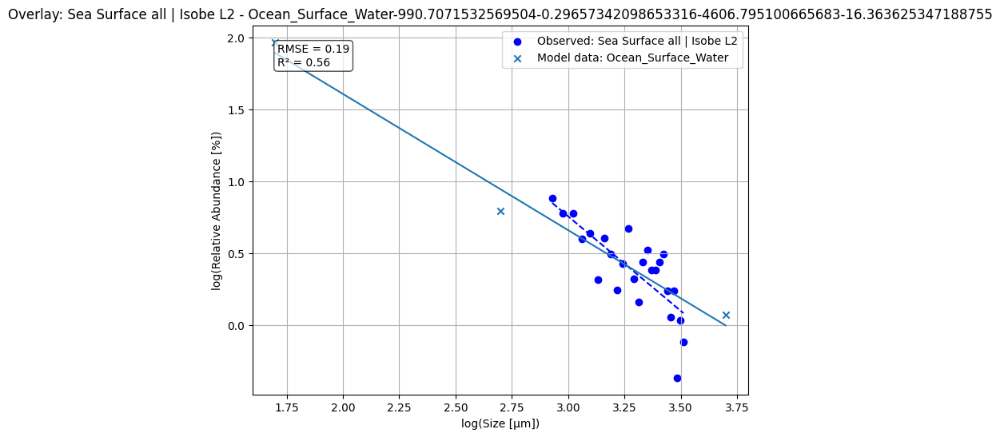

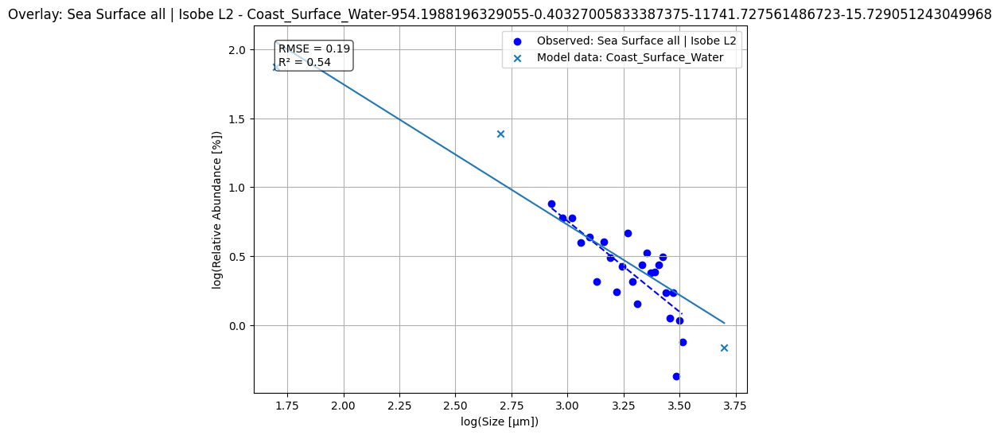

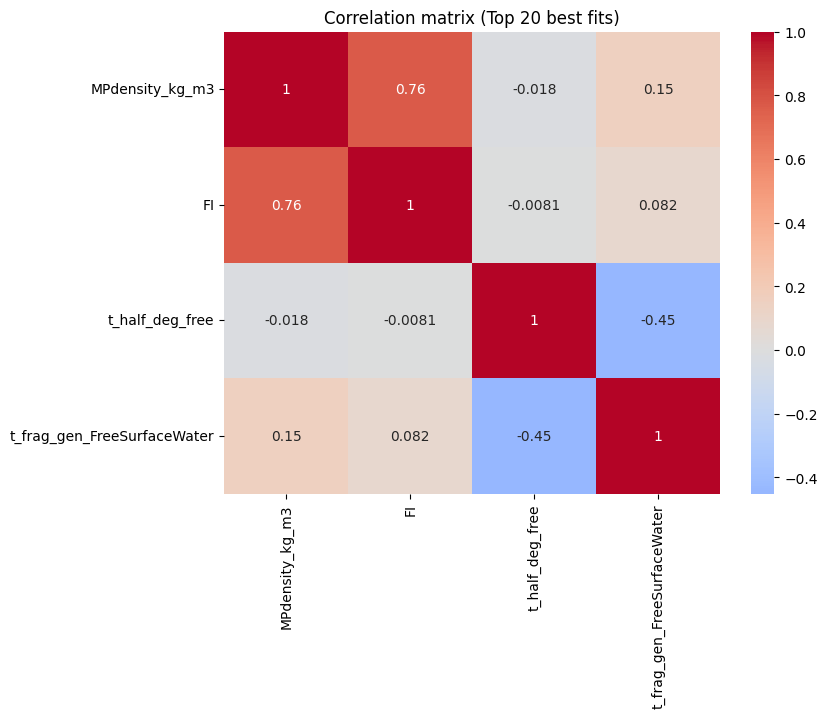

Running Monte Carlo analysis for article: Sea Surface all | Isobe L3
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3993.28 cases/s]

Simulation complete! Runtime: 0:01:53.770974
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 8330.30 cases/s] 

Simulation complete! Runtime: 0:01:50.001323
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 11746.12 cases/s]

Simulation complete! Runtime: 0:01:48.371139
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 14928.47 cases/s]

Simulation complete! Runtime: 0:01:54.481897


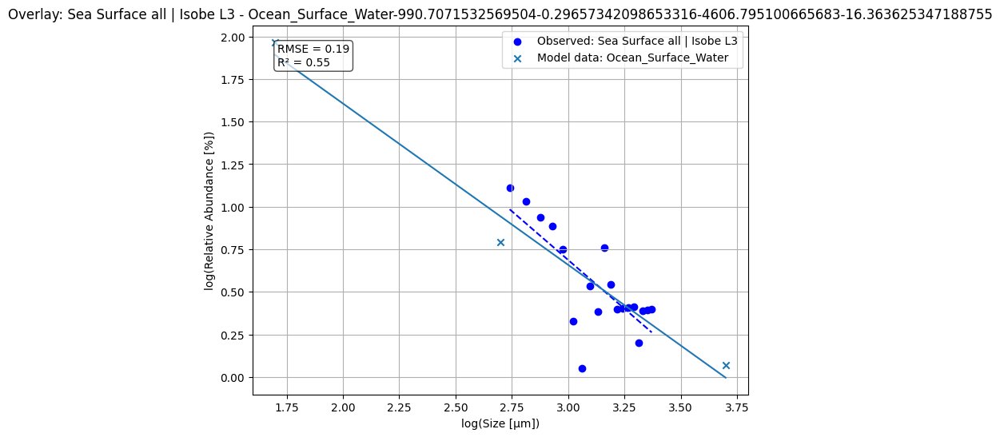

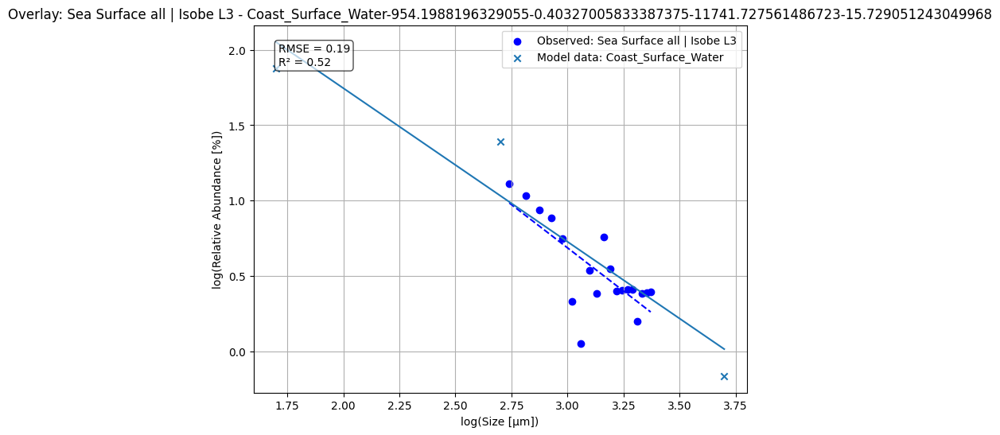

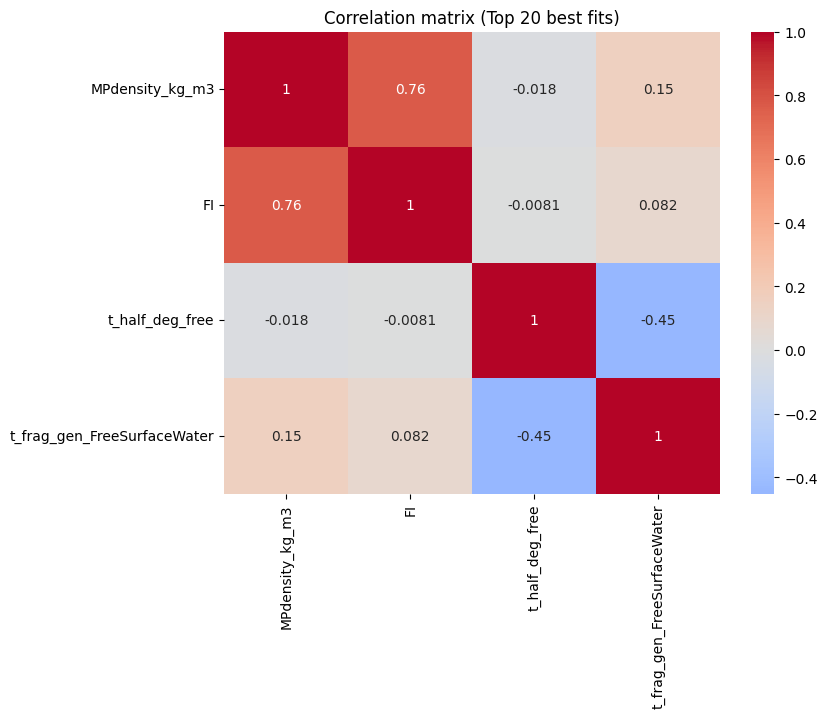

Running Monte Carlo analysis for article: Sea Surface all | Isobe L4
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 8519.47 cases/s]

Simulation complete! Runtime: 0:01:49.315701
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 4125.33 cases/s]

Simulation complete! Runtime: 0:01:48.775452
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:54.878026
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 10524.70 cases/s]

Simulation complete! Runtime: 0:01:49.320254


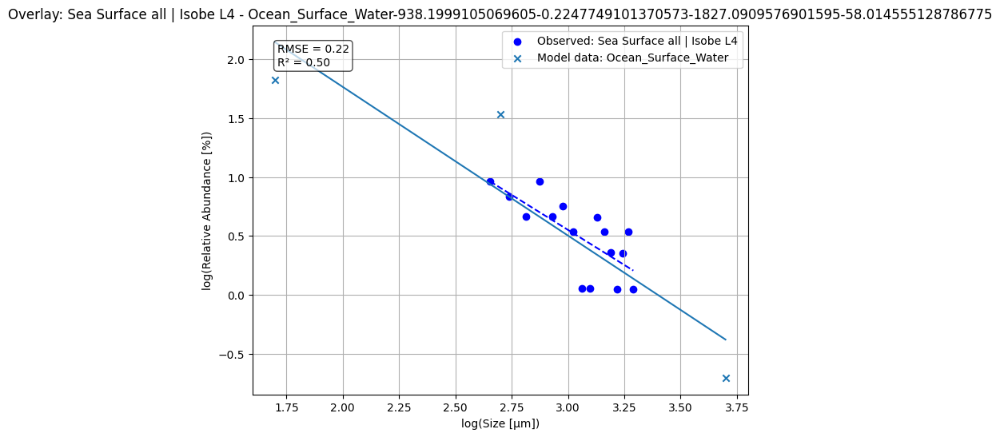

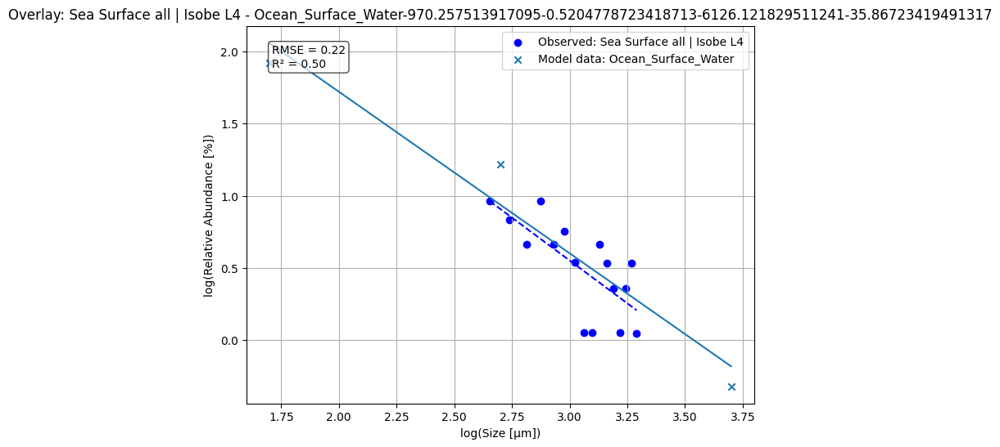

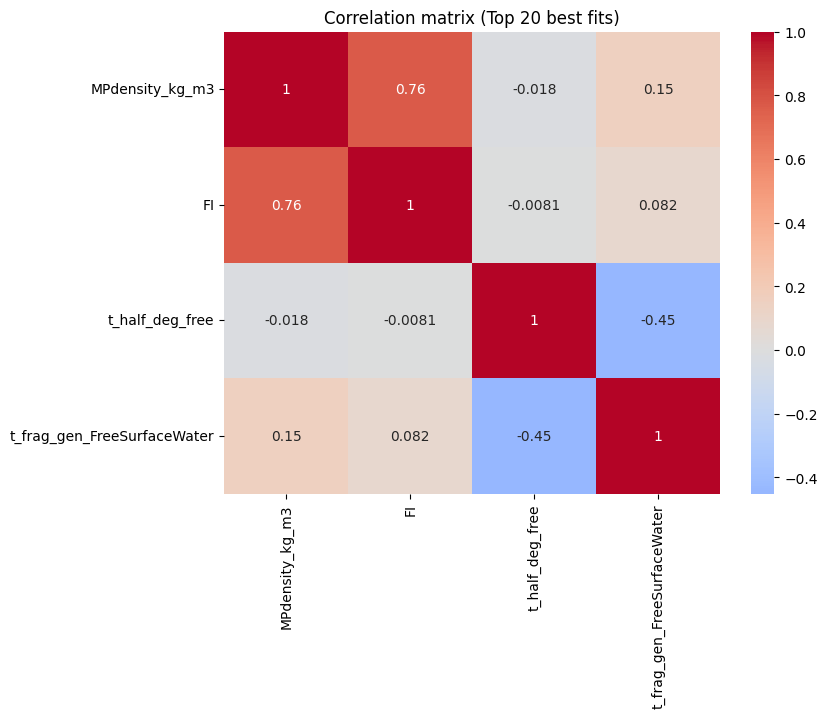

Running Monte Carlo analysis for article: FP all | Scheurer
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 10543.75 cases/s]

Simulation complete! Runtime: 0:01:53.700581
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Running cases:  12%|█▏        | 6/50 [00:13<01:40,  2.27s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  44%|████▍     | 22/50 [00:48<01:02,  2.24s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  50%|█████     | 25/50 [00:55<00:56,  2.28s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Running cases:  76%|███████▌  | 38/50 [01:24<00:26,  2.21s/ cases]c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-pack

Simulation complete! Runtime: 0:01:50.690577


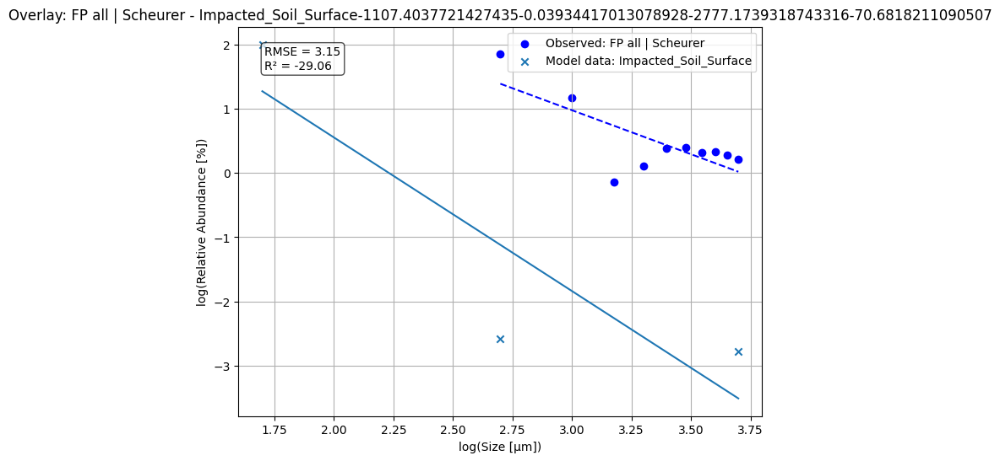

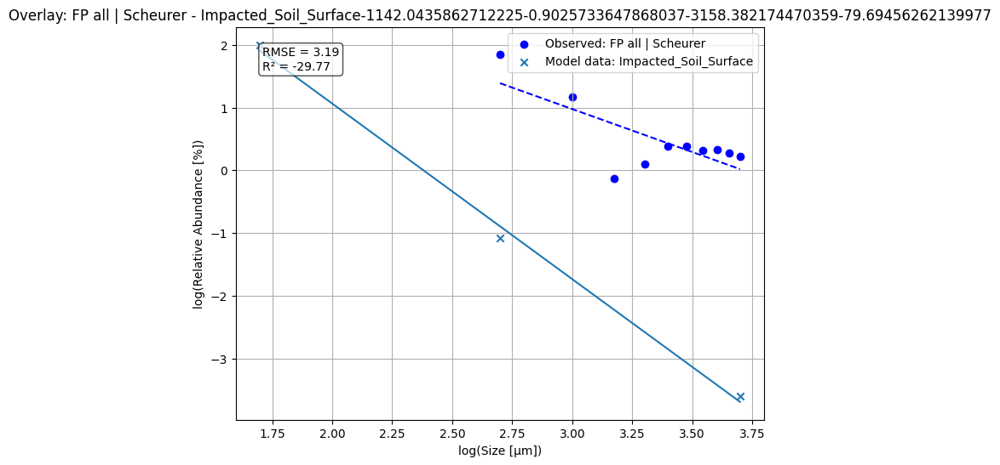

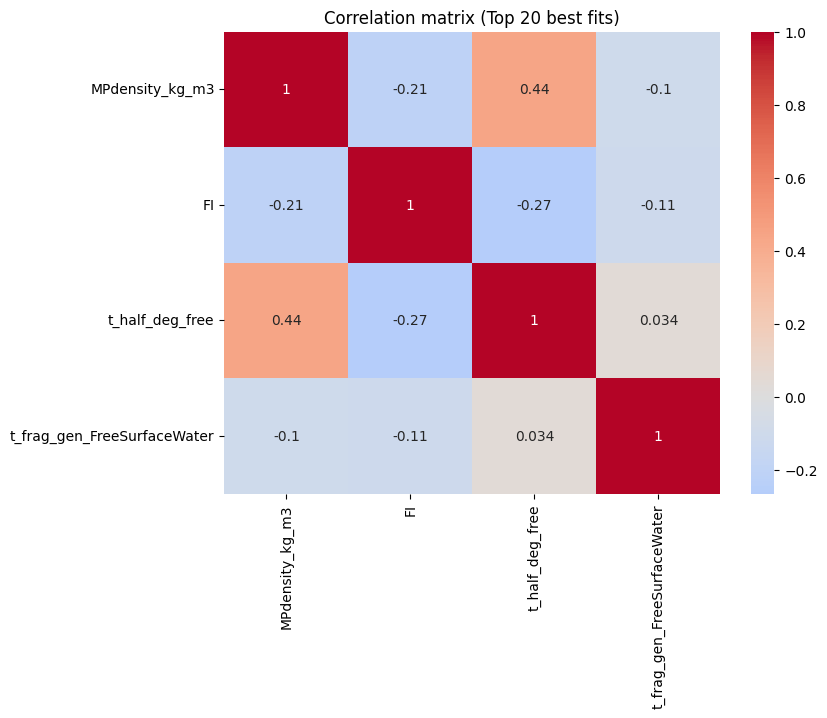

Running Monte Carlo analysis for article: Sea Surface Fragments | Song
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:49.037719
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 17036.17 cases/s]

Simulation complete! Runtime: 0:01:54.671361
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:48.389678
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:48.815054


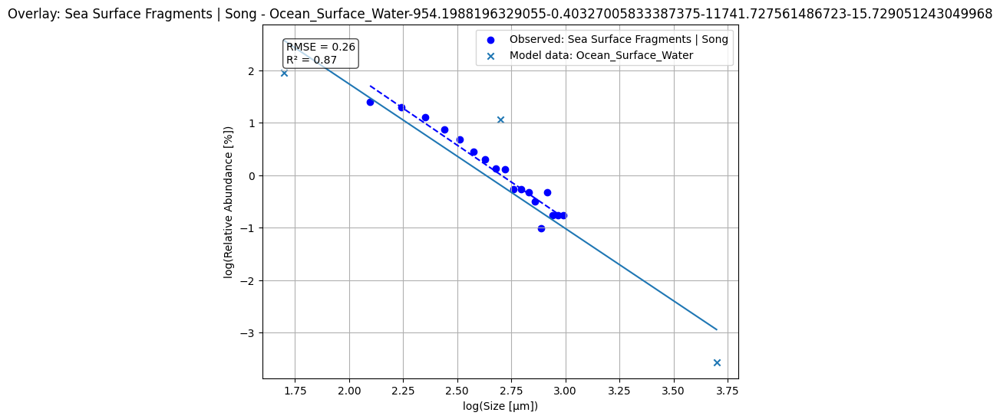

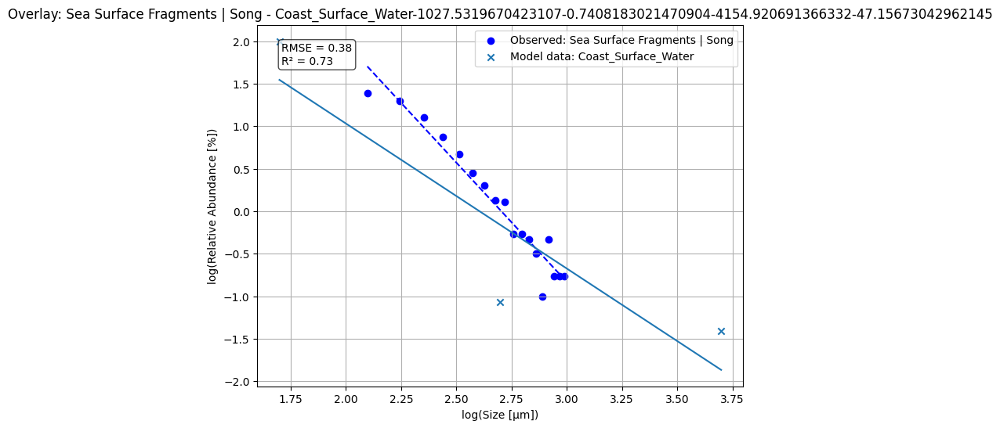

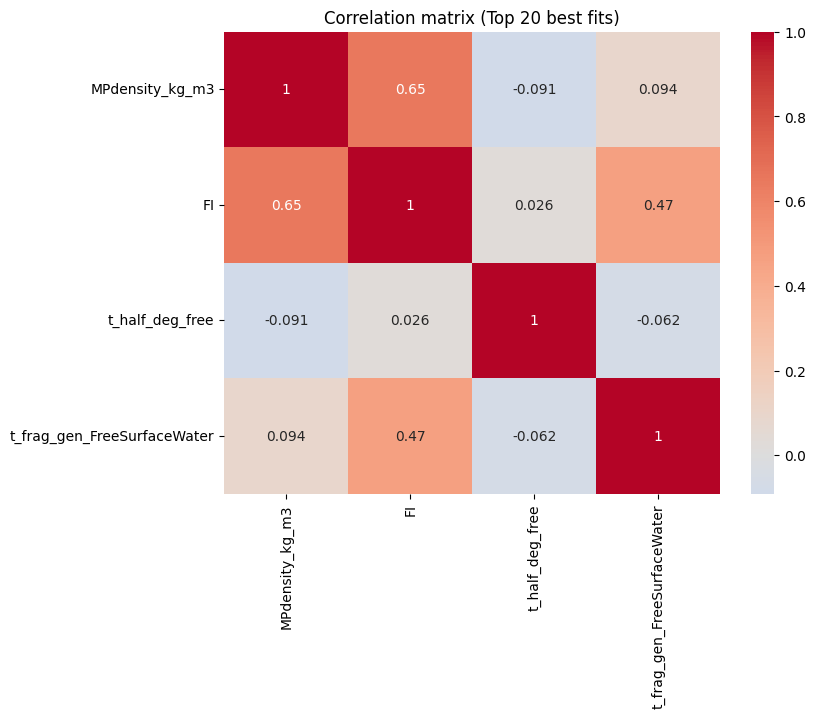

Running Monte Carlo analysis for article: Sea Surface Fibers | Song
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 10000.25 cases/s]

Simulation complete! Runtime: 0:01:54.199855
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3478.84 cases/s]

Simulation complete! Runtime: 0:01:49.113735
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<?, ? cases/s]

Simulation complete! Runtime: 0:01:55.050385
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 22400.68 cases/s]

Simulation complete! Runtime: 0:01:49.052715


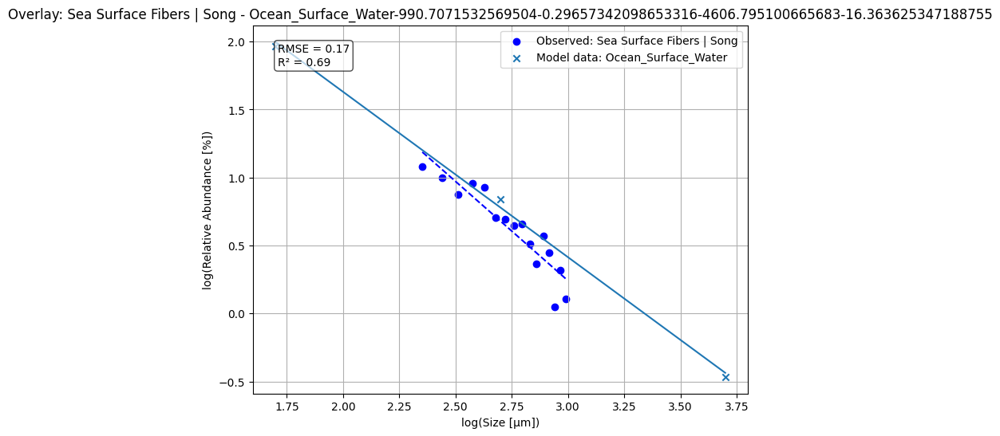

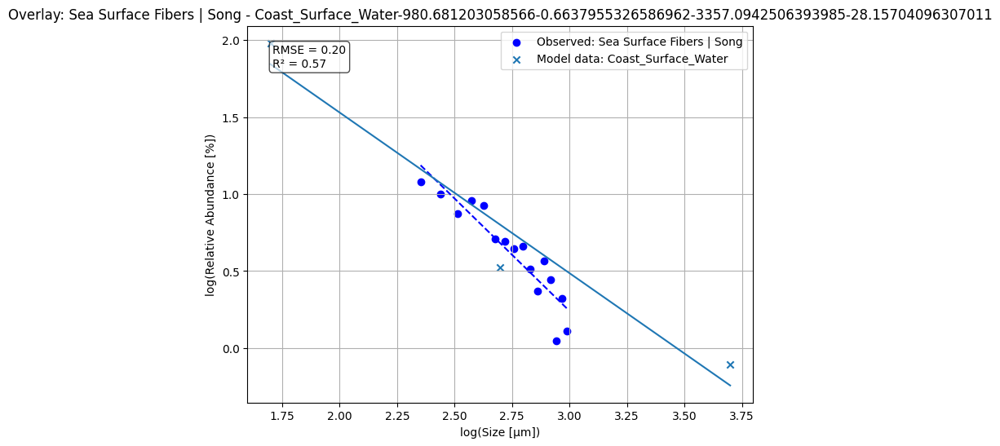

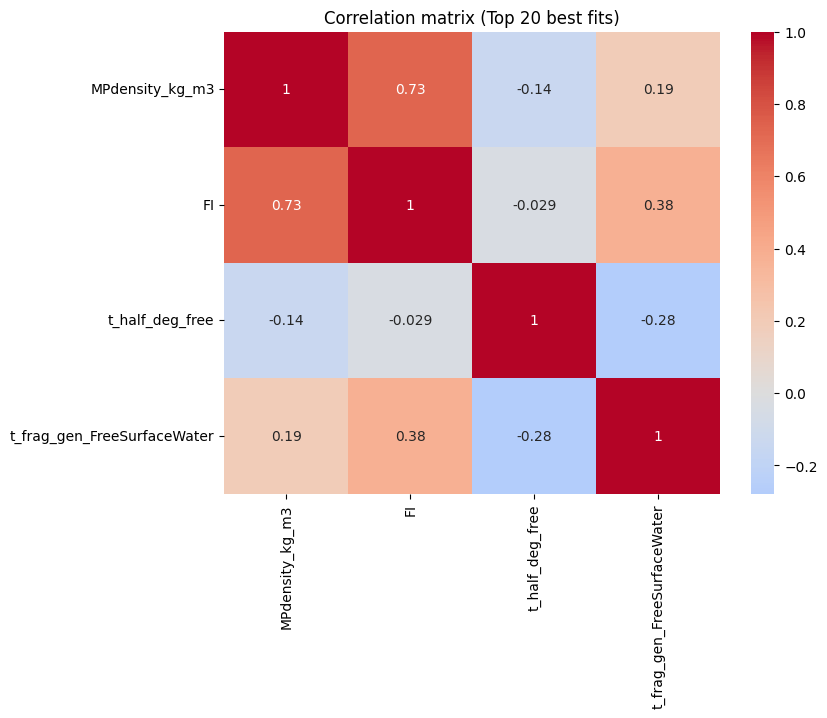

Running Monte Carlo analysis for article: Sea Surface all | Zhang
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done


Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 14485.09 cases/s]

Simulation complete! Runtime: 0:01:50.093893
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 9995.48 cases/s] 

Simulation complete! Runtime: 0:01:54.713449
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 3004.04 cases/s]

Simulation complete! Runtime: 0:01:50.641029
Running 'UTOPIA_MC_simulation' Monte Carlo simulation with 50/50 cases...
Drawing random samples for 4 input variables via the 'sobol_random' method... Done
Generating cases... Done



Postprocessing cases: 100%|██████████| 50/50 [00:00<00:00, 8125.66 cases/s] 

Simulation complete! Runtime: 0:01:49.789048


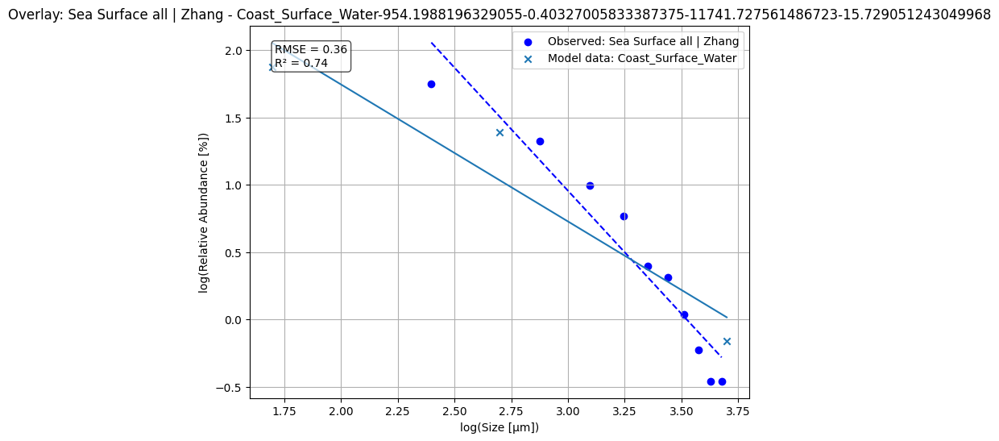

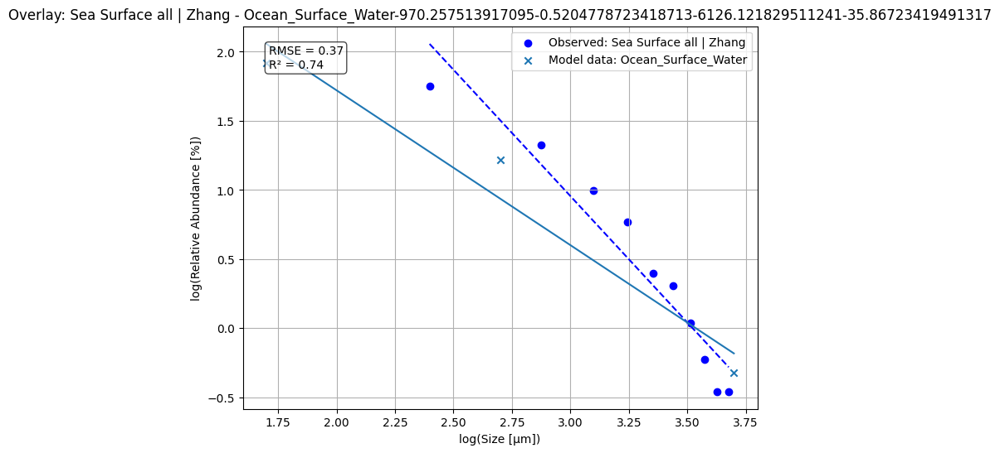

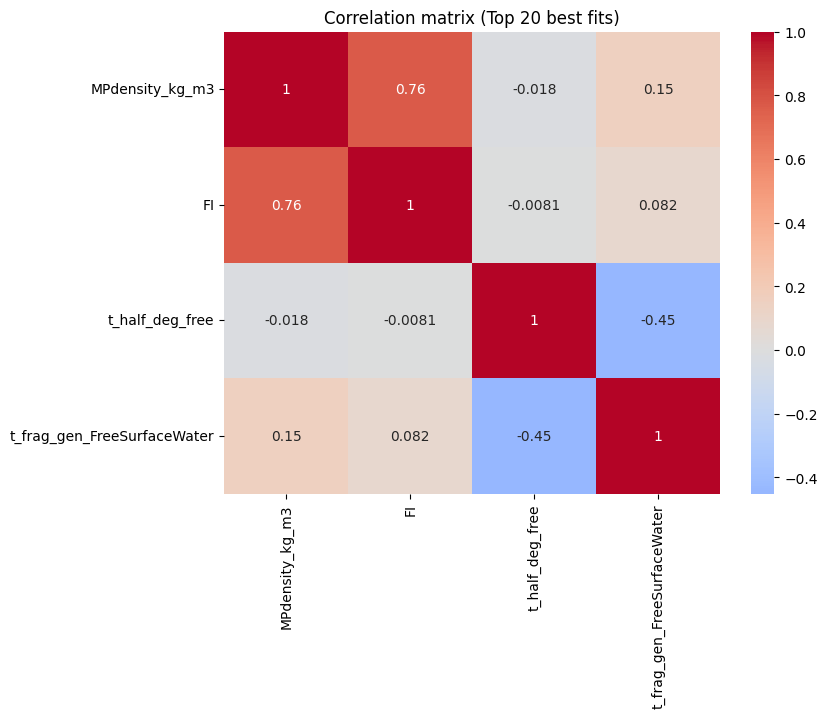

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
from utopia.monte_carlo.montecarlo_analysis_paper import run_and_plot_top_results

MC_simulations_results_all={}
for art in overlay_emission_scenarios.keys():
    print(f"Running Monte Carlo analysis for article: {art}")
    MC_simulations_results=[]
    for comp in overlay_emission_scenarios[art]:
        # Set emissions to that compartment and include it in base_data file
        data_data["emiss_dict_g_s"]= set_emission(data_data["emiss_dict_g_s"].copy(), comp, "e", 100)
        
        
        #Run Monte Carlo analysis for each emission scenario and targer compartment
        for comp_T in overlay_compartments_mapping[art]:
            emission_comp=comp
            target_comp=comp_T
            sim= run_mc_analysis_paper(
            base_config=config_data,
            base_data=data_data,
            param_distributions=param_distributions,
            n_cases=50,art=art,emission_comp=emission_comp,target_comp=target_comp
        )
        
            # Convert sim results to dataframe
            df_MC_results = sim_to_dataframe(sim)
            
            
            MC_simulations_results.append(df_MC_results)
    MC_simulations_results = pd.concat(MC_simulations_results, ignore_index=True)
    input_params=["MPdensity_kg_m3", "FI", "t_half_deg_free", "t_frag_gen_FreeSurfaceWater"]
    tidy_mc_results=reshape_mc_results(MC_simulations_results, input_params, art)
    results_sorted_art = tidy_mc_results.sort_values("RMSE", ascending=True)
    # Keep e.g. top 20 best-fitting combinations
    top_results_art = results_sorted_art.head(20)
    run_and_plot_top_results(top_results_art[0:2],data_data, config_data)
    

    # Correlation heatmap for the top results
    corr = top_results_art[0:20][["MPdensity_kg_m3", "FI", "t_half_deg_free", "t_frag_gen_FreeSurfaceWater"]].corr()

    plt.figure(figsize=(8,6))
    sns.heatmap(corr, annot=True, cmap="coolwarm", center=0)
    plt.title("Correlation matrix (Top 20 best fits)")
    plt.show()
    
    
    MC_simulations_results_all[art]=top_results_art
    
    
        

In [30]:
combined_df = pd.concat(MC_simulations_results_all.values(), ignore_index=True)

In [31]:
combined_df

,Case,Observed_dataset,Emission_Compartment,Target_Compartment,RMSE,R2,Slope,Spearman_r,Pass_Spearman,MPdensity_kg_m3,FI,t_half_deg_free,t_frag_gen_FreeSurfaceWater
0,294,Sea Sediment | Bergmann,Coast_Column_Water,Sediment_Ocean,0.290099,-0.378658,-2.909771,-1.0,True,1156.890442,0.466481,1919.420809,21.279529
1,194,Sea Sediment | Bergmann,Coast_Surface_Water,Sediment_Ocean,0.295999,-0.435307,-2.883242,-1.0,True,1156.890442,0.466481,1919.420809,21.279529
2,258,Sea Sediment | Bergmann,Coast_Column_Water,Sediment_Ocean,0.306841,-0.542379,-2.655127,-1.0,True,1334.859380,0.269348,2665.785177,31.280483
3,158,Sea Sediment | Bergmann,Coast_Surface_Water,Sediment_Ocean,0.314419,-0.619506,-2.627525,-1.0,True,1334.859380,0.269348,2665.785177,31.280483
4,276,Sea Sediment | Bergmann,Coast_Column_Water,Sediment_Ocean,0.315231,-0.627886,-2.743540,-1.0,True,1077.506525,0.422796,3492.064242,44.690758
...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,43,Sea Surface all | Zhang,Coast_Surface_Water,Coast_Surface_Water,1.883332,-5.893155,-1.835870,-1.0,True,1209.526294,0.950314,3983.784537,10.687603
356,103,Sea Surface all | Zhang,Surface_Freshwater,Coast_Surface_Water,1.924554,-6.198213,-1.826492,-1.0,True,1142.043586,0.902573,3158.382174,79.694563
357,129,Sea Surface all | Zhang,Surface_Freshwater,Coast_Surface_Water,2.035415,-7.051384,-1.950304,-1.0,True,1102.540686,0.906506,4965.649411,61.779684
358,17,Sea Surface all | Zhang,Coast_Surface_Water,Coast_Surface_Water,2.048385,-7.154314,-1.925818,-1.0,True,1052.671922,0.811533,3073.415520,14.554329


In [32]:
# Save results to csv
combined_df.to_csv("UTOPIA_paper_results_long.csv", index=False)

Top 20 best fitting results for each observed dataset

In [33]:
# Read data from CSV if needed
combined_results = pd.read_csv("UTOPIA_paper_results.csv")
df=combined_results.copy()

In [34]:
combined_results_shorted=combined_df.sort_values("RMSE", ascending=True)
combined_results_shorted

,Case,Observed_dataset,Emission_Compartment,Target_Compartment,RMSE,R2,Slope,Spearman_r,Pass_Spearman,MPdensity_kg_m3,FI,t_half_deg_free,t_frag_gen_FreeSurfaceWater
320,172,Sea Surface Fibers | Song,Surface_Freshwater,Ocean_Surface_Water,0.165232,0.694254,-1.216664,-1.0,True,990.707153,0.296573,4606.795101,16.363625
220,172,Sea Surface all | Isobe L2,Coast_Surface_Water,Ocean_Surface_Water,0.187883,0.563015,-0.947614,-1.0,True,990.707153,0.296573,4606.795101,16.363625
240,172,Sea Surface all | Isobe L3,Coast_Surface_Water,Ocean_Surface_Water,0.188438,0.550417,-0.947614,-1.0,True,990.707153,0.296573,4606.795101,16.363625
221,38,Sea Surface all | Isobe L2,Surface_Freshwater,Coast_Surface_Water,0.192658,0.540521,-1.017510,-1.0,True,954.198820,0.403270,11741.727561,15.729051
222,6,Sea Surface all | Isobe L2,Surface_Freshwater,Coast_Surface_Water,0.192740,0.540131,-0.926349,-1.0,True,938.199911,0.224775,1827.090958,58.014555
...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,24,FP all | Scheurer,Impacted_Soil_Surface,Impacted_Soil_Surface,3.569895,-37.591433,-2.736023,-1.0,True,1283.675473,0.213213,4250.619555,88.914569
296,4,FP all | Scheurer,Impacted_Soil_Surface,Impacted_Soil_Surface,3.585547,-37.930575,-2.752834,-1.0,True,1183.945885,0.387262,4865.625691,162.674424
297,23,FP all | Scheurer,Impacted_Soil_Surface,Impacted_Soil_Surface,3.597856,-38.198326,-3.079429,-1.0,True,1397.540405,0.969836,5627.571199,50.288792
298,12,FP all | Scheurer,Impacted_Soil_Surface,Impacted_Soil_Surface,3.620077,-38.684019,-2.837739,-1.0,True,1170.689441,0.163532,10975.160488,41.971349


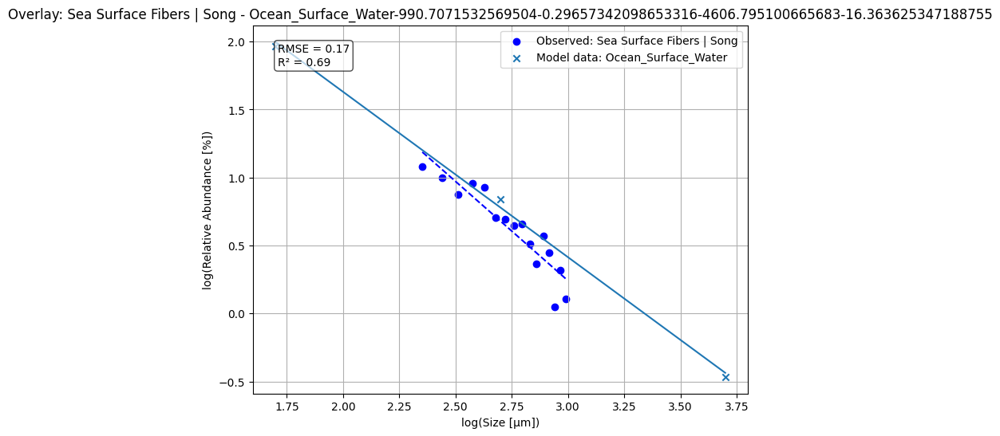

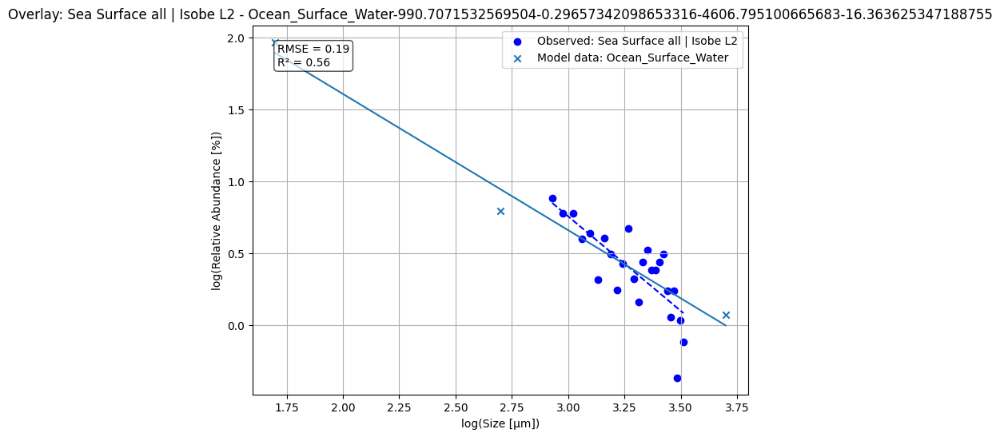

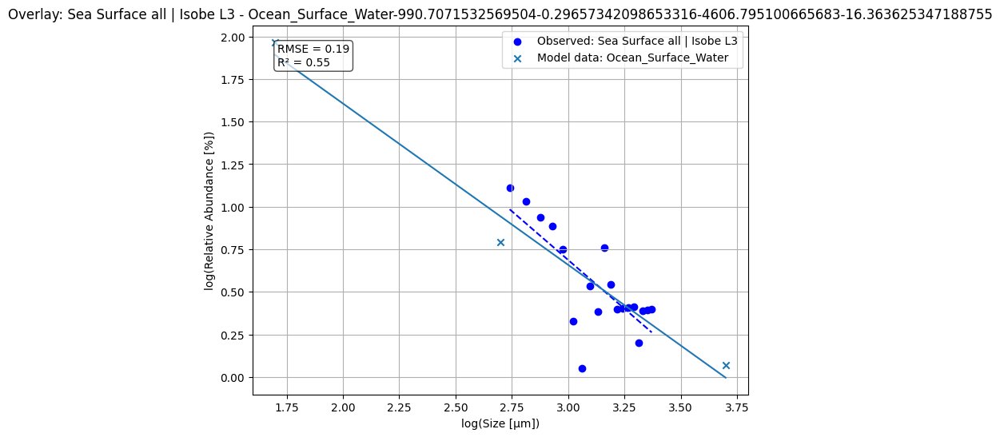

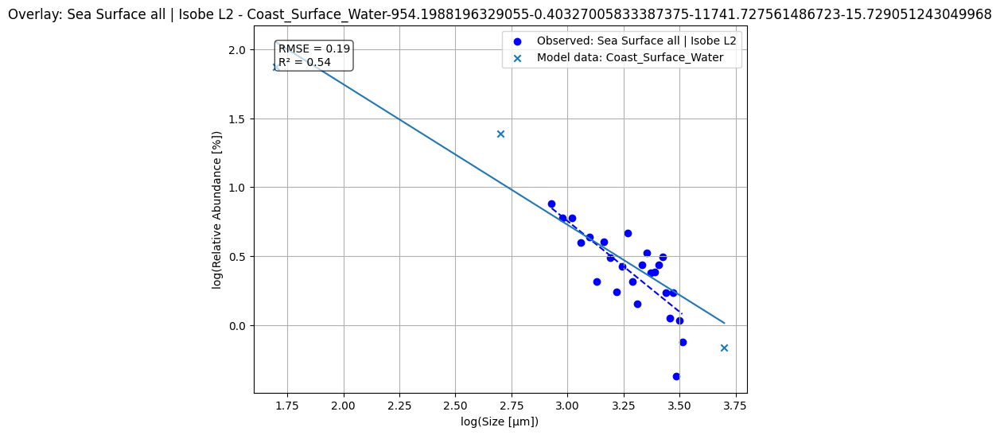

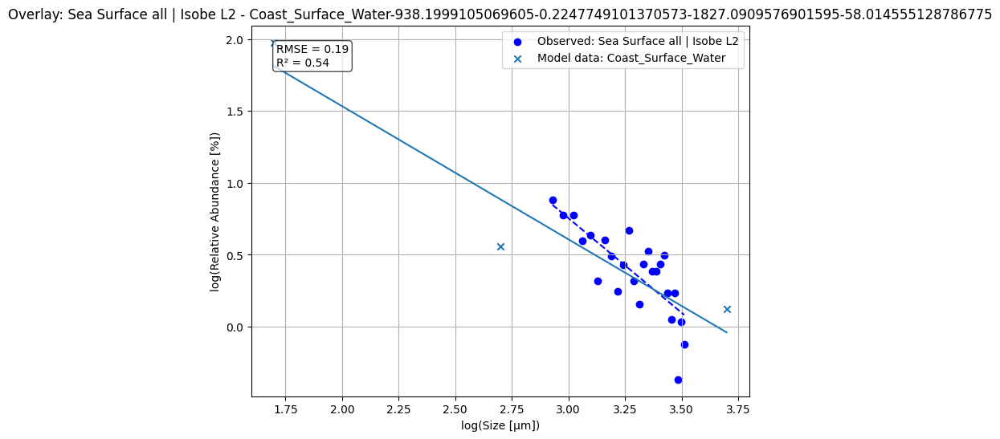

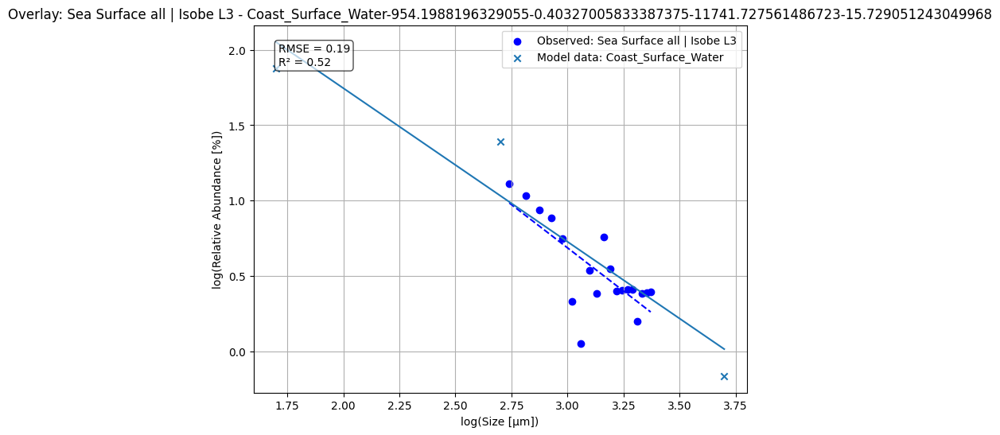

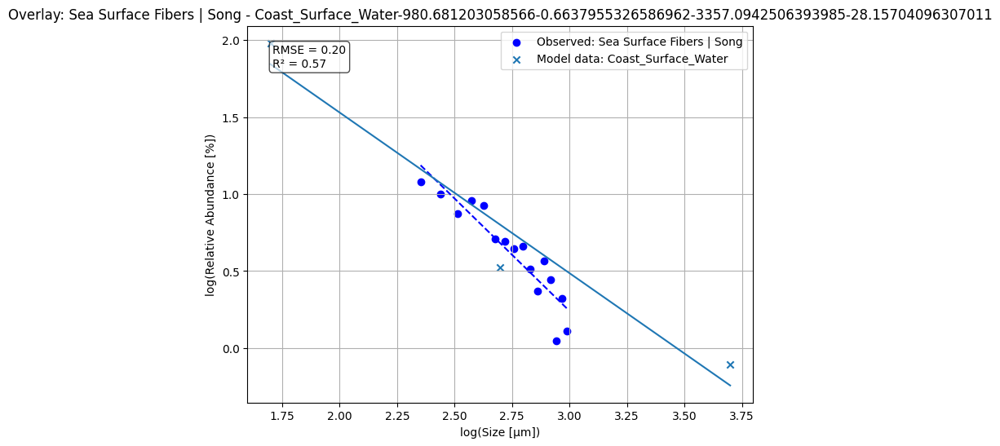

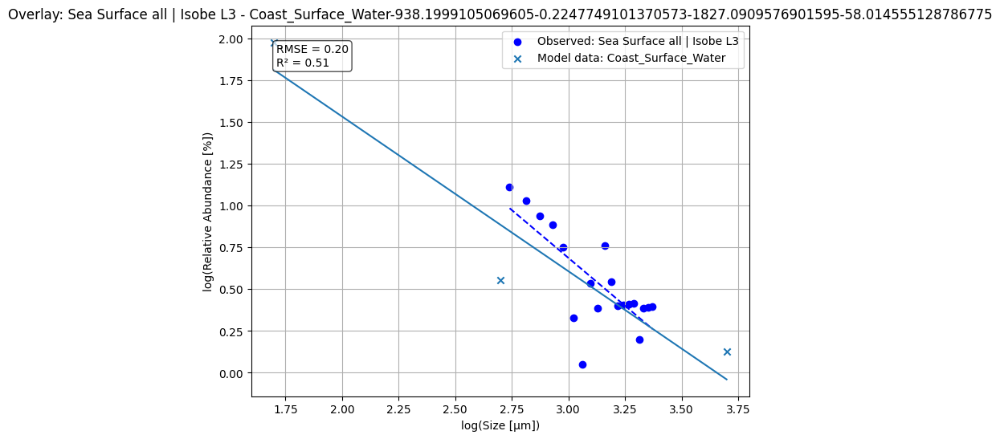

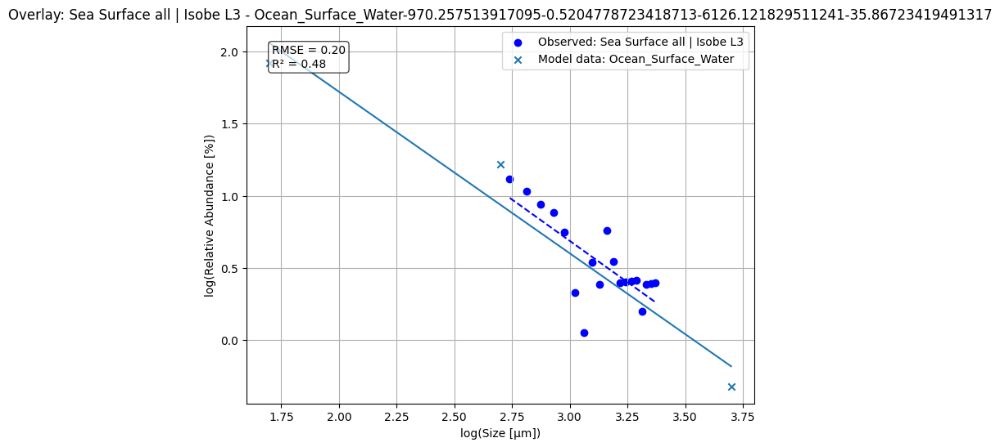

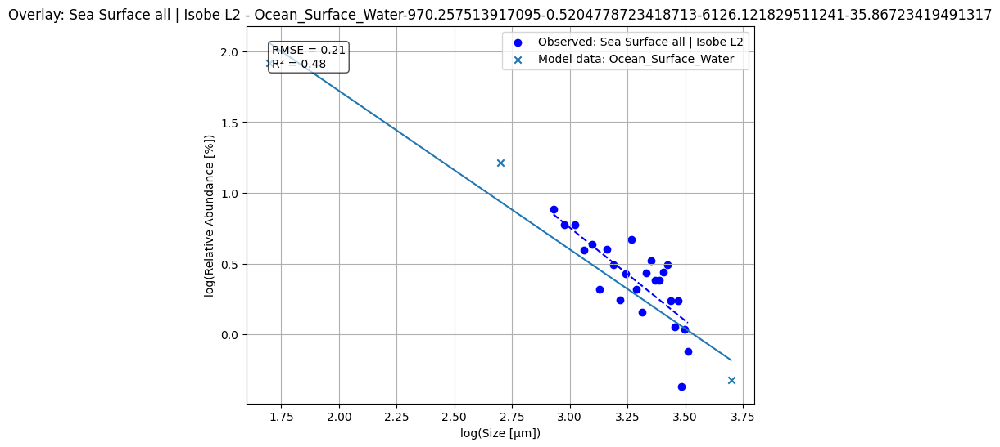

In [35]:

from utopia.monte_carlo.montecarlo_analysis_paper import run_and_plot_top_results
run_and_plot_top_results(combined_results_shorted[0:10],data_data, config_data)

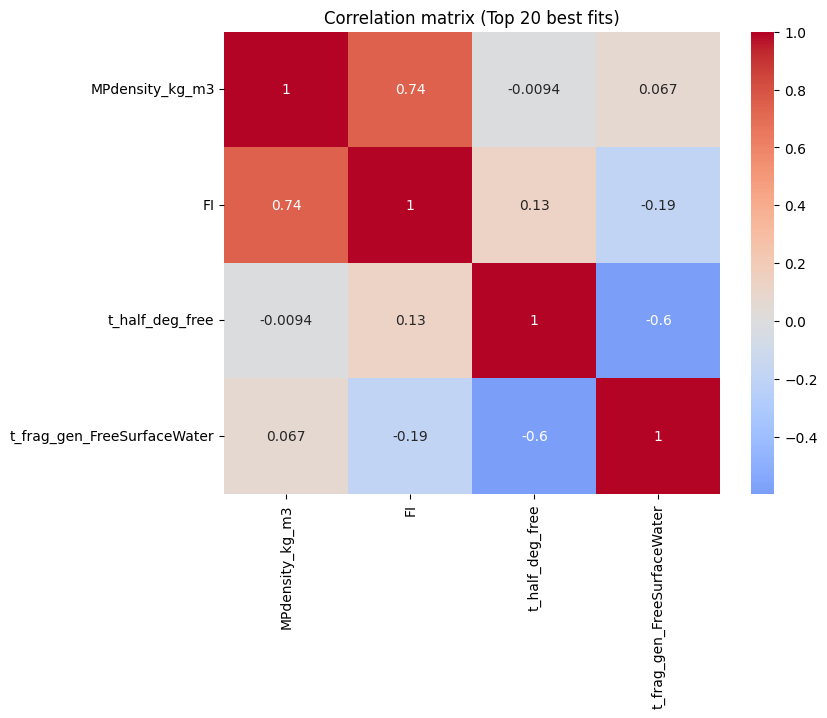

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation heatmap for the top results
corr = combined_results_shorted[0:19][["MPdensity_kg_m3", "FI", "t_half_deg_free", "t_frag_gen_FreeSurfaceWater"]].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation matrix (Top 20 best fits)")
plt.show()

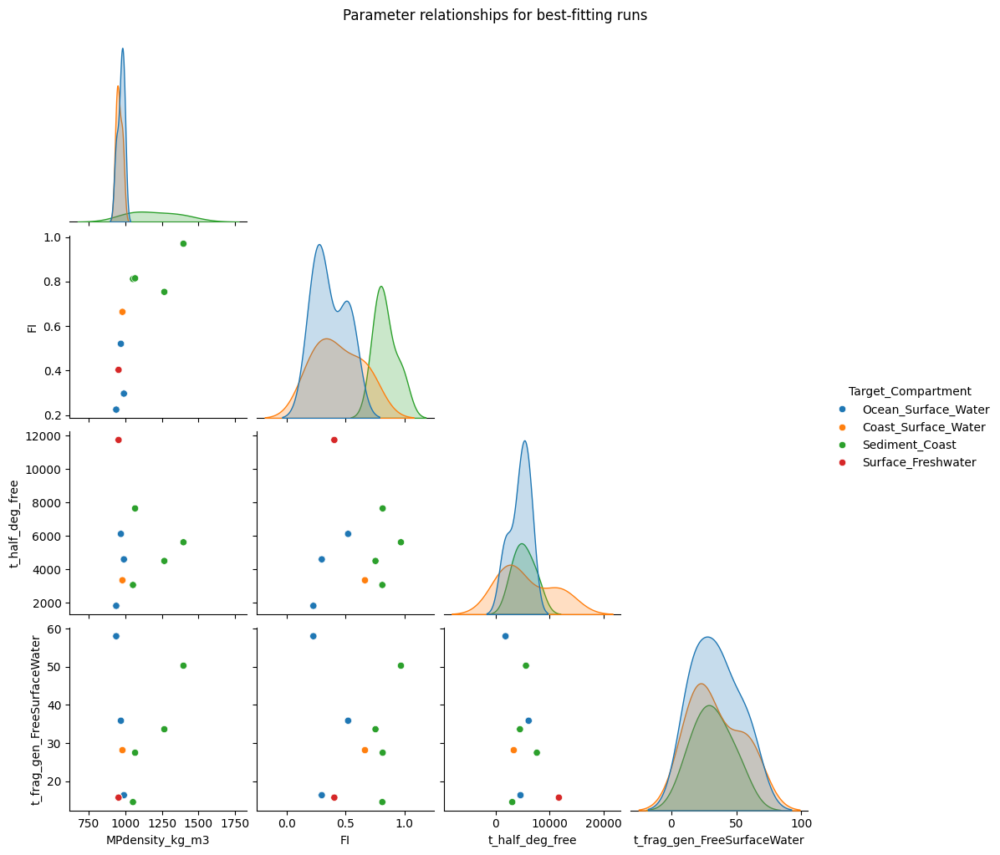

In [37]:
# Pair-wise relationships for the top results
sns.pairplot(
    combined_results_shorted[0:19],
    vars=["MPdensity_kg_m3", "FI", "t_half_deg_free", "t_frag_gen_FreeSurfaceWater"],
    hue="Target_Compartment",
    corner=True
)
plt.suptitle("Parameter relationships for best-fitting runs", y=1.02)
plt.show()

 After the model has ben run recover results from csv and load them again

In [38]:
# Read data from CSV if needed
combined_results = pd.read_csv("UTOPIA_paper_results_long.csv")
df=combined_results.copy()

In [39]:
combined_results_shorted=df.sort_values("RMSE", ascending=True)

In [40]:
combined_results_shorted[0:20]

,Case,Observed_dataset,Emission_Compartment,Target_Compartment,RMSE,R2,Slope,Spearman_r,Pass_Spearman,MPdensity_kg_m3,FI,t_half_deg_free,t_frag_gen_FreeSurfaceWater
320,172,Sea Surface Fibers | Song,Surface_Freshwater,Ocean_Surface_Water,0.165232,0.694254,-1.216664,-1.0,True,990.707153,0.296573,4606.795101,16.363625
220,172,Sea Surface all | Isobe L2,Coast_Surface_Water,Ocean_Surface_Water,0.187883,0.563015,-0.947614,-1.0,True,990.707153,0.296573,4606.795101,16.363625
240,172,Sea Surface all | Isobe L3,Coast_Surface_Water,Ocean_Surface_Water,0.188438,0.550417,-0.947614,-1.0,True,990.707153,0.296573,4606.795101,16.363625
221,38,Sea Surface all | Isobe L2,Surface_Freshwater,Coast_Surface_Water,0.192658,0.540521,-1.017510,-1.0,True,954.198820,0.403270,11741.727561,15.729051
222,6,Sea Surface all | Isobe L2,Surface_Freshwater,Coast_Surface_Water,0.192740,0.540131,-0.926349,-1.0,True,938.199911,0.224775,1827.090958,58.014555
241,38,Sea Surface all | Isobe L3,Surface_Freshwater,Coast_Surface_Water,0.194665,0.520214,-1.017510,-1.0,True,954.198820,0.403270,11741.727561,15.729051
321,141,Sea Surface Fibers | Song,Surface_Freshwater,Coast_Surface_Water,0.195646,0.571334,-1.043427,-1.0,True,980.681203,0.663796,3357.094251,28.157041
242,6,Sea Surface all | Isobe L3,Surface_Freshwater,Coast_Surface_Water,0.196303,0.512105,-0.926349,-1.0,True,938.199911,0.224775,1827.090958,58.014555
243,75,Sea Surface all | Isobe L3,Surface_Freshwater,Ocean_Surface_Water,0.202735,0.479608,-1.120133,-1.0,True,970.257514,0.520478,6126.121830,35.867234
223,75,Sea Surface all | Isobe L2,Surface_Freshwater,Ocean_Surface_Water,0.205635,0.476535,-1.120133,-1.0,True,970.257514,0.520478,6126.121830,35.867234


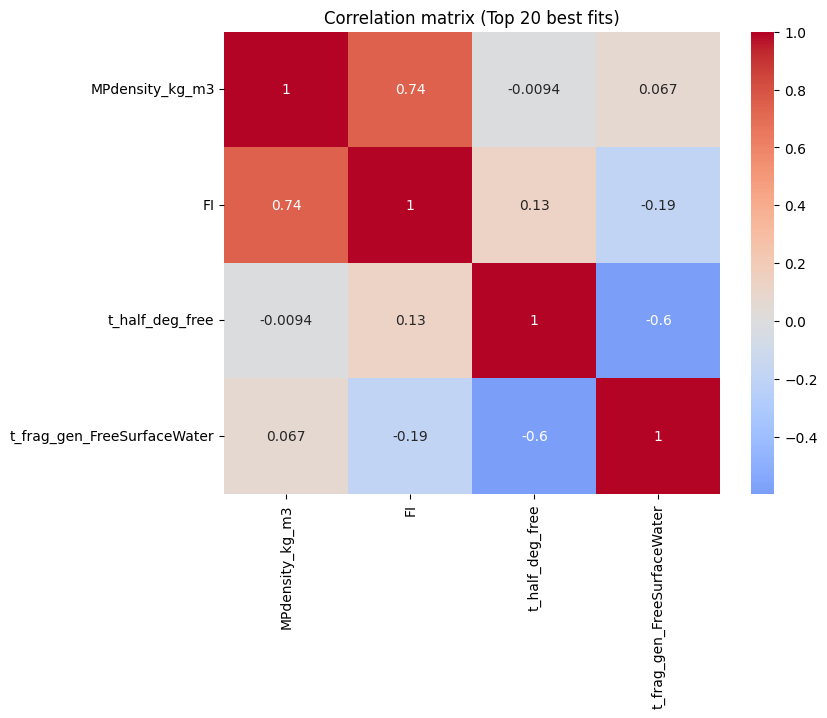

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation heatmap for the top results
corr = combined_results_shorted[0:19][["MPdensity_kg_m3", "FI", "t_half_deg_free", "t_frag_gen_FreeSurfaceWater"]].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation matrix (Top 20 best fits)")
plt.show()

CONTINUE HERE

In [42]:
# Write up conclusions and next steps

# Best fits corresponds to 2 archetypical types of plastic:
# 1. Low density plastic (LDP) provides best fits to the monitoring data when framgentation index is low (more erosive fragmentation) and and disintegration half-life is short. Fragmentation timescale seems to not play a significant role according to the correlation matrix.
# 2. High density plastic (HDP), provides best fits when fragmentation index is high (more explosive fragmentation) and disintegration half-life is long. Fragmentation timescale seems to not play a significant role according to the correlation matrix.

# We will run scenarios for the two archetipycal plastics and compare results to the articles data to plot best fits against observed data.

In [43]:
# SET UP SCENARIOS FOR THE TWO ARCHETYPICAL PLASTICS
# 1. Low density plastic (LDP) provides best fits to the monitoring data when framgentation index is low (more erosive fragmentation) and and disintegration half-life is short. Fragmentation timescale seems to not play a significant role according to the correlation matrix.

Run model for Low density polymer (LDP) scenario derived from MC

In [44]:
# Set up scenario simulation for LDP and HDP
from utopia.utopia import utopiaModel
# Define modifications (follow the structure provided in the default configuration data (data_data))
modifications = {
    "MPdensity_kg_m3": 940,
    "MP_composition": "LDP",
    'FI': 0.2,
    "t_half_deg_free": 2000,
    "t_frag_gen_FreeSurfaceWater": 50
}


In [45]:
LDP_data=data_data.copy()
LDP_data["MPdensity_kg_m3"]= modifications["MPdensity_kg_m3"]
LDP_data["MP_composition"]= modifications["MP_composition"]
LDP_data["FI"]= modifications["FI"]
LDP_data["t_half_deg_free"]= modifications["t_half_deg_free"]
LDP_data["t_frag_gen_FreeSurfaceWater"]= modifications["t_frag_gen_FreeSurfaceWater"]    
LDP_data

{'MPdensity_kg_m3': 940,
 'MP_composition': 'LDP',
 'shape': 'sphere',
 'MP_form': 'freeMP',
 'FI': 0.2,
 't_half_deg_free': 2000,
 'heter_deg_factor': 10,
 'biof_deg_factor': 0.5,
 'factor_deepWater_soilSurface': 10,
 'factor_sediment': 100,
 't_frag_gen_FreeSurfaceWater': 50,
 'biof_frag_factor': 2,
 'heter_frag_factor': 100,
 'emiss_dict_g_s': {'Ocean_Surface_Water': {'a': 0,
   'b': 0,
   'c': 0,
   'd': 0,
   'e': 0},
  'Ocean_Mixed_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Ocean_Column_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Coast_Surface_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Coast_Column_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Surface_Freshwater': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 100},
  'Bulk_Freshwater': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Sediment_Freshwater': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Sediment_Ocean': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Sediment_Coast': {'a': 0, 'b': 0, 'c': 0, 'd':

Running Monte Carlo analysis for article: Sea Sediment | Bergmann


c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWar

Running Monte Carlo analysis for article: Sea Surface all | Cai


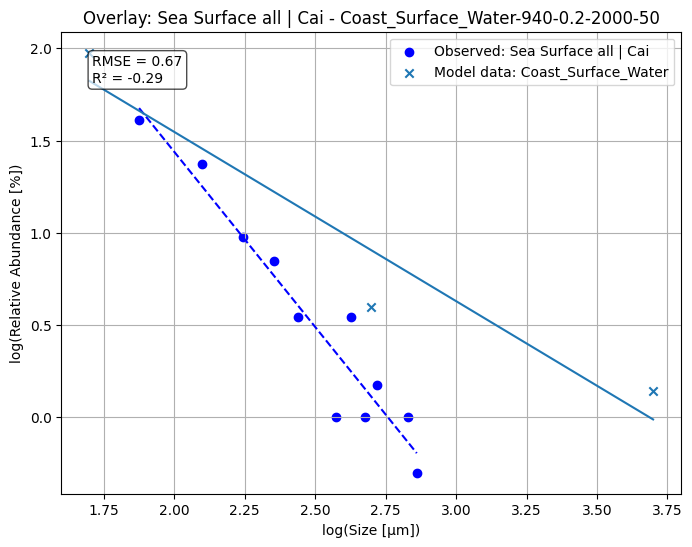

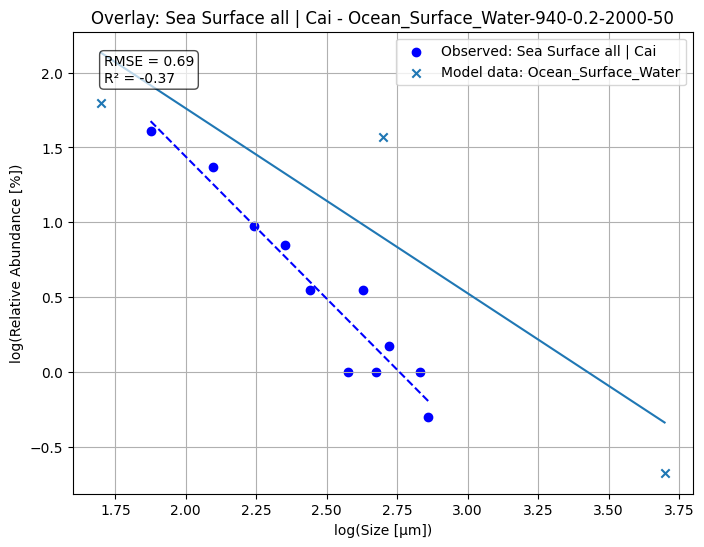

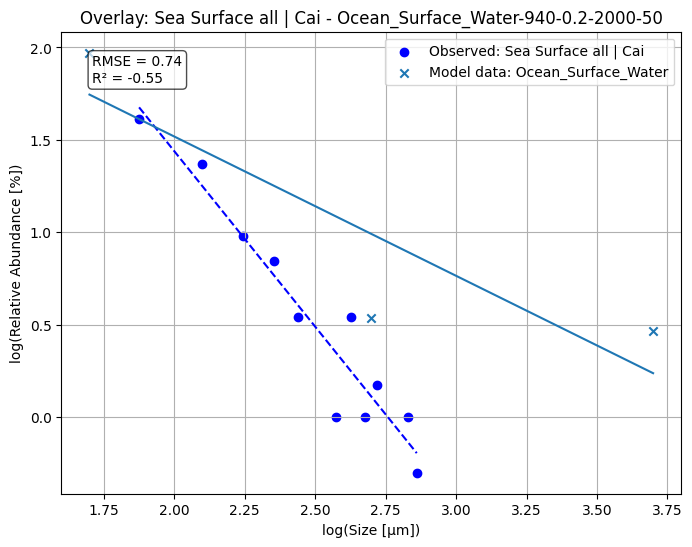

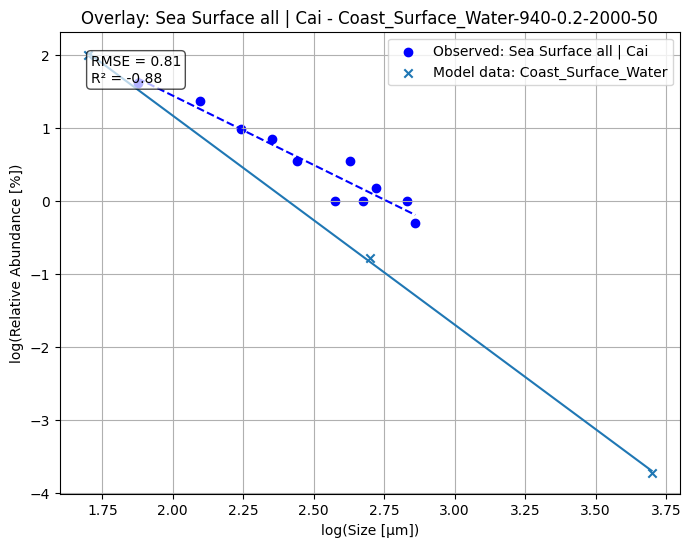

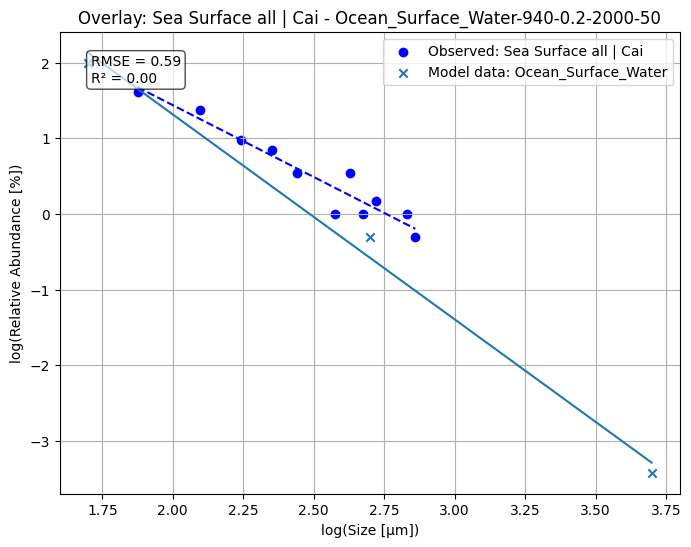

Running Monte Carlo analysis for article: Sea Surface Fragments | Enders


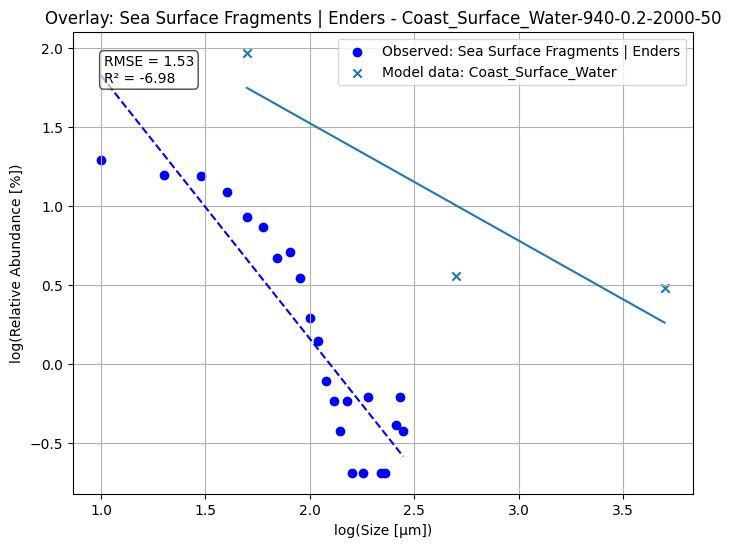

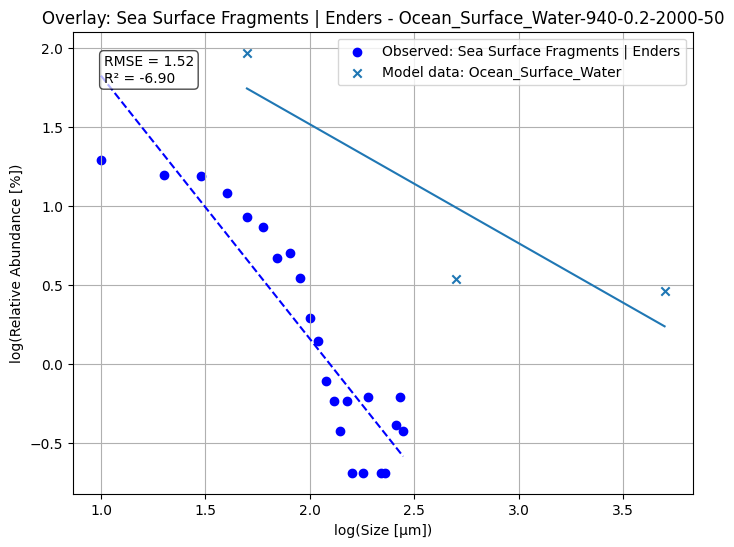

Running Monte Carlo analysis for article: Sea Surface Fibers | Enders


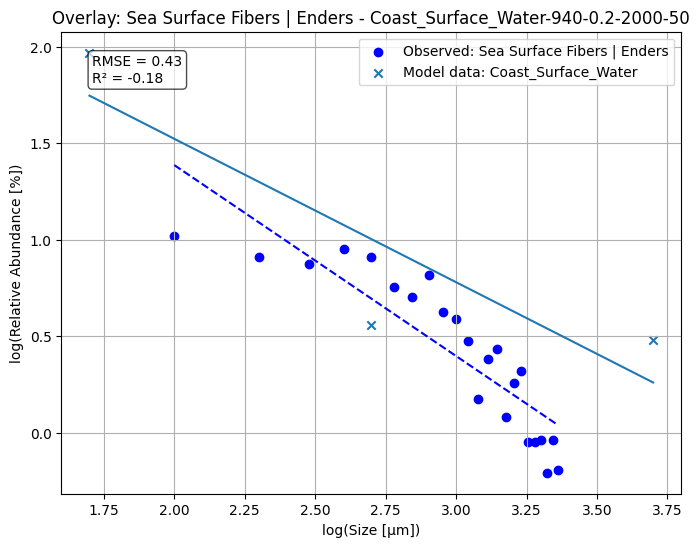

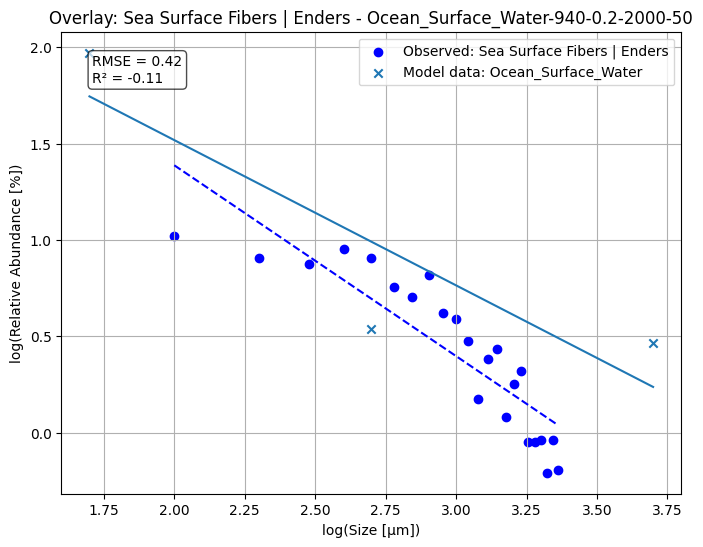

Running Monte Carlo analysis for article: Fragments in water | Eo


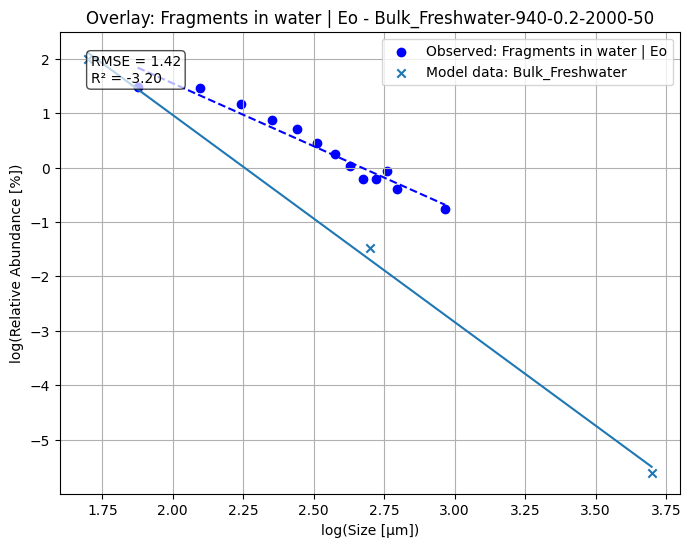

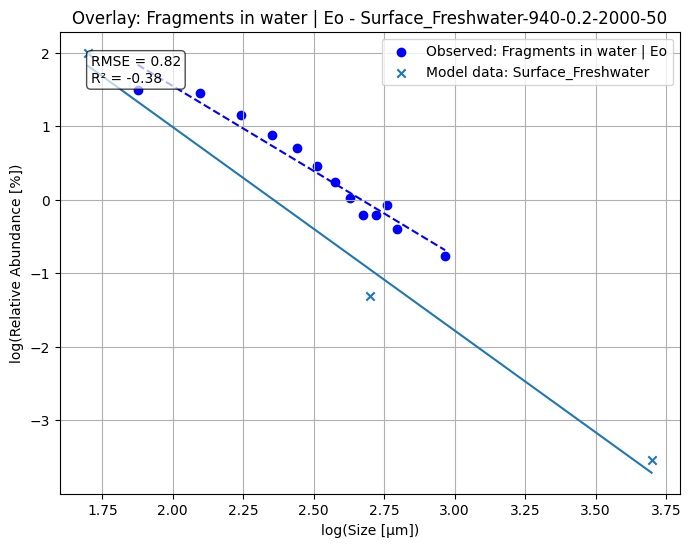

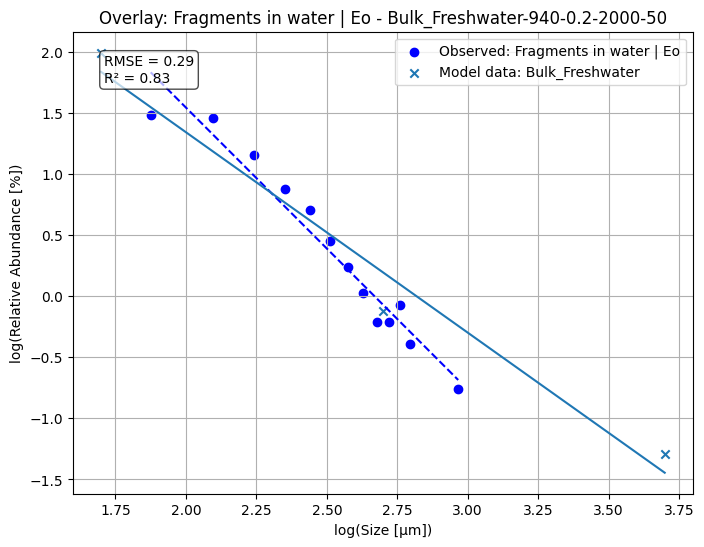

Running Monte Carlo analysis for article: Fibers in water | Eo


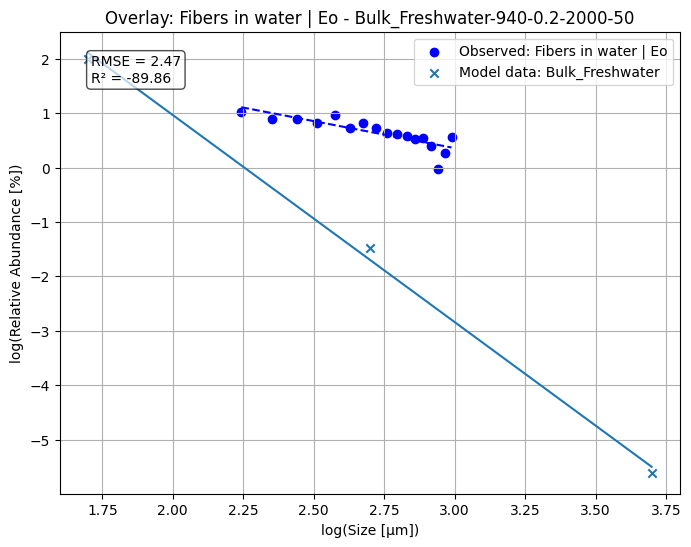

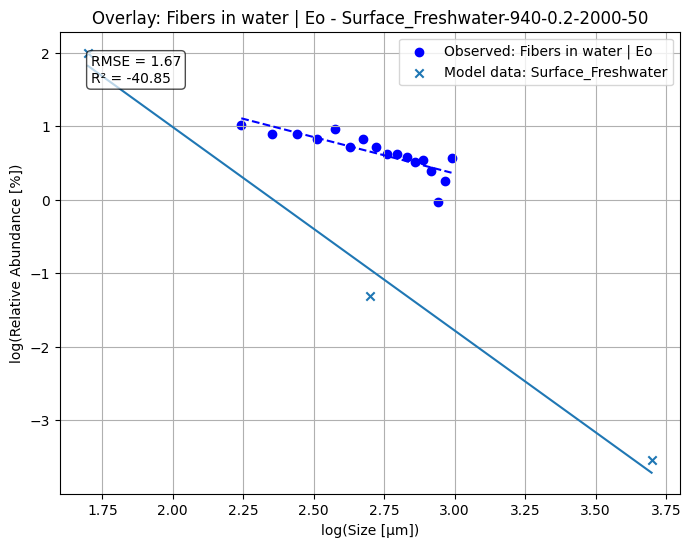

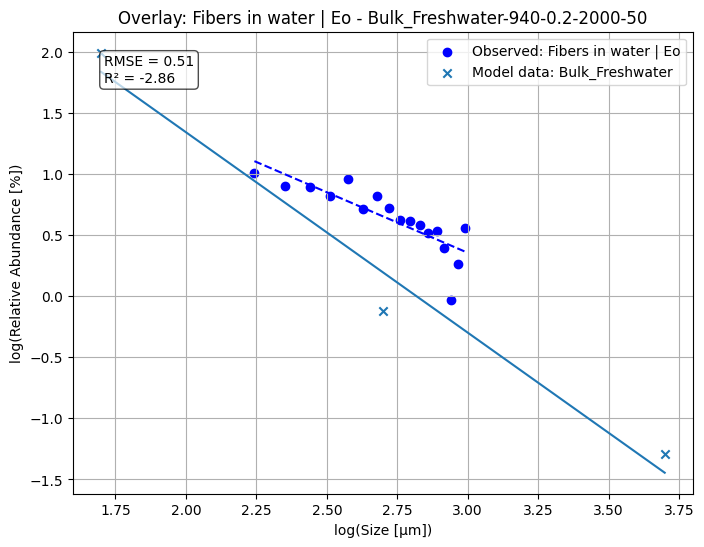

Running Monte Carlo analysis for article: Fragments in sediment | Eo


c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWar

Running Monte Carlo analysis for article: Fibers in sediment | Eo


c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWar

Running Monte Carlo analysis for article: Sea Surface all | Erni-Cassola


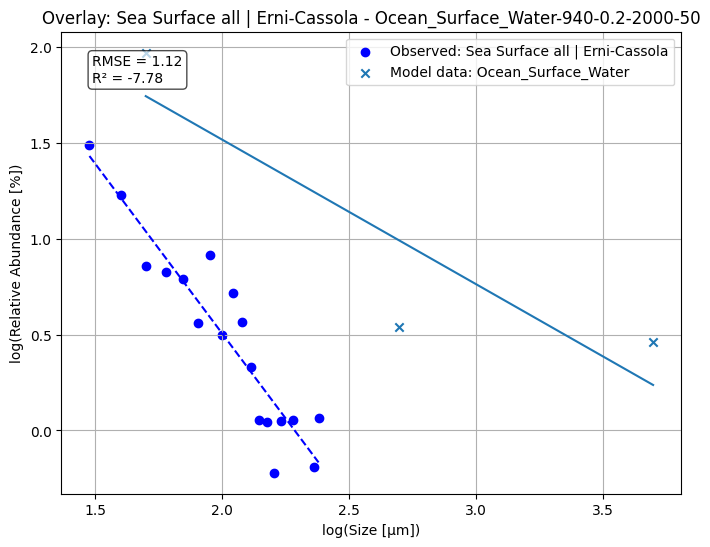

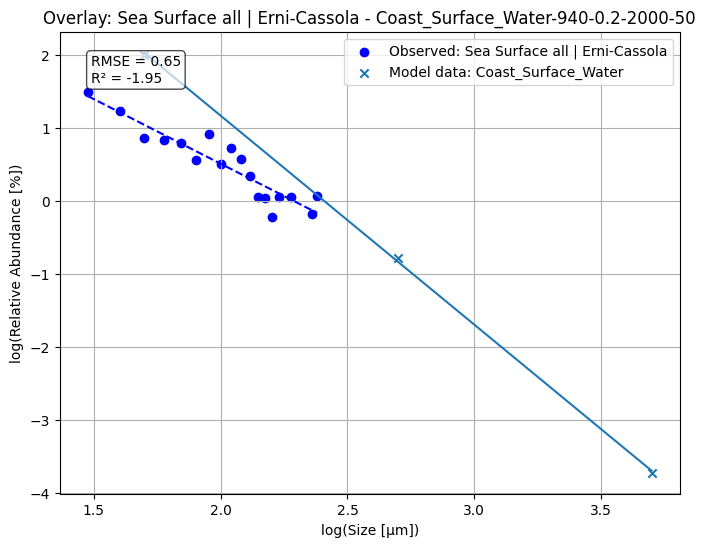

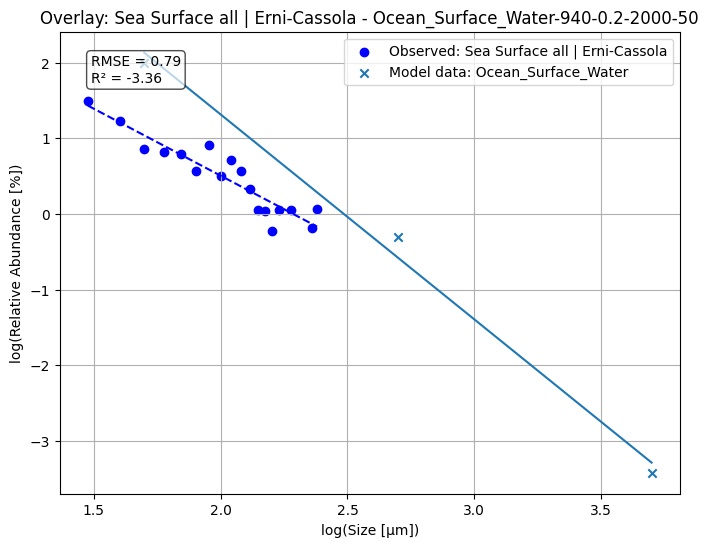

Running Monte Carlo analysis for article: Fresh water sediments | Imhof


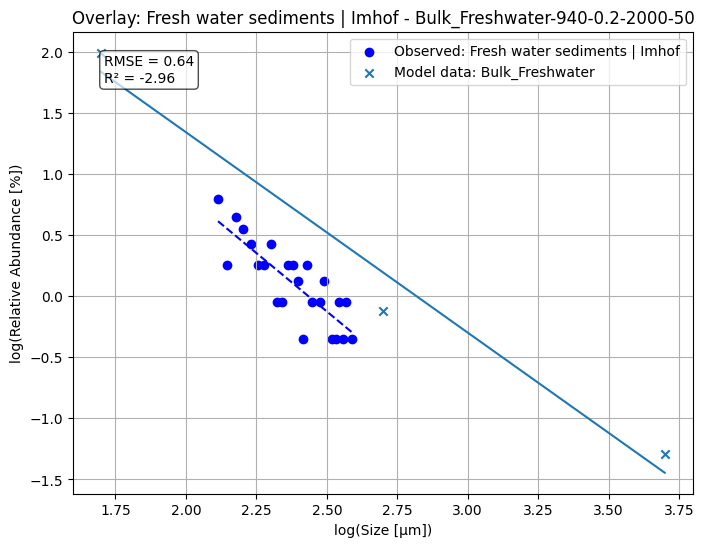

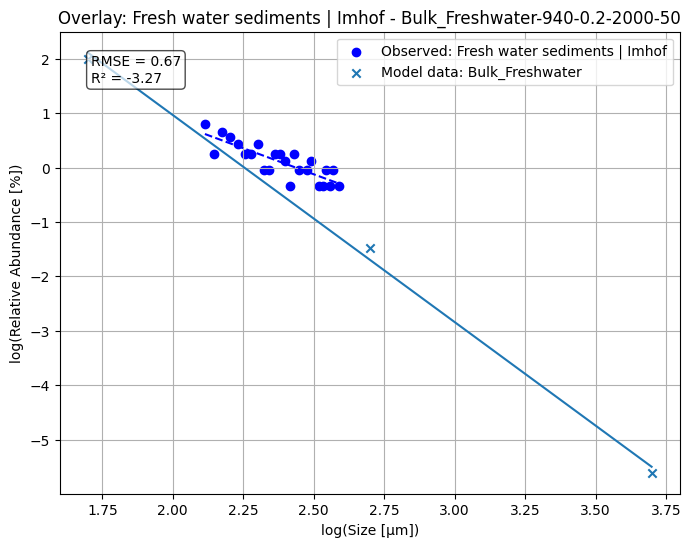

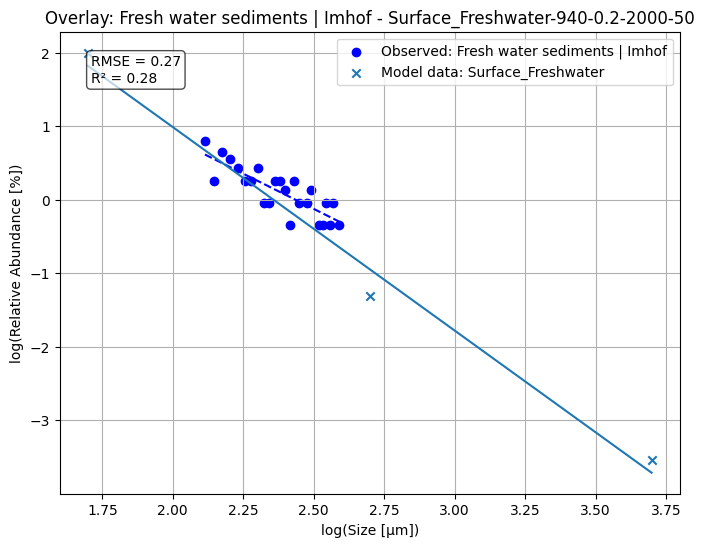

Running Monte Carlo analysis for article: Sea Surface all | Isobe L1


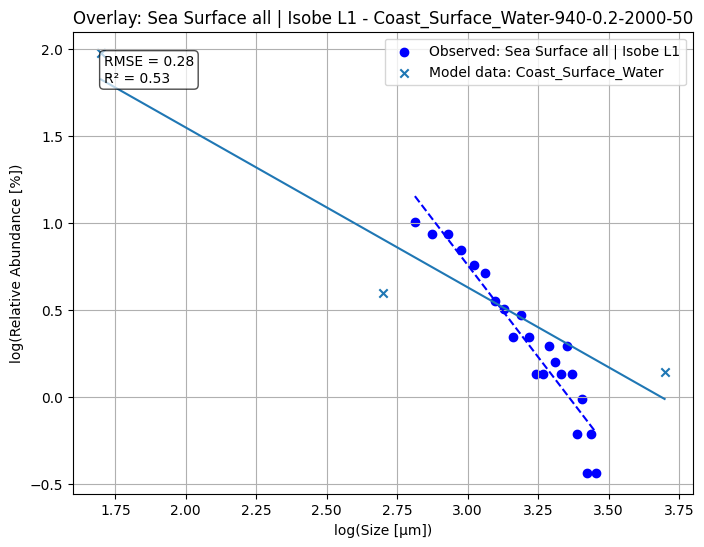

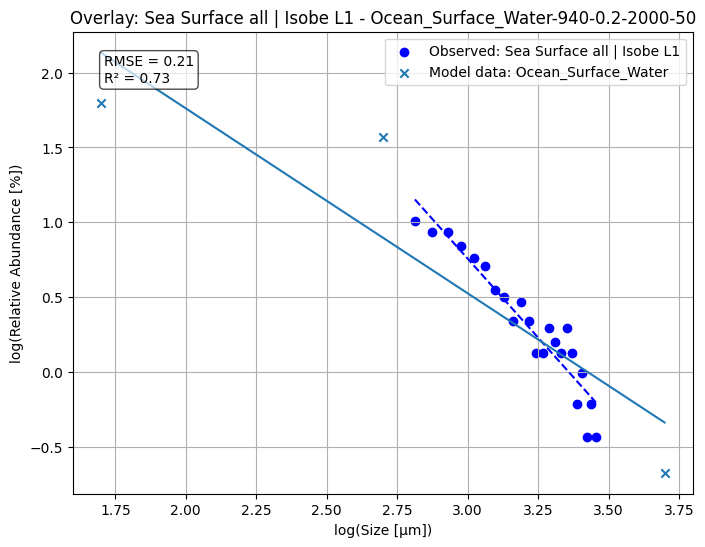

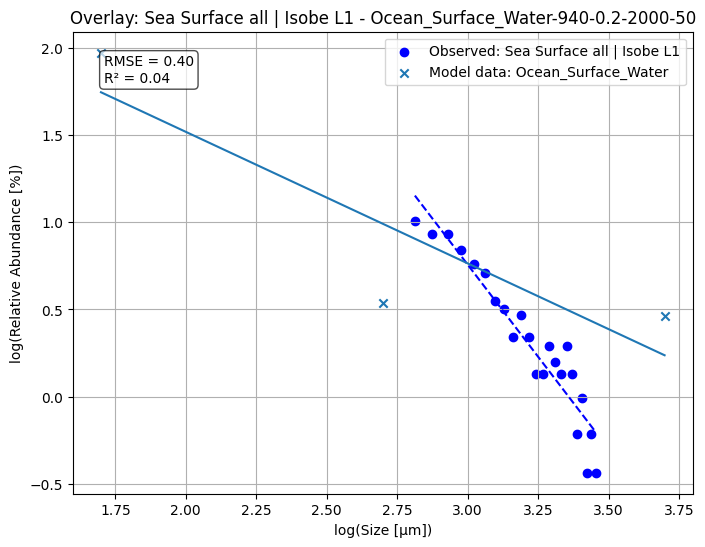

Running Monte Carlo analysis for article: Sea Surface all | Isobe L2


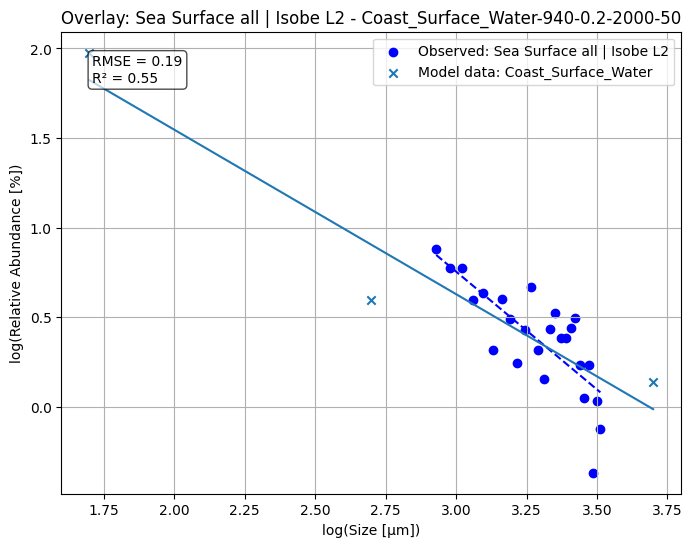

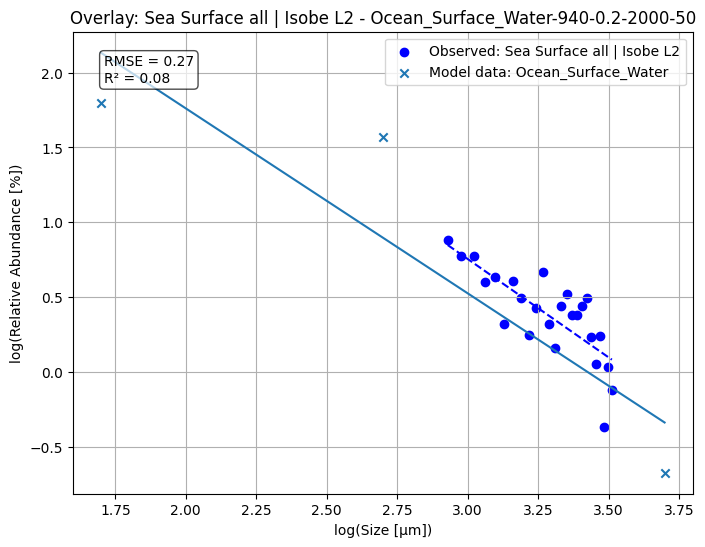

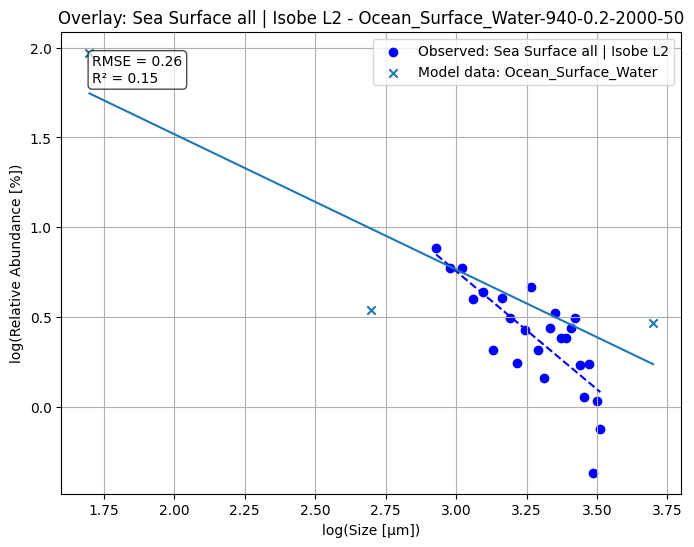

Running Monte Carlo analysis for article: Sea Surface all | Isobe L3


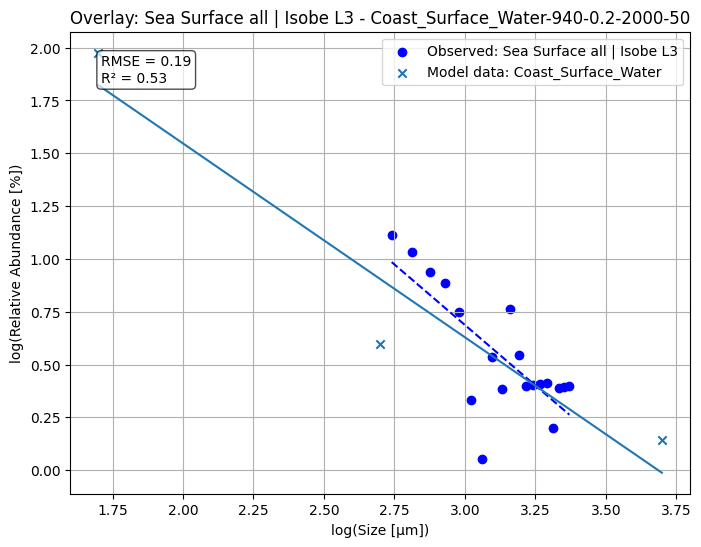

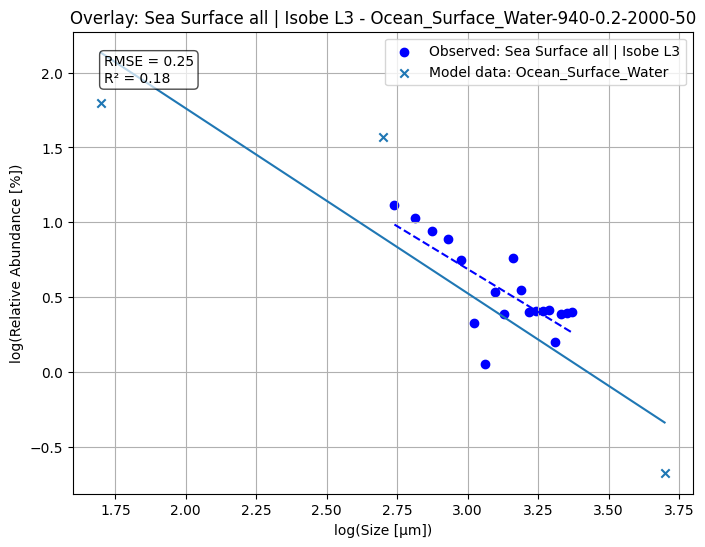

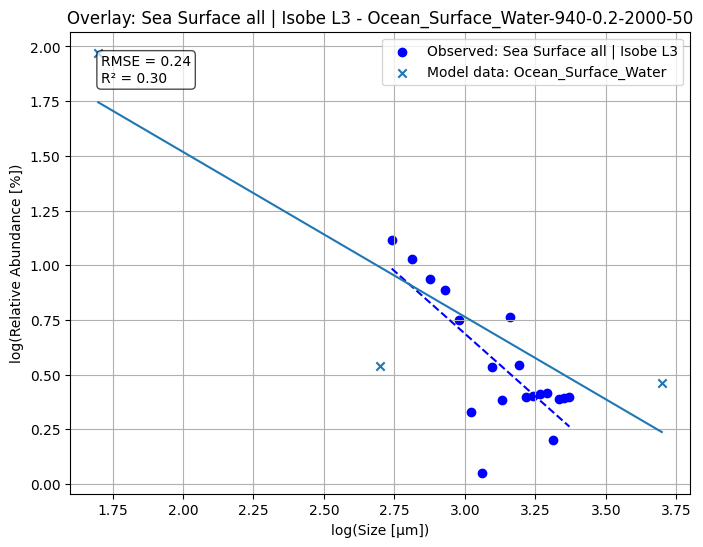

Running Monte Carlo analysis for article: Sea Surface all | Isobe L4


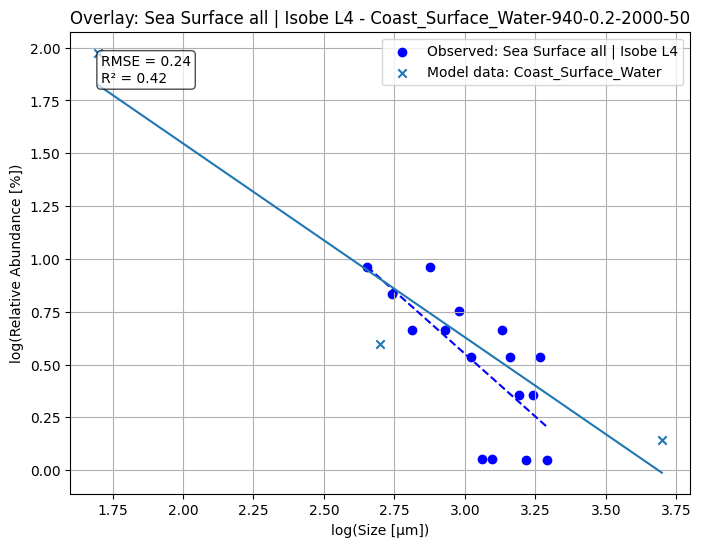

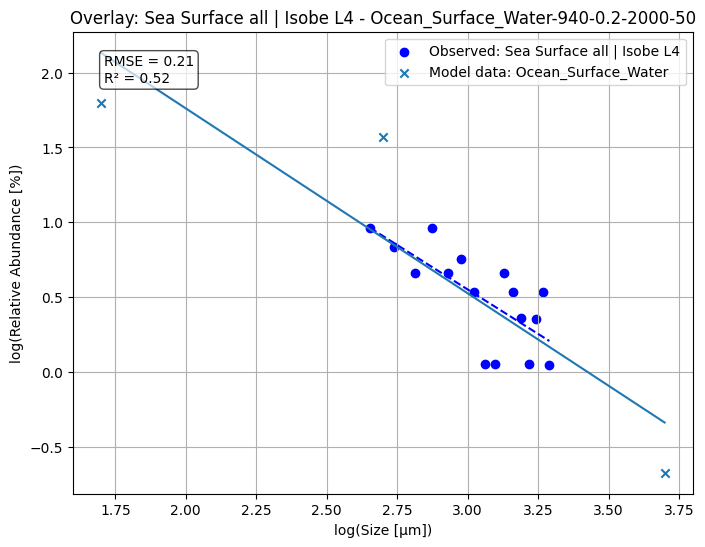

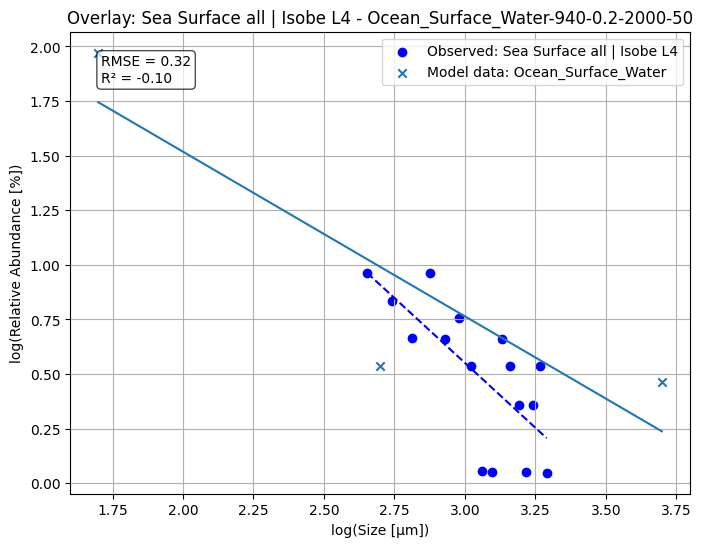

Running Monte Carlo analysis for article: FP all | Scheurer


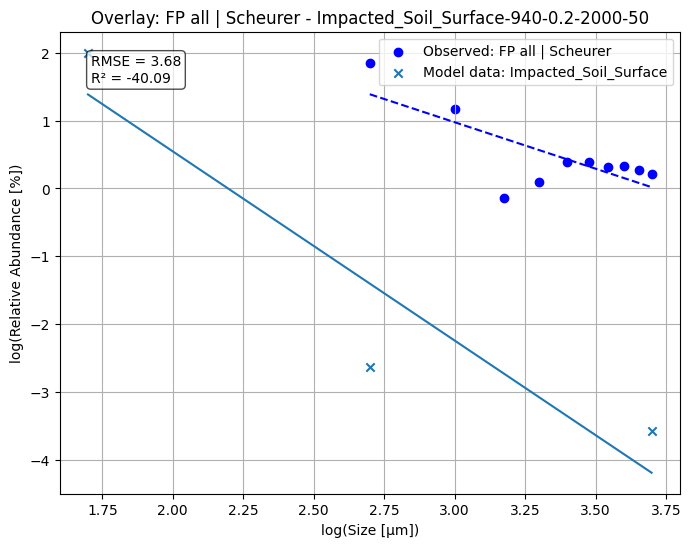

c:\Users\PradoDomercq\AppData\Local\miniconda3\envs\utopia_envP11\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Running Monte Carlo analysis for article: Sea Surface Fragments | Song


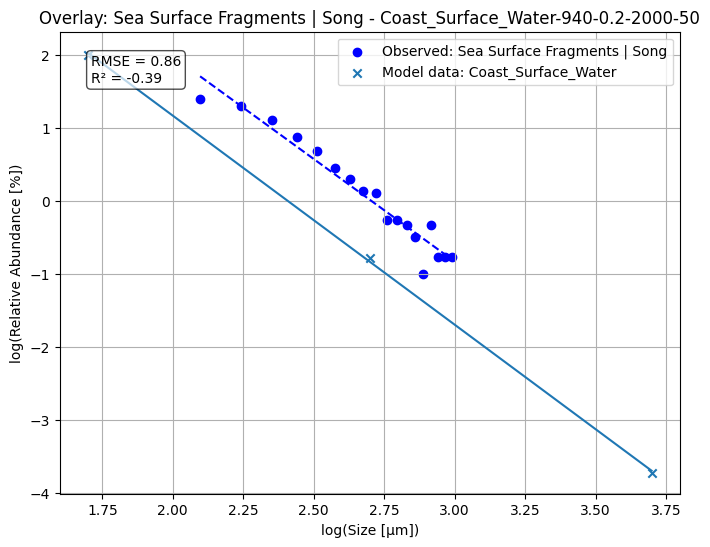

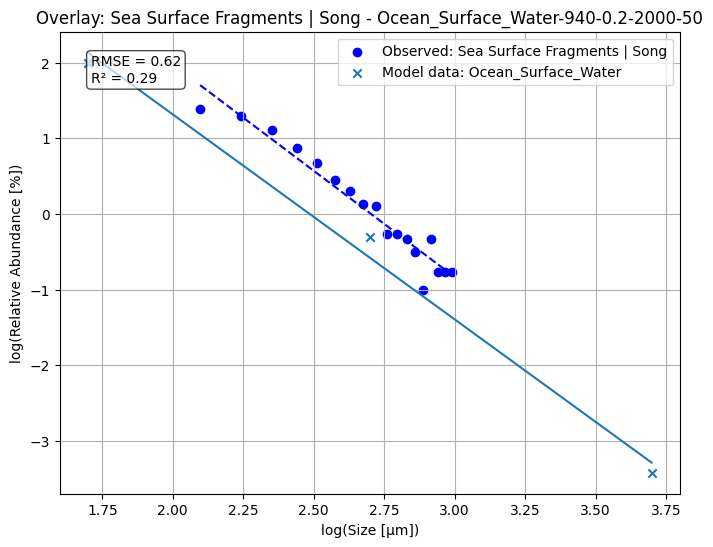

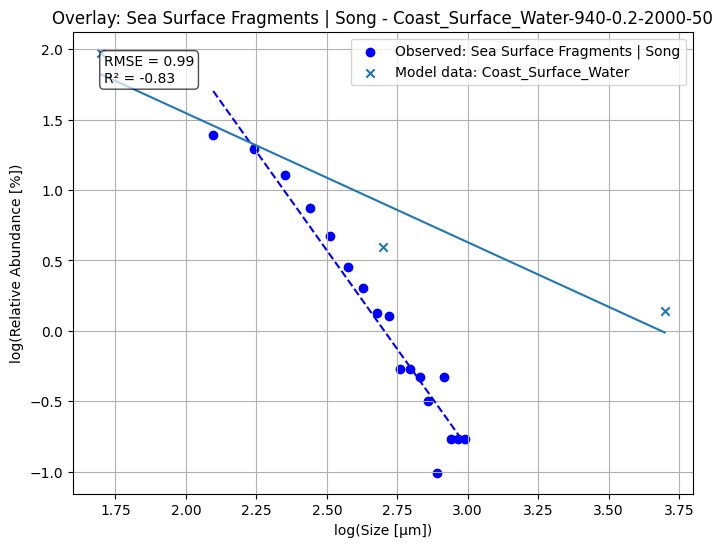

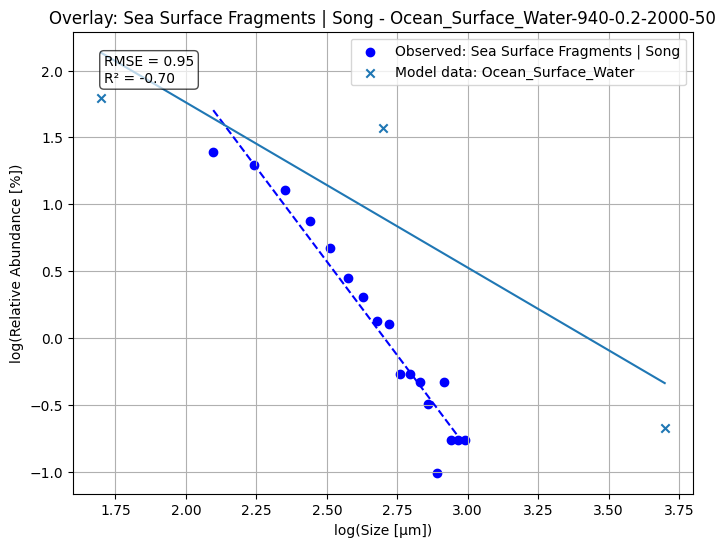

Running Monte Carlo analysis for article: Sea Surface Fibers | Song


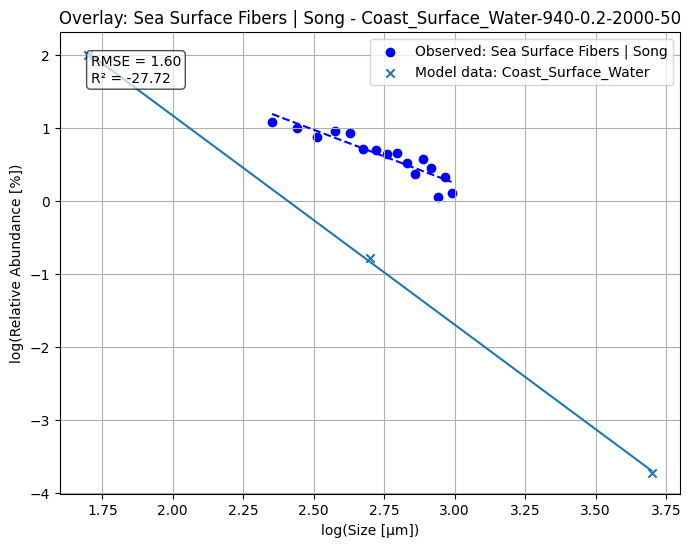

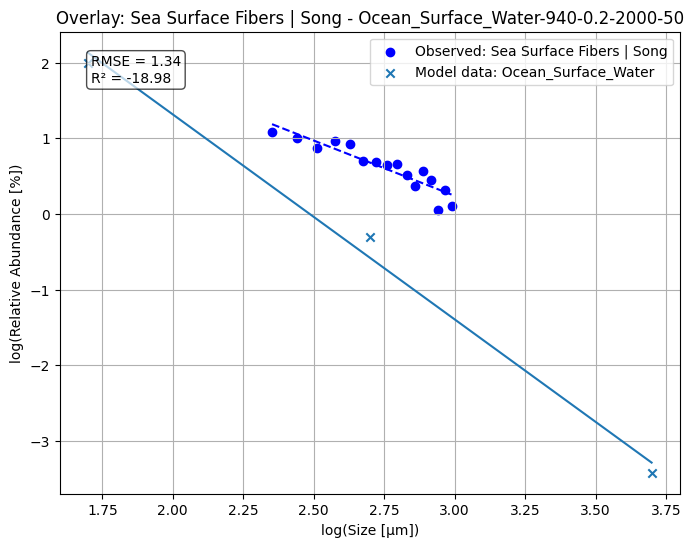

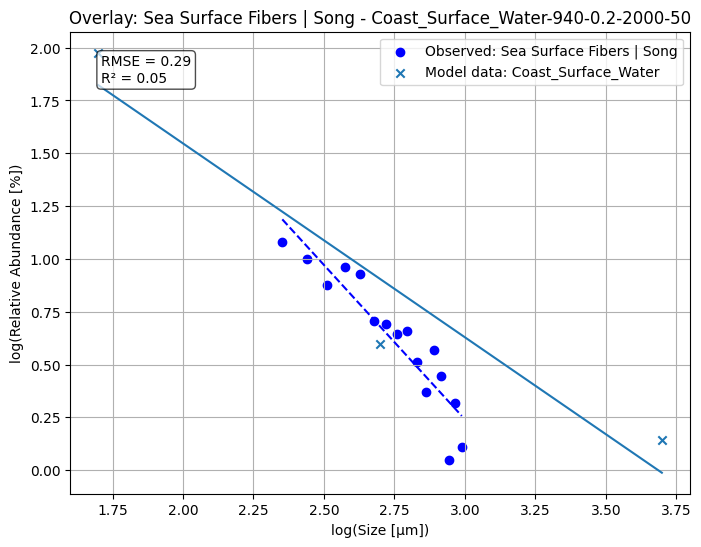

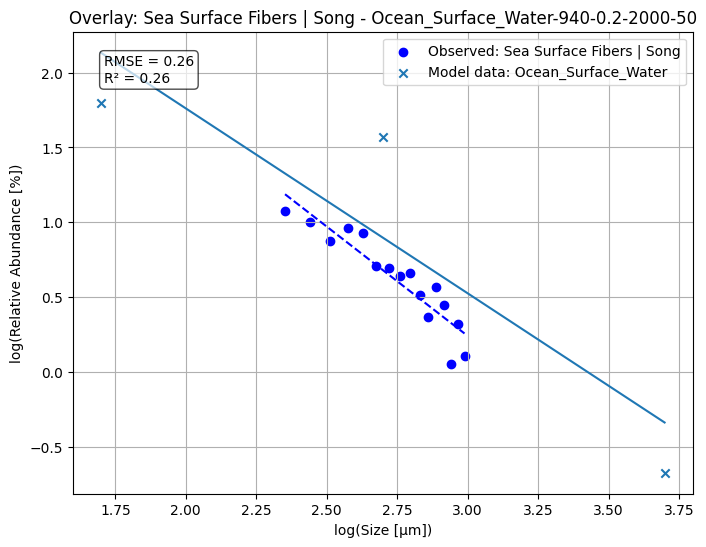

Running Monte Carlo analysis for article: Sea Surface all | Zhang


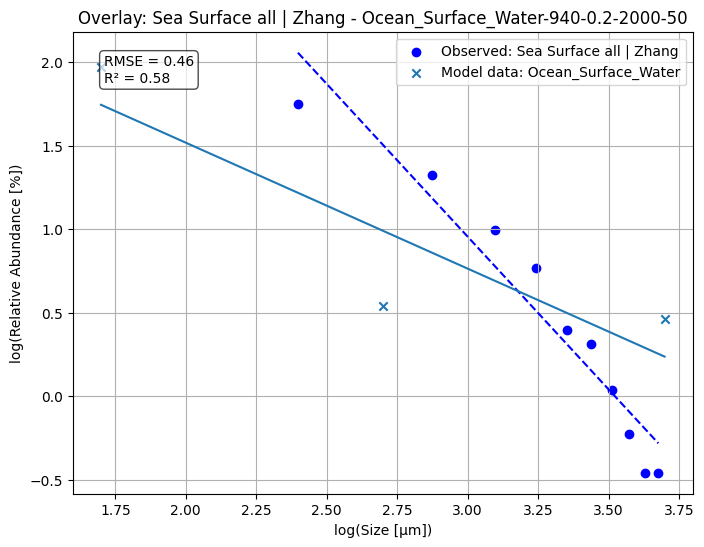

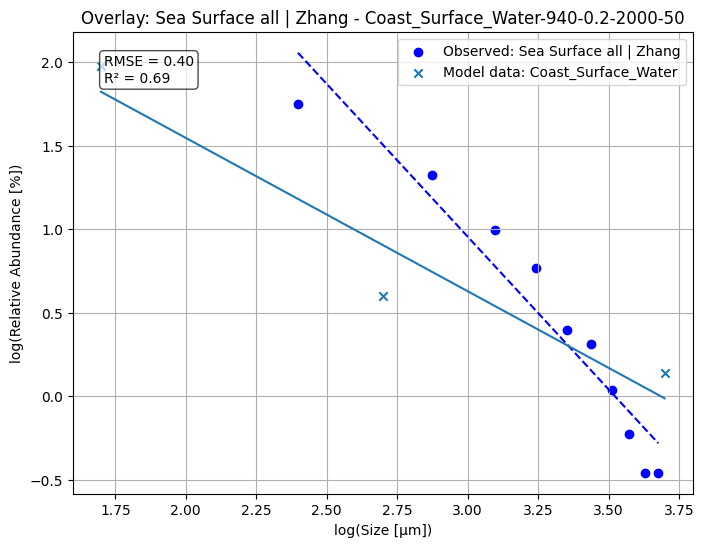

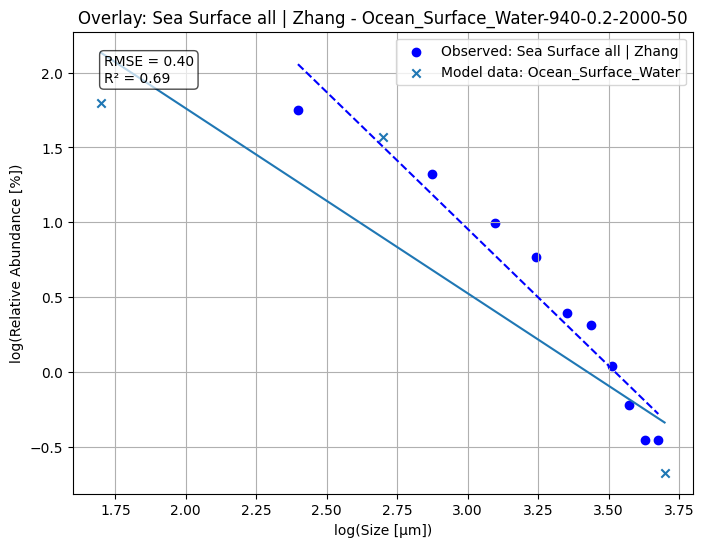

In [46]:
import pandas as pd
from utopia.utopia import utopiaModel
from utopia.results_processing.process_results import *
from scipy.stats import spearmanr
from utopia.monte_carlo.montecarlo_analysis_paper import extract_log_rel_abundance
from utopia.monte_carlo.montecarlo_analysis_paper import plot_obs_vs_model_with_metrics_True


# Run the model for each emission scenario and target compartment
LDP_simulations_results_all={}
for art in overlay_emission_scenarios.keys():
    print(f"Running Monte Carlo analysis for article: {art}")
    LDP_simulations_results=[]
    for comp in overlay_emission_scenarios[art]:
        # Set emissions to that compartment and include it in base_data file
        LDP_data["emiss_dict_g_s"]= set_emission(LDP_data["emiss_dict_g_s"].copy(), comp, "e", 100)
        for comp_T in overlay_compartments_mapping[art]:
            emission_comp=comp
            target_comp=comp_T
            model = utopiaModel(config=config_data, data=LDP_data)
            model.run()
            processor = ResultsProcessor(model)  # Custom processor to handle results
            processor.estimate_flows()
            processor.generate_flows_dict()
            processor.process_results()
            processor.extract_results_by_compartment()
            df = processor.results_by_comp
            df2 = processor.Results_extended
            # processor.estimate_exposure_indicators()

            # Process model outputs into log-relative abundances per size fraction and compare with observed data
            observed_file = "../src/utopia/data/observed_data_long.xlsx"

            observed_df = pd.read_excel(observed_file)

            observed_df = observed_df.rename(columns={
            "dataset identifier": "Dataset",
            "Article name": "Article",
            "log‑transformed size": "log_Size",
            "log‑transformed abundance": "log_Abundance",
        }
    )
            obs_subset = observed_df[observed_df["Article"] == art]
            x_obs_all = obs_subset["log_Size"].astype(float).values
            y_obs_all = obs_subset["log_Abundance"].astype(float).values

            if len(x_obs_all) > 2:
                slope_obs, intercept_obs = np.polyfit(x_obs_all, y_obs_all, 1)
            else:
                slope_obs, intercept_obs = np.nan, np.nan

            result = {}

            # comp_relative_abundance_resultsaccording to target compartment set in the input parameters

            # Exclude size bins that are not withing the observed data range (0.5 and 5 um)
            excluded_sizes = [0.5, 5]
            filtered_Results = df2[~df2["Size_Fraction_um"].isin(excluded_sizes)]
            rel_abun = extract_log_rel_abundance(
                filtered_Results,
                compartment=target_comp,
                value_col="number_of_particles",
            )

            if rel_abun.empty:
                # fill with NaNs
                result.update(
                    {
                        "Spearman_r": np.nan,
                        "Spearman_p": np.nan,
                        "Pass_Spearman": False,
                        "RMSE": np.nan,
                        "R_squared": np.nan,
                        "Model_slope": np.nan,
                        "Model_intercept": np.nan,
                        "Target_compartment": target_comp,
                        "Emission_compartment": emission_comp,
                    }
                )

            else:

                x_mod_all = rel_abun["log_size"].values
                y_mod_all = rel_abun["log_rel_abundance"].values

                # Spearman correlation
                r_value, p_value = spearmanr(x_mod_all, y_mod_all)

                spearman_threshold = -1

                # Initialize metrics
                rmse, r2, slope_mod, intercept_mod = np.nan, np.nan, np.nan, np.nan
                if np.isnan(r_value):
                    pass_spearman = False
                elif (r_value) == spearman_threshold:
                    pass_spearman = True
                else:
                    pass_spearman = False

                # Compute RMSE, R², slope, intercept only if threshold passed

                if pass_spearman == True and len(x_mod_all) > 2 and len(x_obs_all) > 2:
                    slope_mod, intercept_mod = np.polyfit(x_mod_all, y_mod_all, 1)

                    # Align with observed range
                    x_min = max(x_obs_all.min(), x_mod_all.min())
                    x_max = min(x_obs_all.max(), x_mod_all.max())
                    mask_obs = (x_obs_all >= x_min) & (x_obs_all <= x_max)
                    x_obs_filt = x_obs_all[mask_obs]
                    y_obs_filt = y_obs_all[mask_obs]

                    if len(x_obs_filt) > 2:
                        pred_y = slope_mod * x_obs_filt + intercept_mod
                        ss_res = np.sum((y_obs_filt - pred_y) ** 2)
                        ss_tot = np.sum((y_obs_filt - np.mean(y_obs_filt)) ** 2)
                        r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan
                        rmse = np.sqrt(ss_res / len(x_obs_filt))

                        # Plot observed vs model with metrics only if spearman test is true
                        plot_obs_vs_model_with_metrics_True(
                            x_obs_all,
                            y_obs_all,
                            x_mod_all,
                            y_mod_all,
                            comp_T,
                            art,
                            rmse,
                            r2,
                            MP_density=model.MPdensity_kg_m3,
                            FI=model.FI,
                            t_half_deg=model.t_half_deg_free,
                            t_frag=model.t_frag_gen_FreeSurfaceWater,
                        )

                        # Store all metrics in result dict
                        result.update(
                            {
                                "Spearman_r": r_value,
                                "Spearman_p": p_value,
                                "Pass_Spearman": pass_spearman,
                                "RMSE": rmse,
                                "R_squared": r2,
                                "Model_slope": slope_mod,
                                "Model_intercept": intercept_mod,
                                "Target_compartment": target_comp,
                                "Emission_compartment": emission_comp,
                            }
                        )
                    else:
                        # If not enough points to compute metrics, store NaNs
                        result.update(
                            {
                                "Spearman_r": np.nan,
                                "Spearman_p": np.nan,
                                "Pass_Spearman": False,
                                "RMSE": np.nan,
                                "R_squared": np.nan,
                                "Model_slope": np.nan,
                                "Model_intercept": np.nan,
                                "Target_compartment": target_comp,
                                "Emission_compartment": emission_comp,
                            }
                        )
                else:
                    # Store all metrics in result dict
                    result.update(
                        {
                            "Spearman_r": np.nan,
                            "Spearman_p": np.nan,
                            "Pass_Spearman": False,
                            "RMSE": np.nan,
                            "R_squared": np.nan,
                            "Model_slope": np.nan,
                            "Model_intercept": np.nan,
                            "Target_compartment": target_comp,
                            "Emission_compartment": emission_comp,
                        }
                    )
            LDP_simulations_results.append(result)
    LDP_simulations_results_all[art]=LDP_simulations_results    
                

            
            

In [47]:
LDP_simulations_results_all

{'Sea Sediment | Bergmann': [{'Spearman_r': nan,
   'Spearman_p': nan,
   'Pass_Spearman': False,
   'RMSE': nan,
   'R_squared': nan,
   'Model_slope': nan,
   'Model_intercept': nan,
   'Target_compartment': 'Sediment_Coast',
   'Emission_compartment': 'Ocean_Surface_Water'},
  {'Spearman_r': nan,
   'Spearman_p': nan,
   'Pass_Spearman': False,
   'RMSE': nan,
   'R_squared': nan,
   'Model_slope': nan,
   'Model_intercept': nan,
   'Target_compartment': 'Sediment_Ocean',
   'Emission_compartment': 'Ocean_Surface_Water'},
  {'Spearman_r': nan,
   'Spearman_p': nan,
   'Pass_Spearman': False,
   'RMSE': nan,
   'R_squared': nan,
   'Model_slope': nan,
   'Model_intercept': nan,
   'Target_compartment': 'Sediment_Coast',
   'Emission_compartment': 'Coast_Surface_Water'},
  {'Spearman_r': nan,
   'Spearman_p': nan,
   'Pass_Spearman': False,
   'RMSE': nan,
   'R_squared': nan,
   'Model_slope': nan,
   'Model_intercept': nan,
   'Target_compartment': 'Sediment_Ocean',
   'Emission_com

In [48]:
# Flatten it into a list of rows
rows = []
for article, records in LDP_simulations_results_all.items():
    for record in records:
        record["article"] = article  # Add outer key as a column
        rows.append(record)

# Create DataFrame
df = pd.DataFrame(rows)

# 👇 Drop rows with any NaN values
df_clean = df.dropna()

# Reorder columns (optional)
cols = ["article"] + [c for c in df_clean .columns if c != "article"]
df_clean_LDP  = df_clean [cols]


In [49]:
LDP_correlations_shorted=df_clean_LDP.sort_values("RMSE", ascending=True)
LDP_correlations_shorted.head(20)

,article,Spearman_r,Spearman_p,Pass_Spearman,RMSE,R_squared,Model_slope,Model_intercept,Target_compartment,Emission_compartment
52,Sea Surface all | Isobe L2,-1.0,0.0,True,0.190007,0.553078,-0.917455,3.381548,Coast_Surface_Water,Surface_Freshwater
56,Sea Surface all | Isobe L3,-1.0,0.0,True,0.191875,0.533865,-0.917455,3.381548,Coast_Surface_Water,Surface_Freshwater
49,Sea Surface all | Isobe L1,-1.0,0.0,True,0.214804,0.730070,-1.235674,4.232543,Ocean_Surface_Water,Surface_Freshwater
61,Sea Surface all | Isobe L4,-1.0,0.0,True,0.214970,0.517181,-1.235674,4.232543,Ocean_Surface_Water,Surface_Freshwater
59,Sea Surface all | Isobe L3,-1.0,0.0,True,0.235090,0.300253,-0.753680,3.025382,Ocean_Surface_Water,Coast_Surface_Water
60,Sea Surface all | Isobe L4,-1.0,0.0,True,0.236564,0.415310,-0.917455,3.381548,Coast_Surface_Water,Surface_Freshwater
57,Sea Surface all | Isobe L3,-1.0,0.0,True,0.253886,0.183888,-1.235674,4.232543,Ocean_Surface_Water,Surface_Freshwater
73,Sea Surface Fibers | Song,-1.0,0.0,True,0.257249,0.258891,-1.235674,4.232543,Ocean_Surface_Water,Surface_Freshwater
55,Sea Surface all | Isobe L2,-1.0,0.0,True,0.261469,0.153687,-0.753680,3.025382,Ocean_Surface_Water,Coast_Surface_Water
53,Sea Surface all | Isobe L2,-1.0,0.0,True,0.272891,0.078126,-1.235674,4.232543,Ocean_Surface_Water,Surface_Freshwater


Run model for high density polymer (HDP) scenario derived from MC

In [50]:
# Define modifications (follow the structure provided in the default configuration data (data_data))
modifications_HDP = {
    "MPdensity_kg_m3": 1150,
    "MP_composition": "LDP",
    'FI': 0.8,
    "t_half_deg_free": 4000,
    "t_frag_gen_FreeSurfaceWater": 50
}


In [51]:
HDP_data=data_data.copy()
HDP_data["MPdensity_kg_m3"]= modifications_HDP["MPdensity_kg_m3"]
HDP_data["MP_composition"]= modifications_HDP["MP_composition"]
HDP_data["FI"]= modifications_HDP["FI"]
HDP_data["t_half_deg_free"]= modifications_HDP["t_half_deg_free"]
HDP_data["t_frag_gen_FreeSurfaceWater"]= modifications_HDP["t_frag_gen_FreeSurfaceWater"]    
HDP_data

{'MPdensity_kg_m3': 1150,
 'MP_composition': 'LDP',
 'shape': 'sphere',
 'MP_form': 'freeMP',
 'FI': 0.8,
 't_half_deg_free': 4000,
 'heter_deg_factor': 10,
 'biof_deg_factor': 0.5,
 'factor_deepWater_soilSurface': 10,
 'factor_sediment': 100,
 't_frag_gen_FreeSurfaceWater': 50,
 'biof_frag_factor': 2,
 'heter_frag_factor': 100,
 'emiss_dict_g_s': {'Ocean_Surface_Water': {'a': 0,
   'b': 0,
   'c': 0,
   'd': 0,
   'e': 0},
  'Ocean_Mixed_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Ocean_Column_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Coast_Surface_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Coast_Column_Water': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Surface_Freshwater': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 100},
  'Bulk_Freshwater': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Sediment_Freshwater': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Sediment_Ocean': {'a': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0},
  'Sediment_Coast': {'a': 0, 'b': 0, 'c': 0, 'd'

Running Monte Carlo analysis for article: Sea Sediment | Bergmann


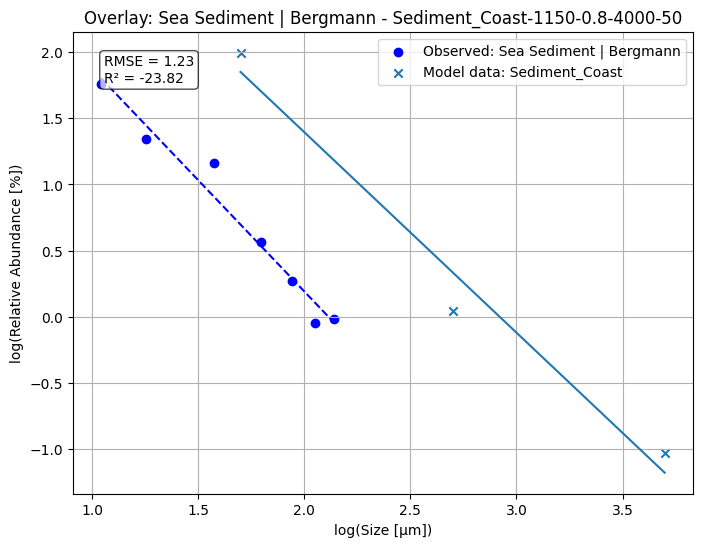

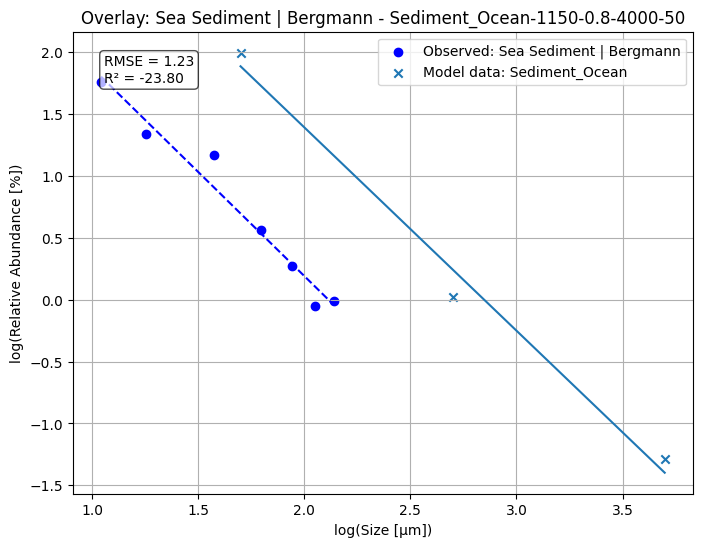

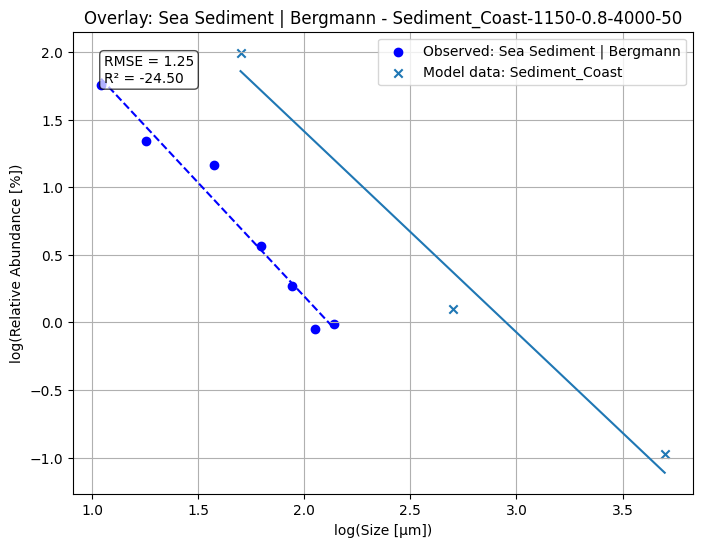

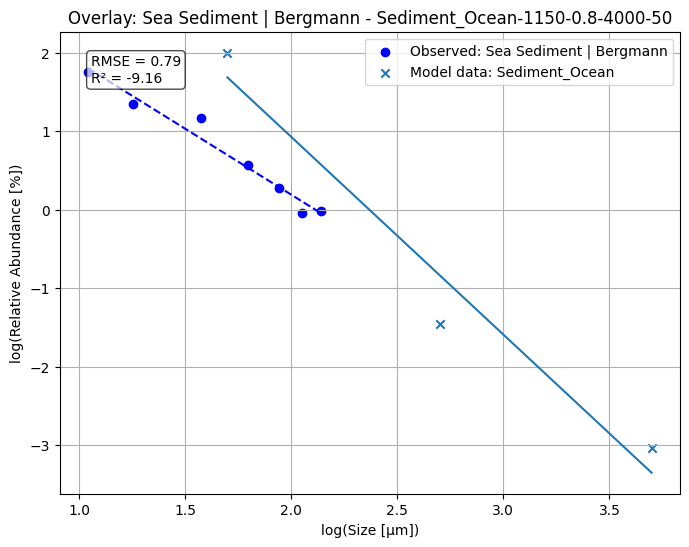

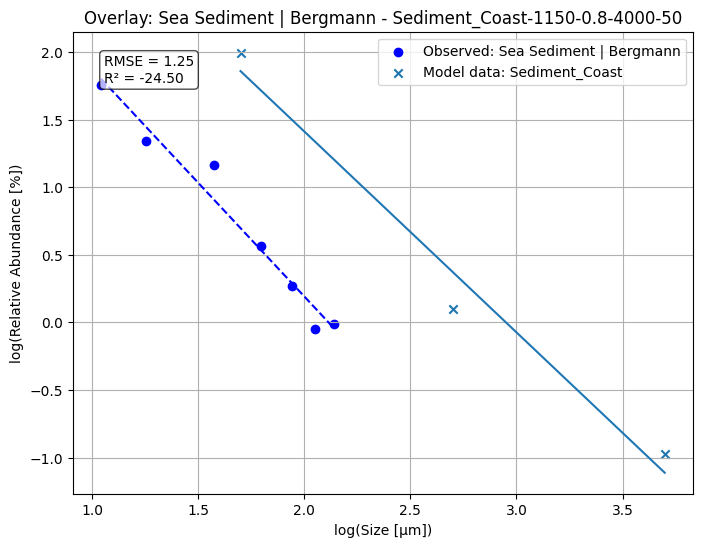

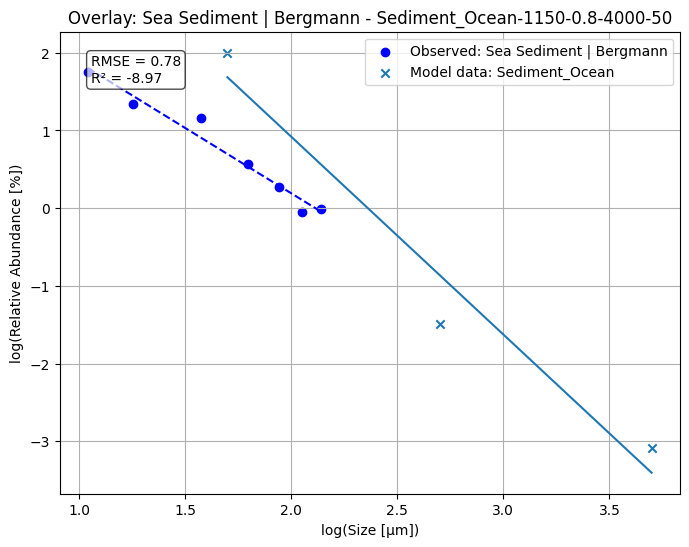

Running Monte Carlo analysis for article: Sea Surface all | Cai


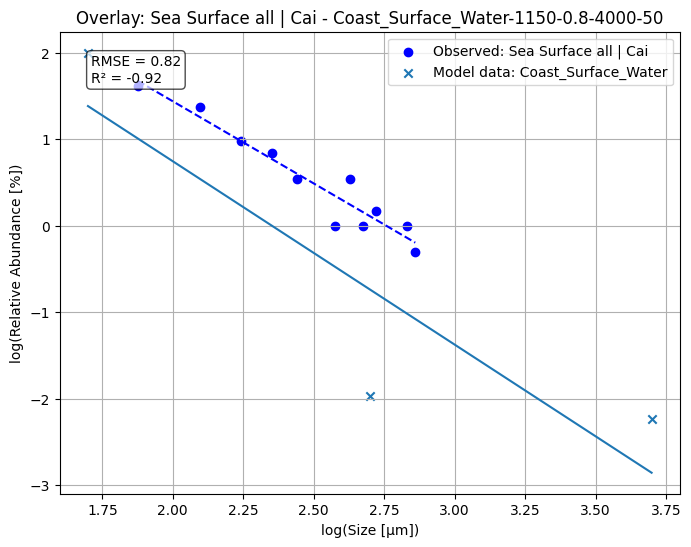

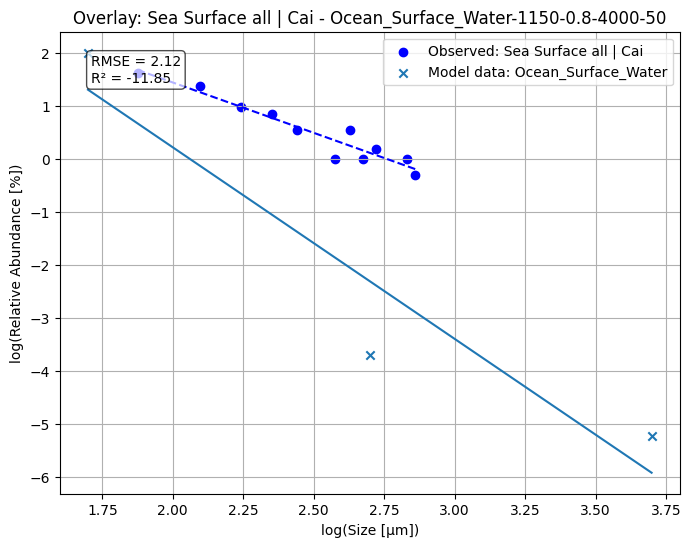

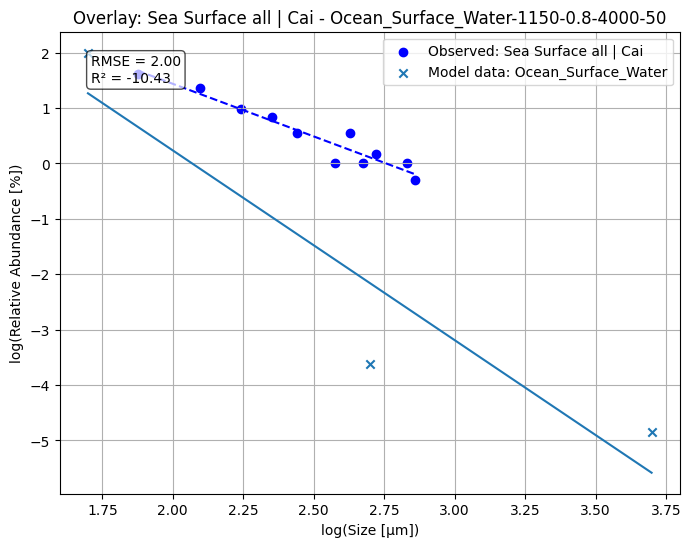

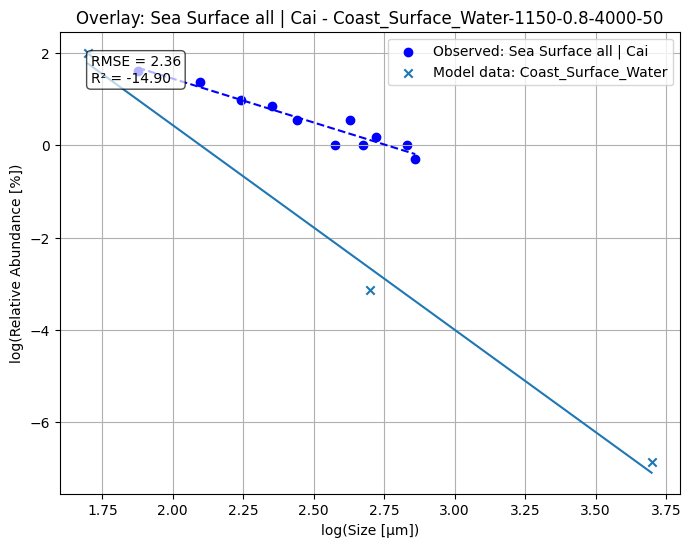

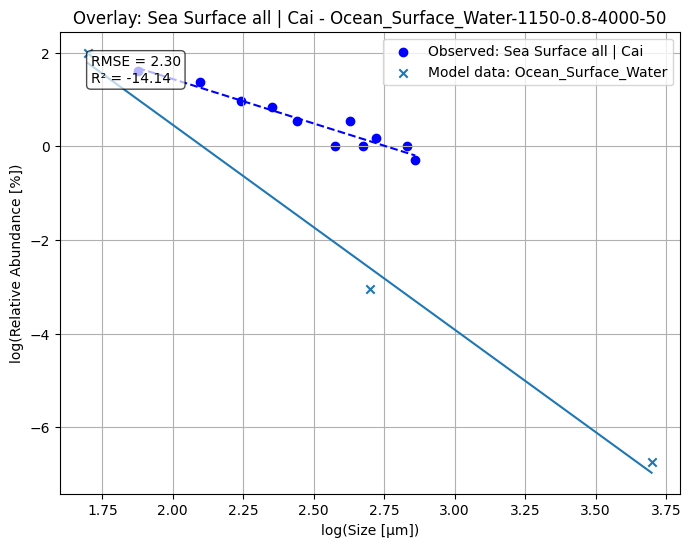

Running Monte Carlo analysis for article: Sea Surface Fragments | Enders


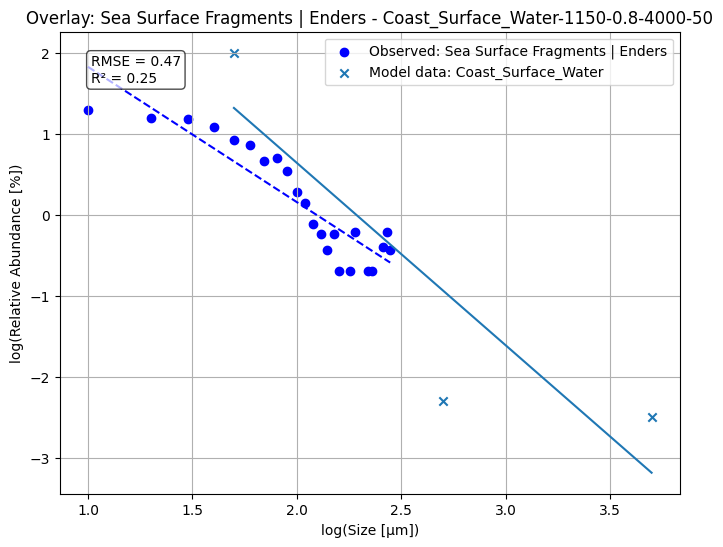

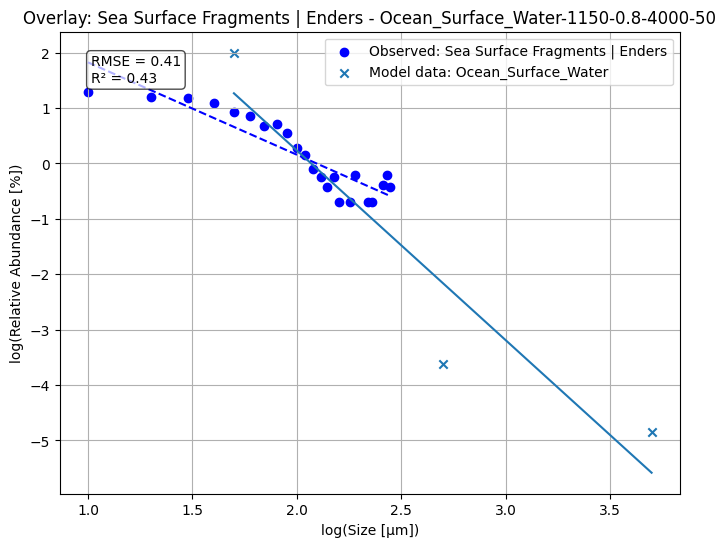

Running Monte Carlo analysis for article: Sea Surface Fibers | Enders


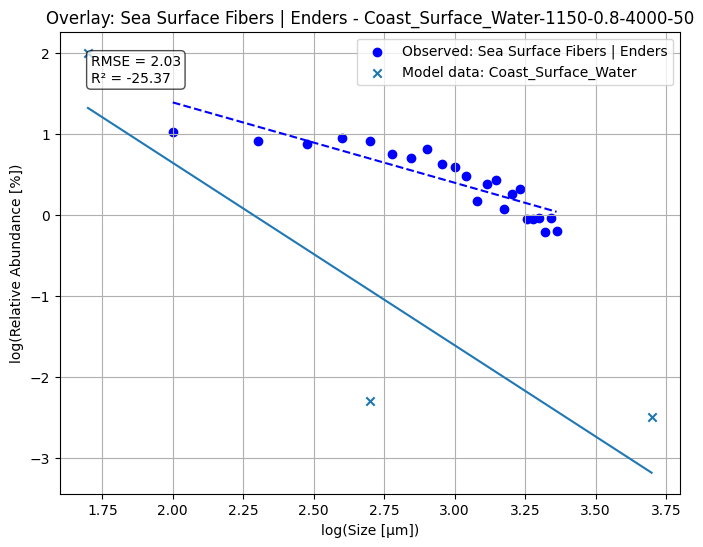

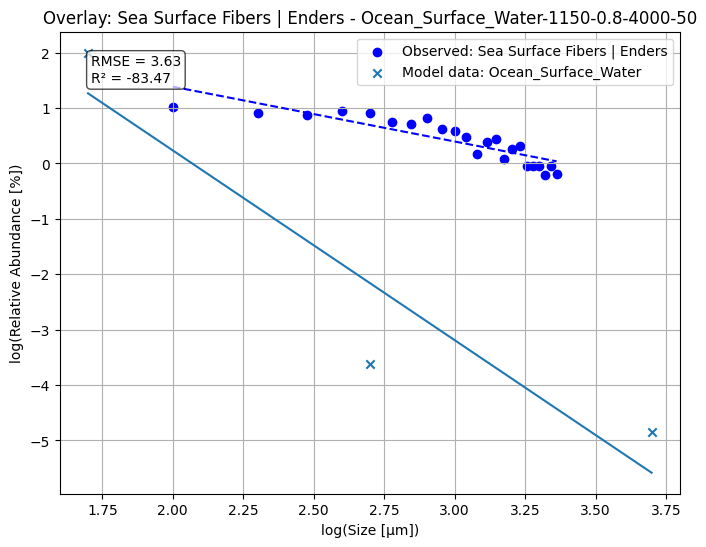

Running Monte Carlo analysis for article: Fragments in water | Eo


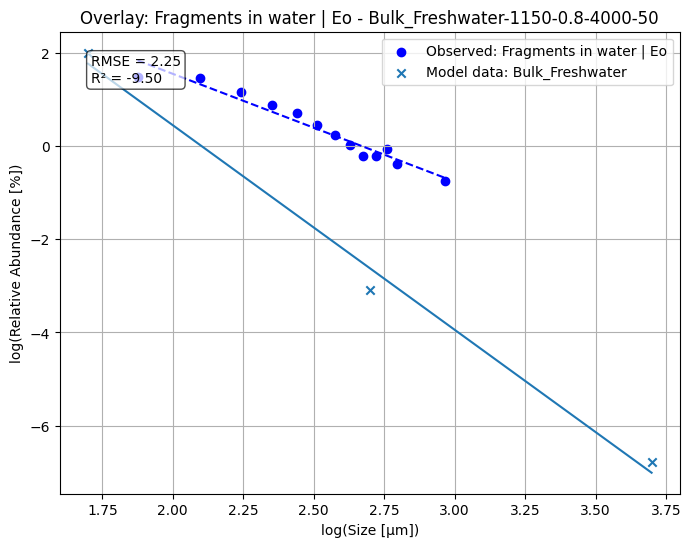

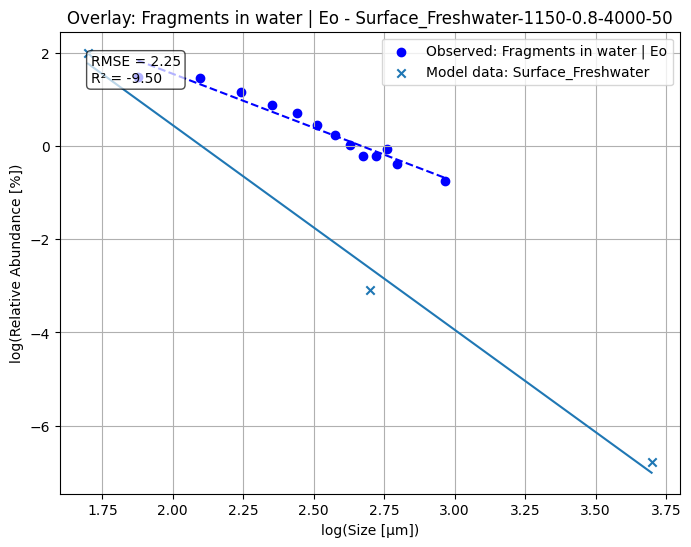

Running Monte Carlo analysis for article: Fibers in water | Eo


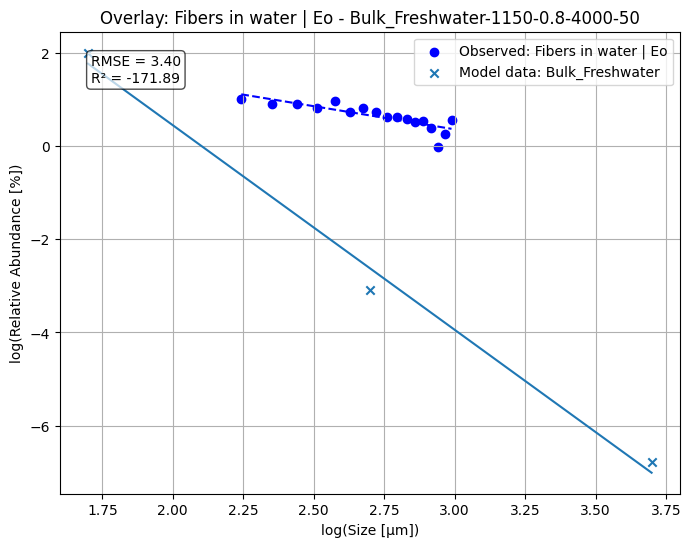

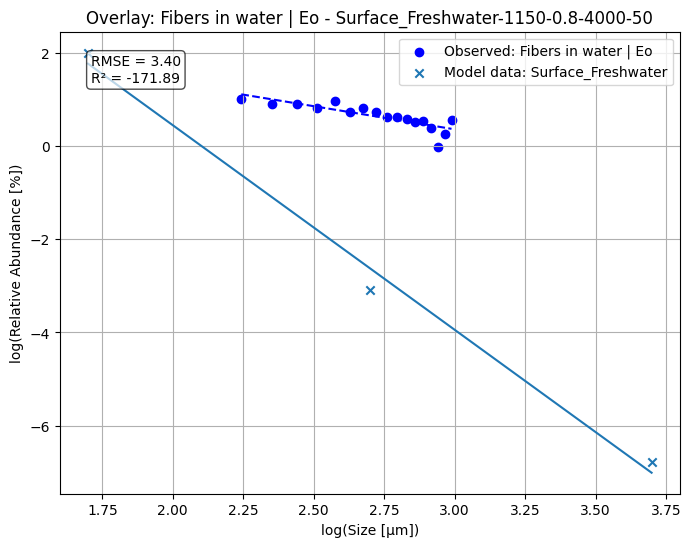

Running Monte Carlo analysis for article: Fragments in sediment | Eo


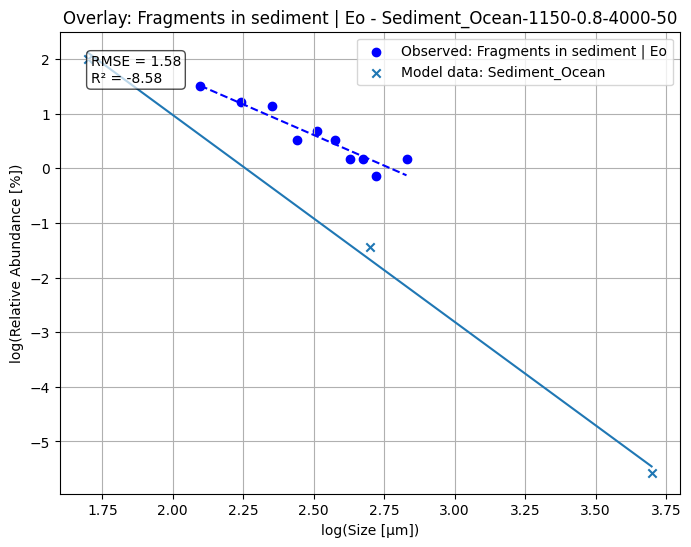

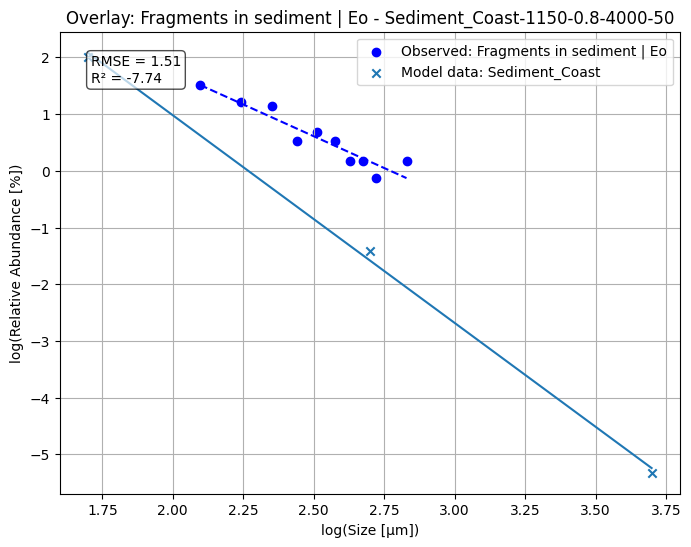

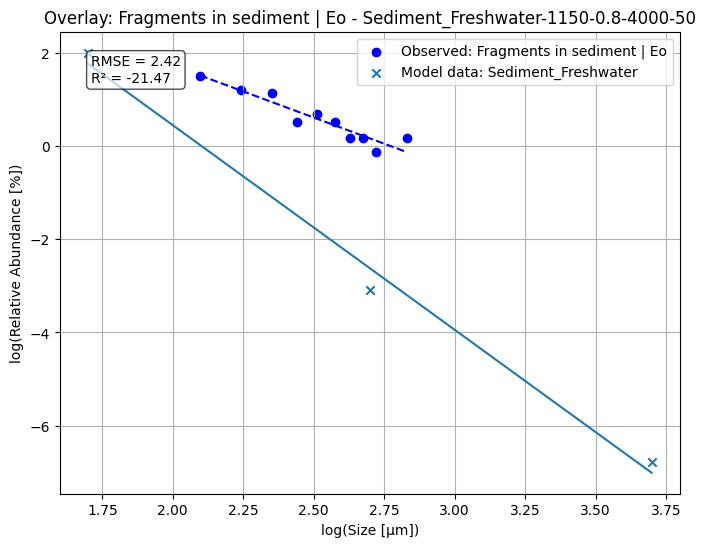

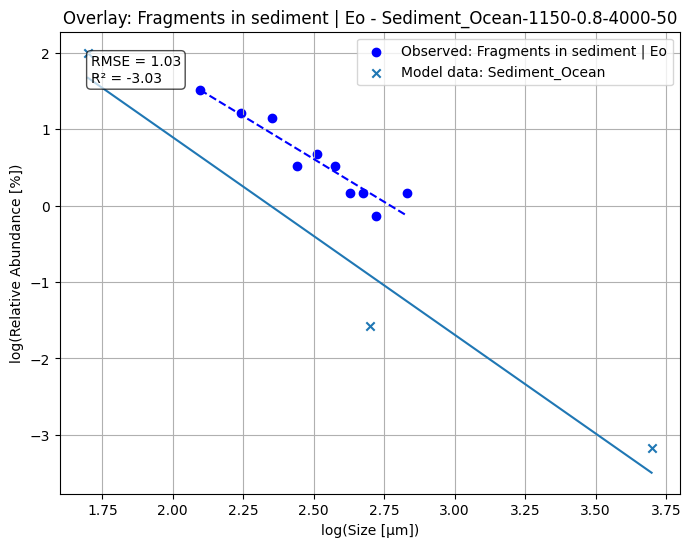

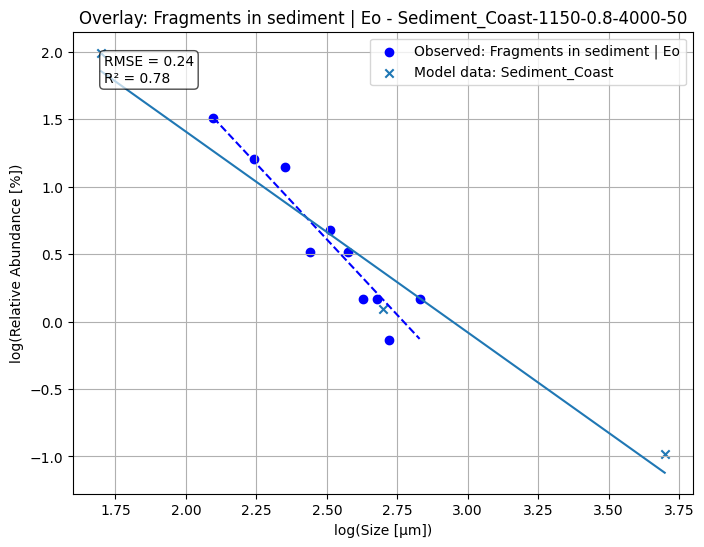

Running Monte Carlo analysis for article: Fibers in sediment | Eo


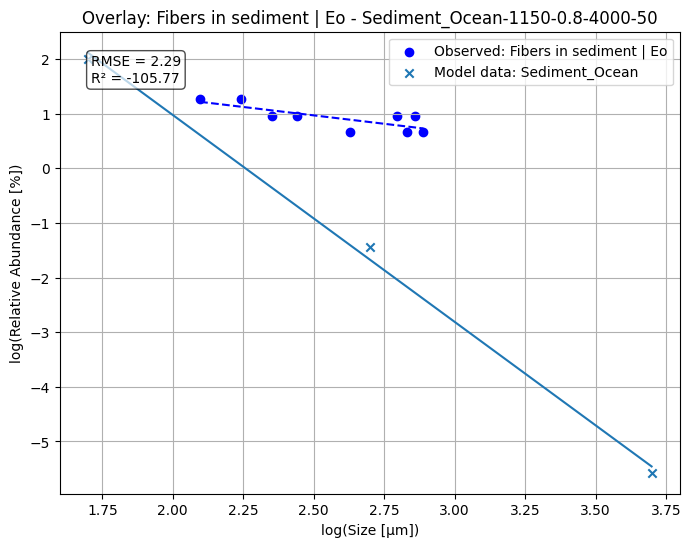

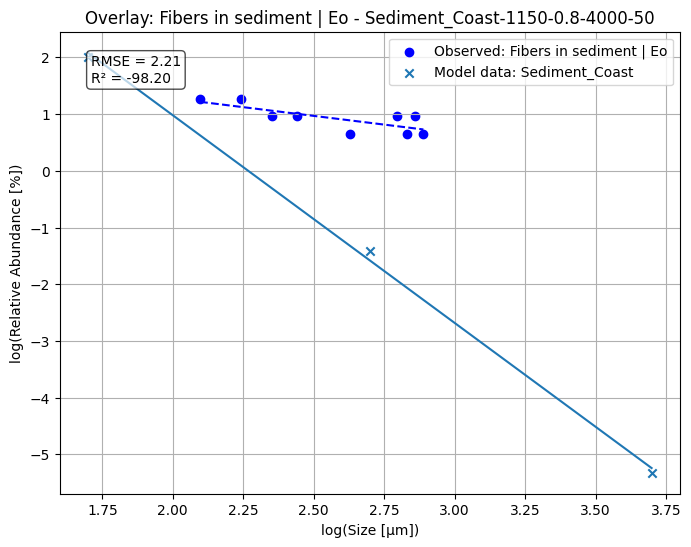

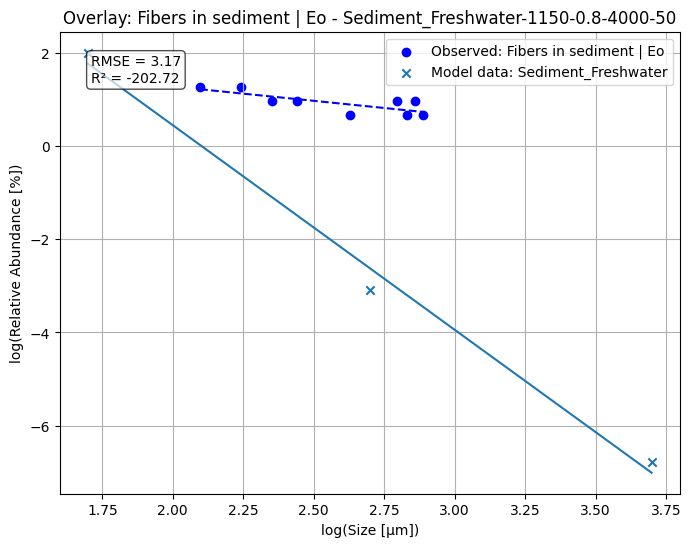

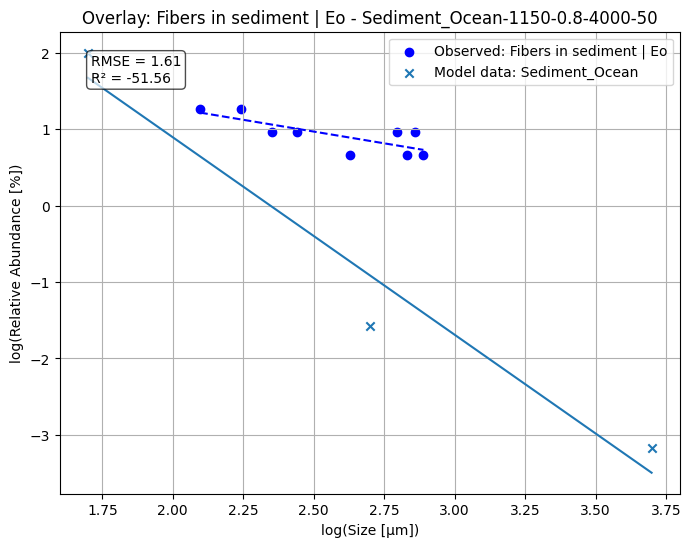

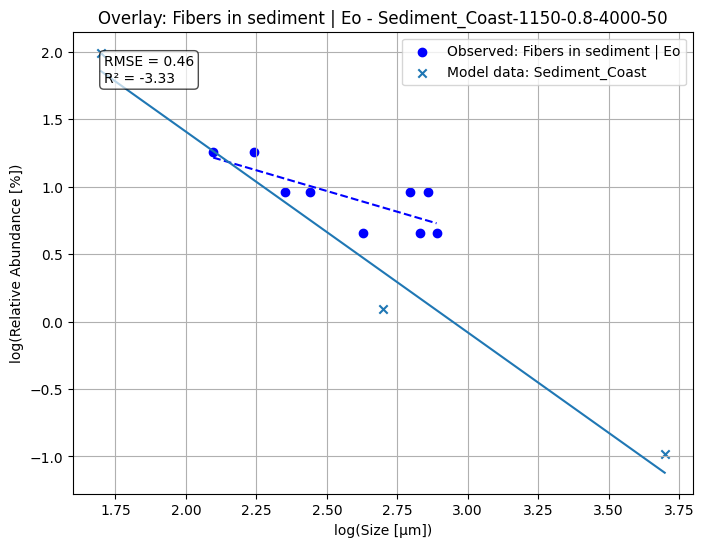

Running Monte Carlo analysis for article: Sea Surface all | Erni-Cassola


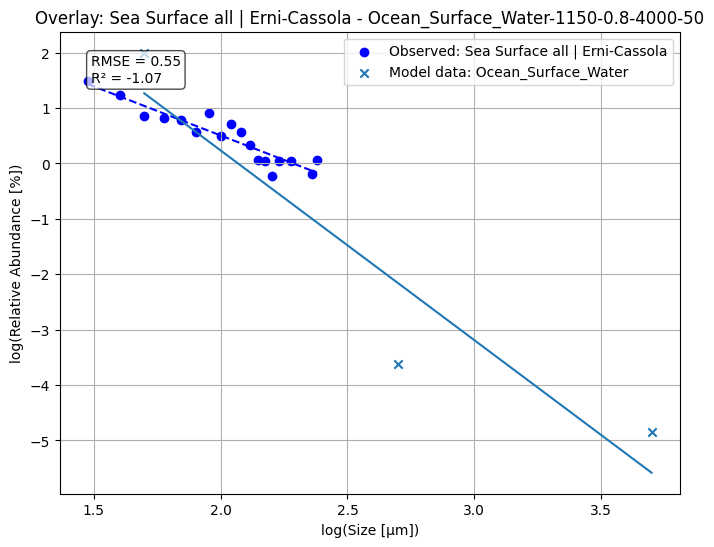

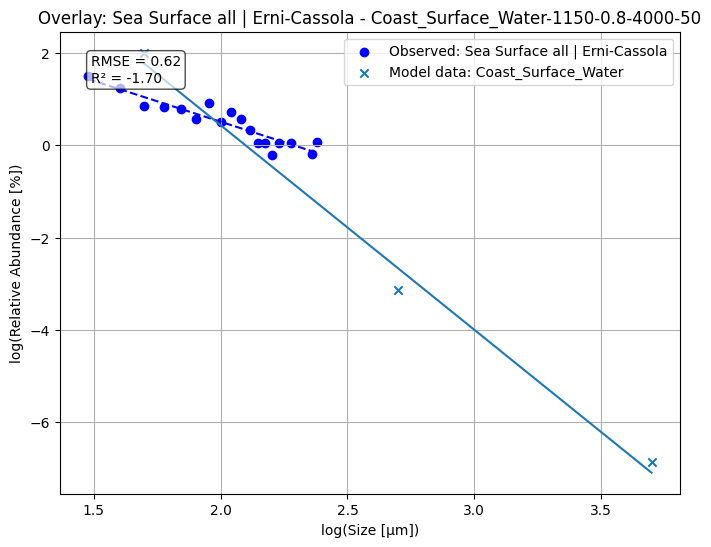

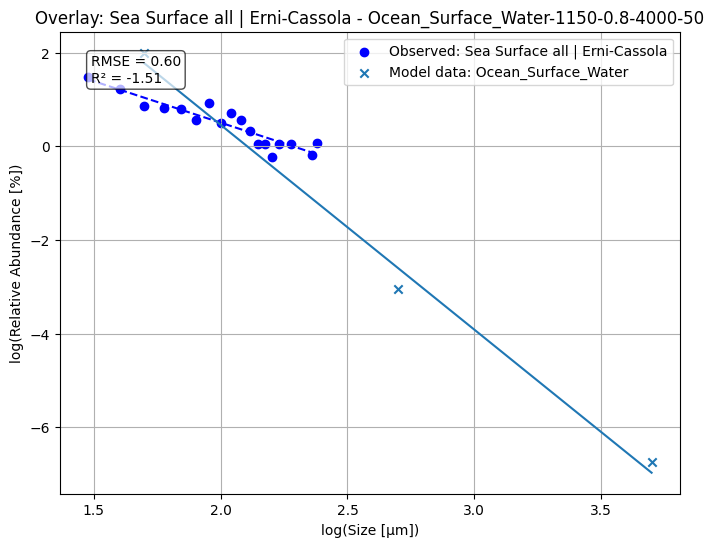

Running Monte Carlo analysis for article: Fresh water sediments | Imhof


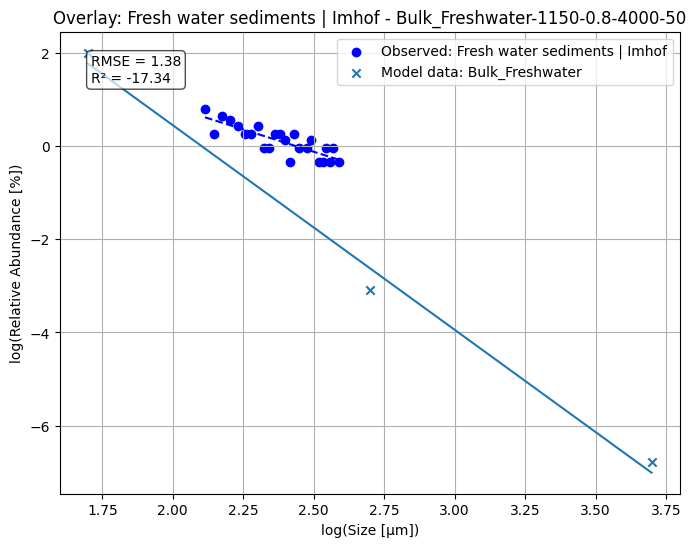

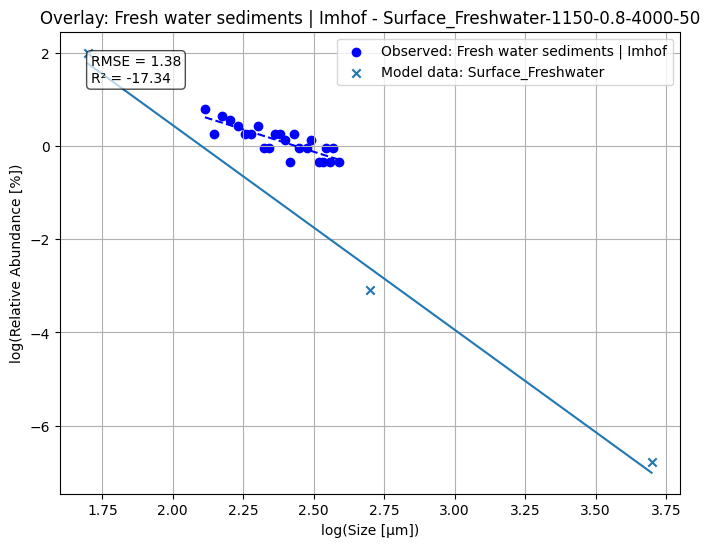

Running Monte Carlo analysis for article: Sea Surface all | Isobe L1


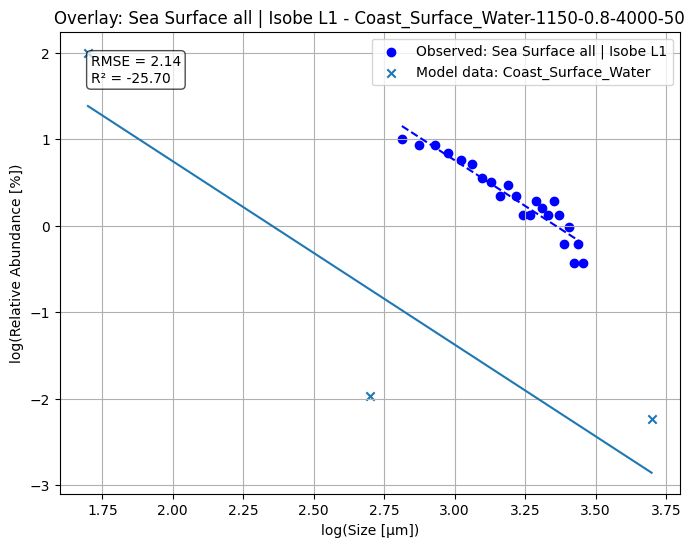

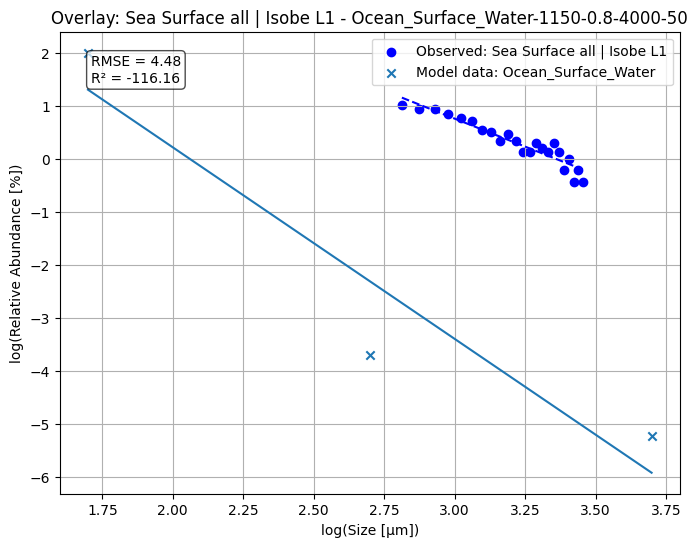

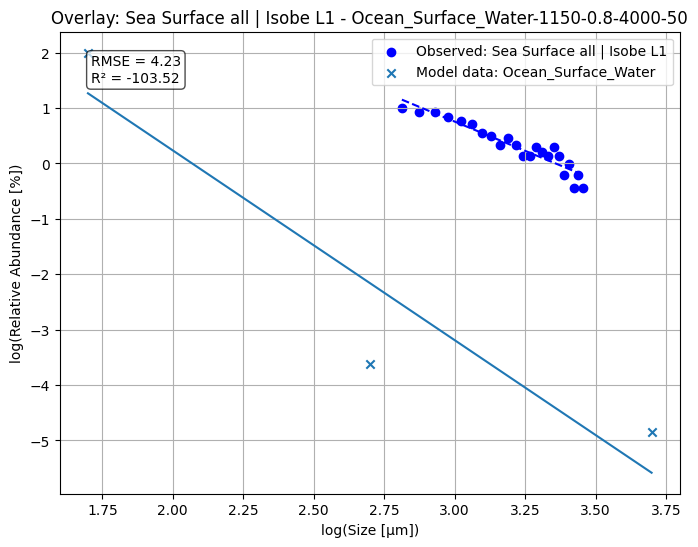

Running Monte Carlo analysis for article: Sea Surface all | Isobe L2


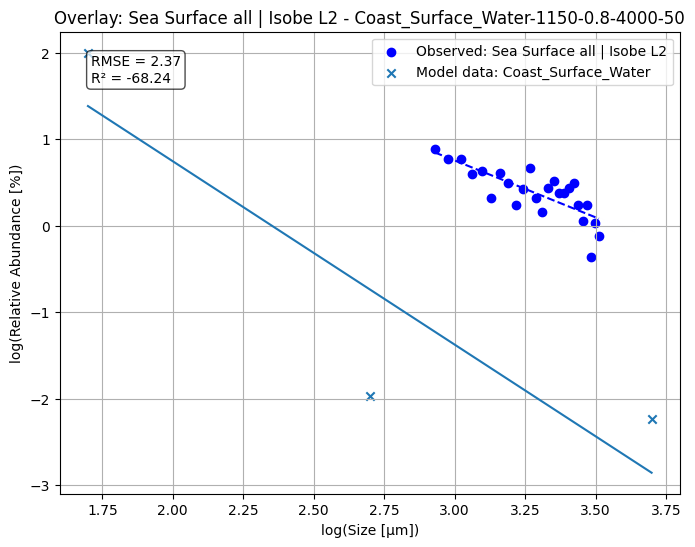

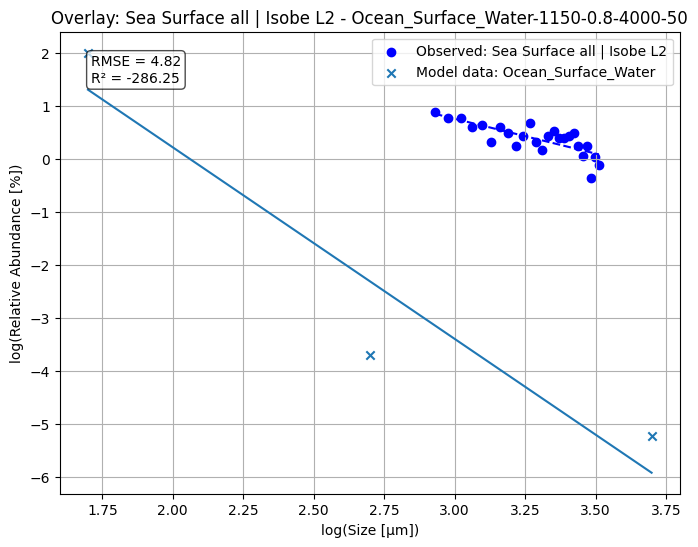

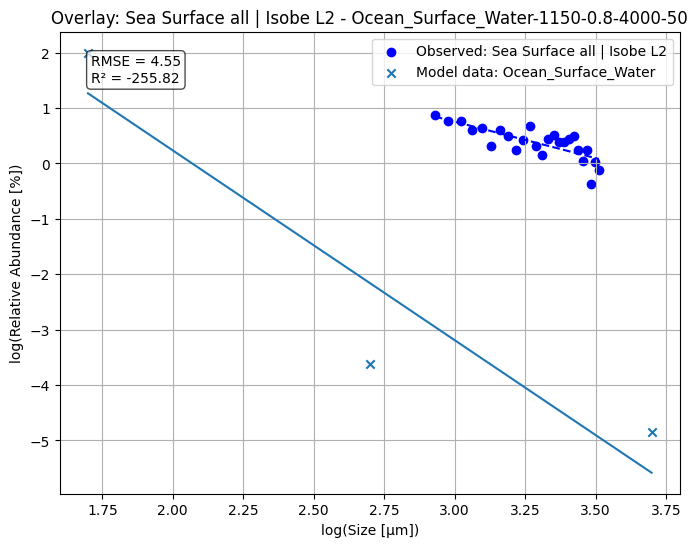

Running Monte Carlo analysis for article: Sea Surface all | Isobe L3


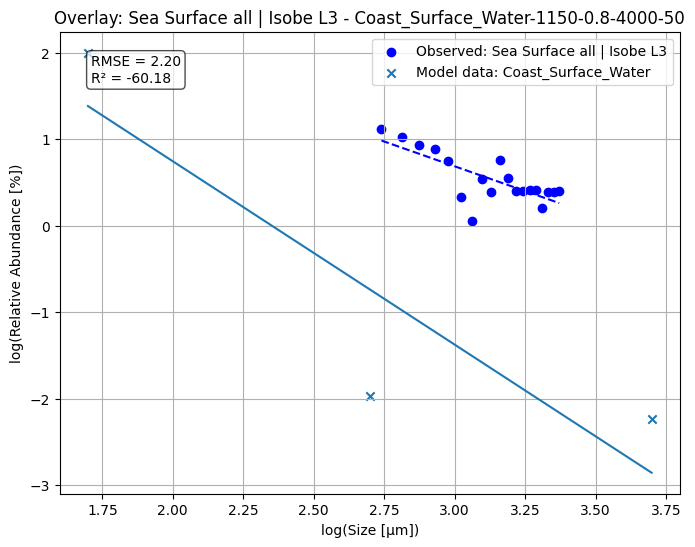

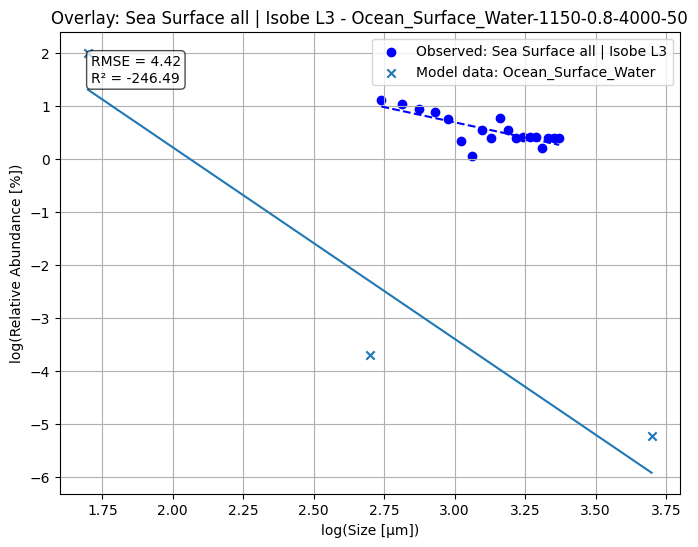

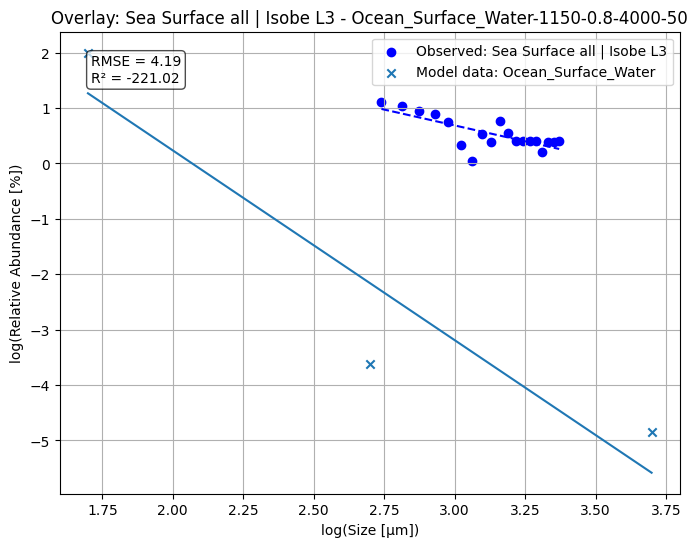

Running Monte Carlo analysis for article: Sea Surface all | Isobe L4


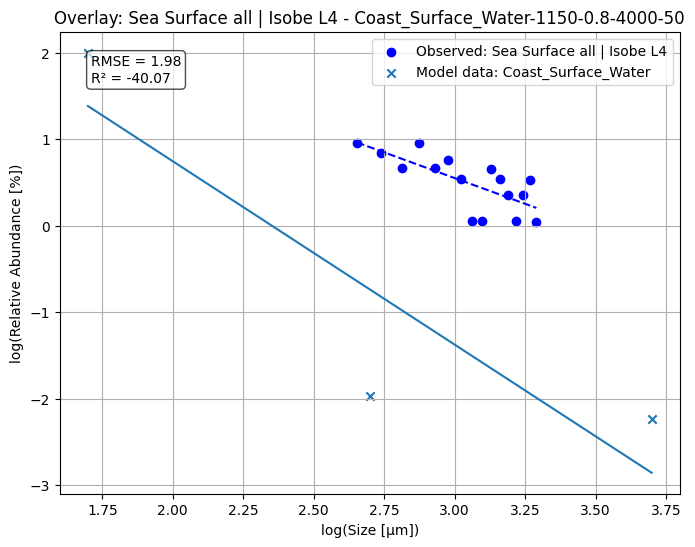

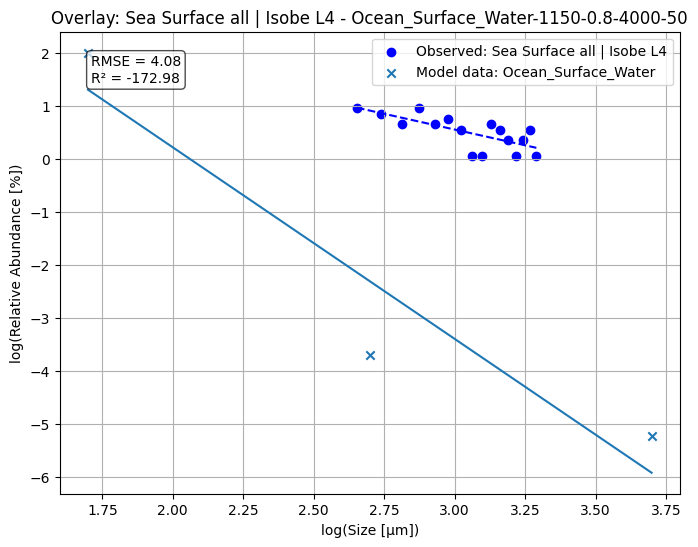

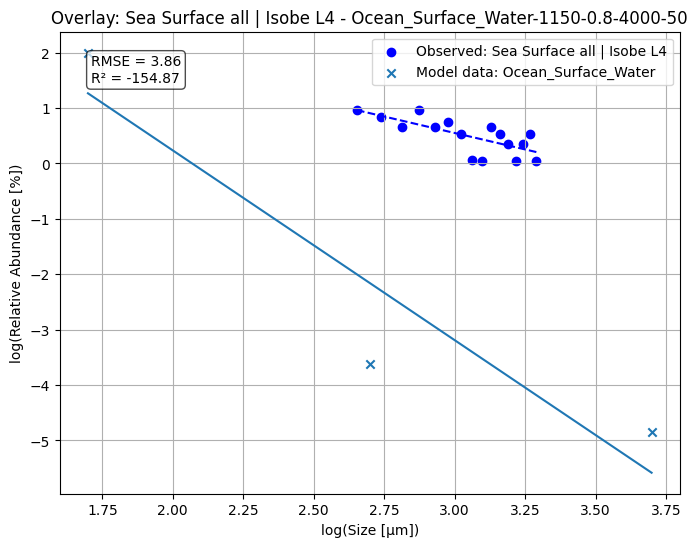

Running Monte Carlo analysis for article: FP all | Scheurer


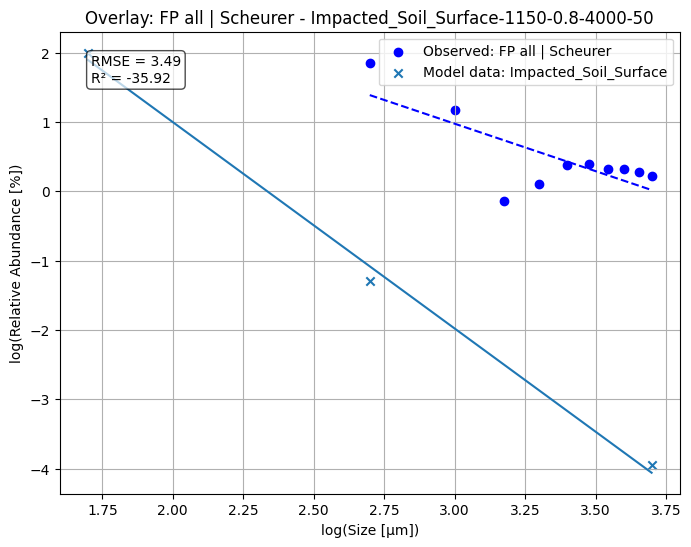

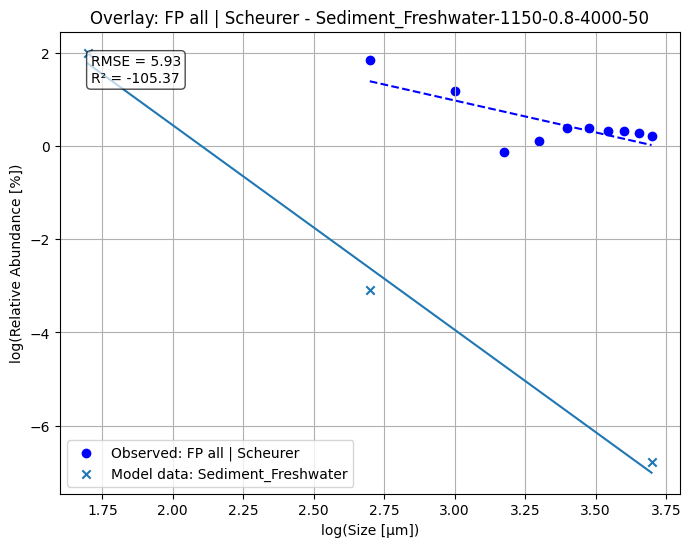

Running Monte Carlo analysis for article: Sea Surface Fragments | Song


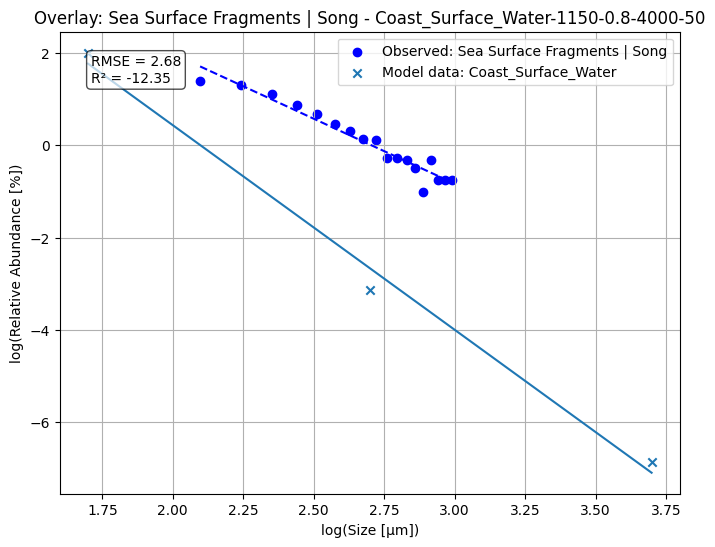

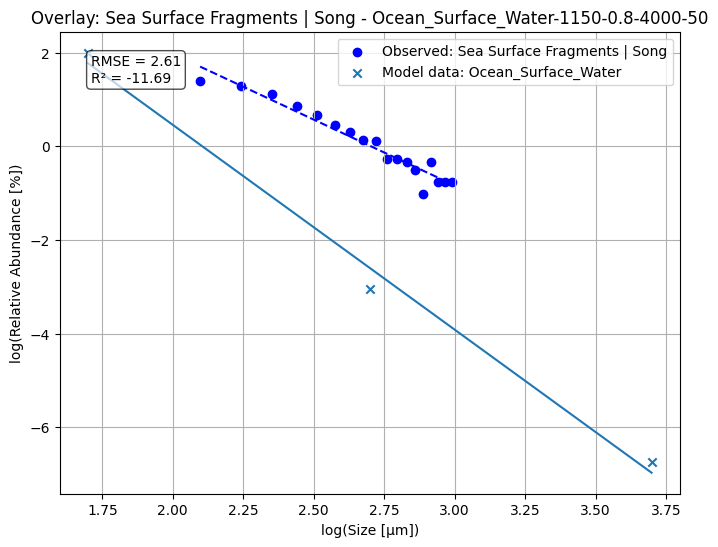

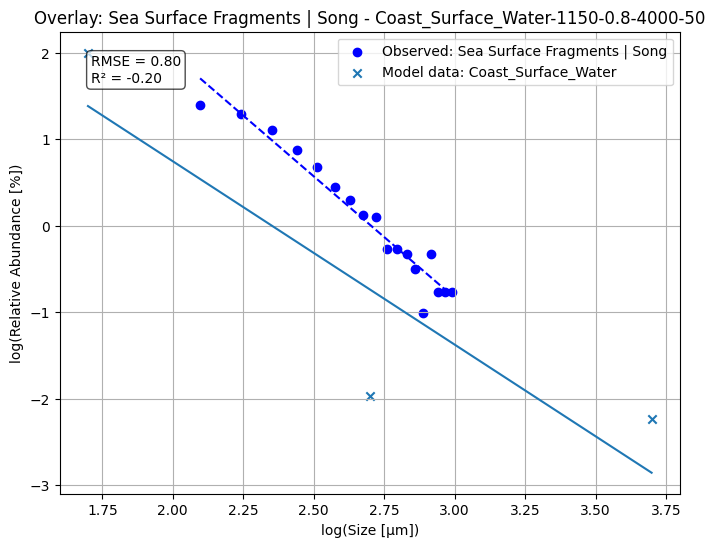

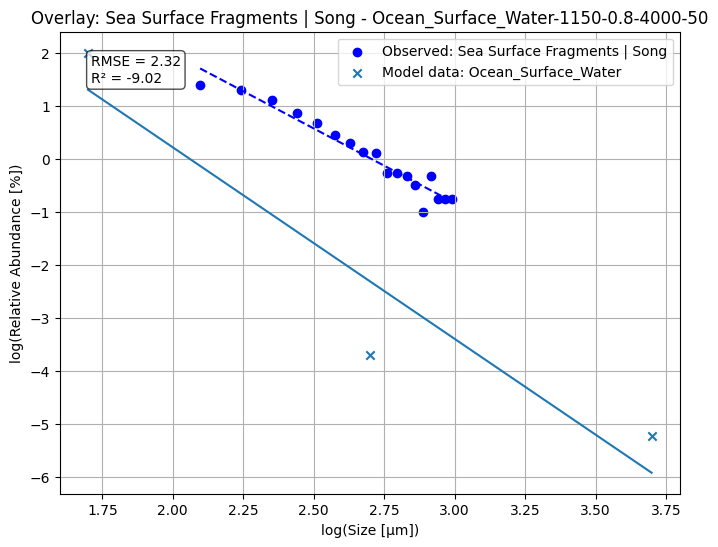

Running Monte Carlo analysis for article: Sea Surface Fibers | Song


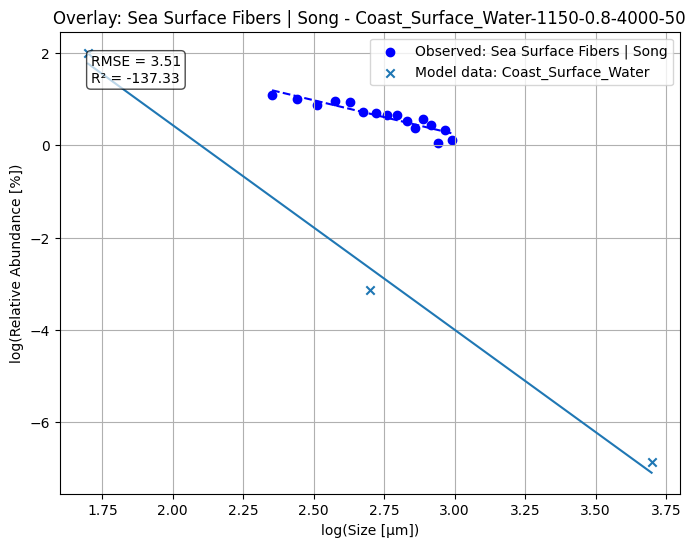

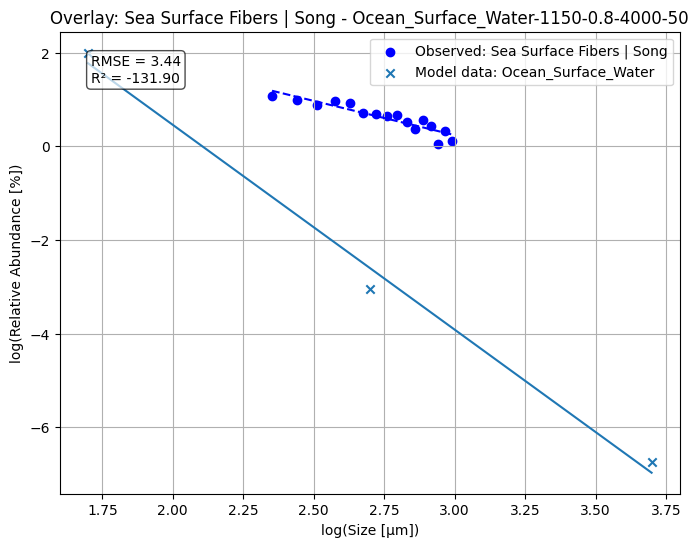

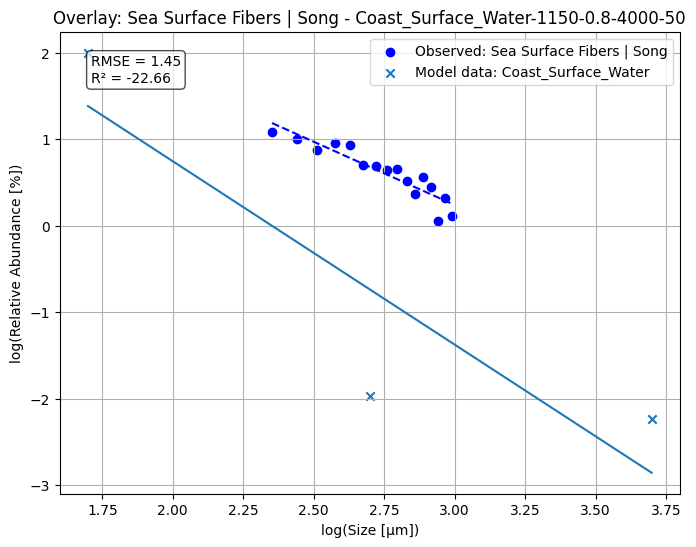

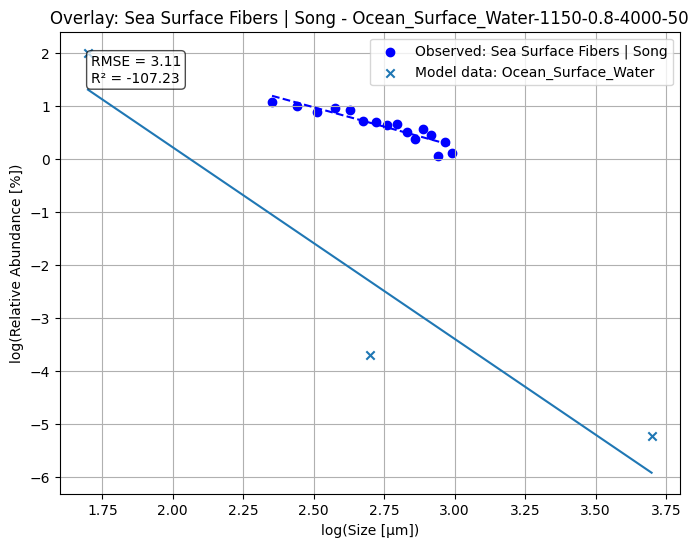

Running Monte Carlo analysis for article: Sea Surface all | Zhang


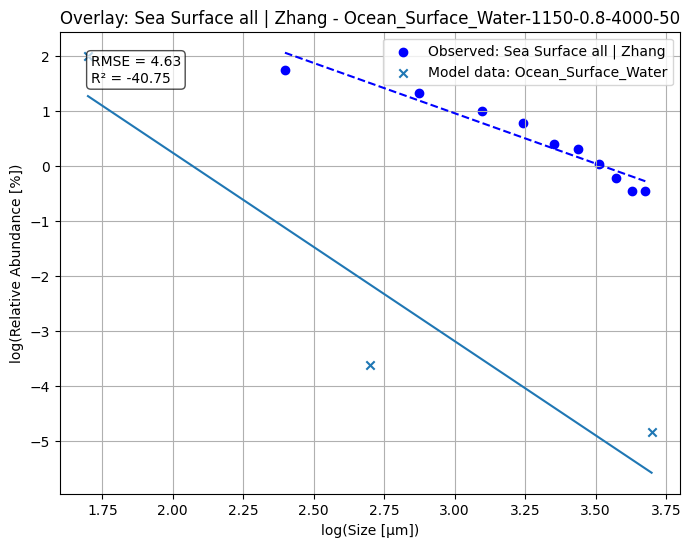

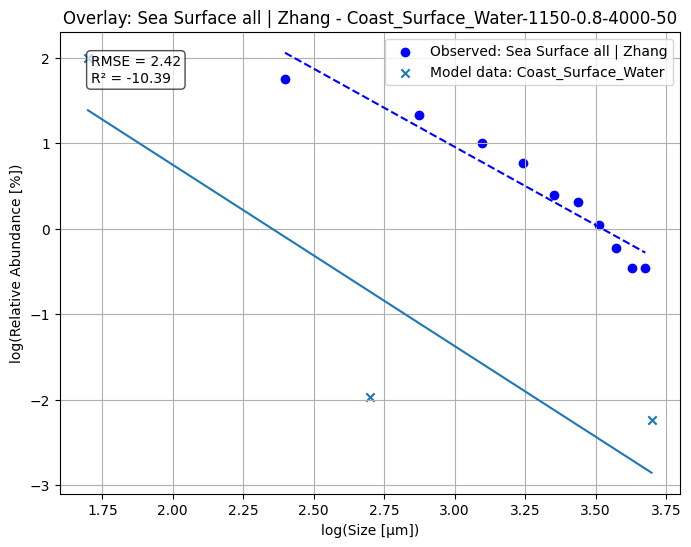

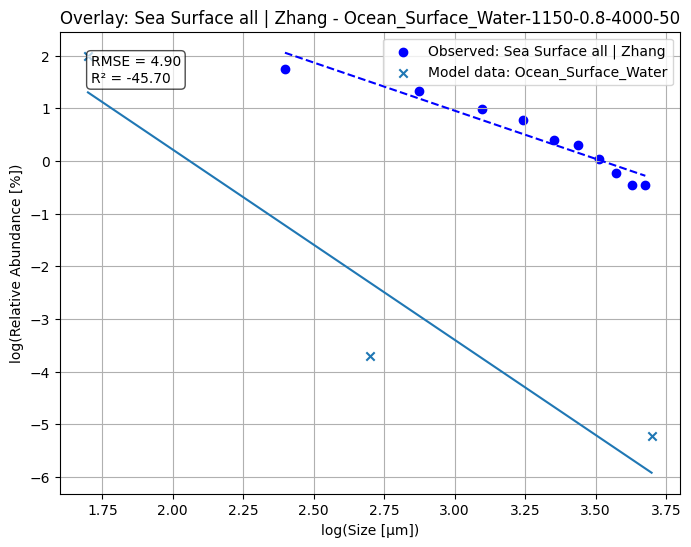

In [52]:
# Run the model for each emission scenario and target compartment
HDP_simulations_results_all={}
for art in overlay_emission_scenarios.keys():
    print(f"Running Monte Carlo analysis for article: {art}")
    HDP_simulations_results=[]
    for comp in overlay_emission_scenarios[art]:
        # Set emissions to that compartment and include it in base_data file
        HDP_data["emiss_dict_g_s"]= set_emission(HDP_data["emiss_dict_g_s"].copy(), comp, "e", 100)
        for comp_T in overlay_compartments_mapping[art]:
            emission_comp=comp
            target_comp=comp_T
            model = utopiaModel(config=config_data, data=HDP_data)
            model.run()
            processor = ResultsProcessor(model)  # Custom processor to handle results
            processor.estimate_flows()
            processor.generate_flows_dict()
            processor.process_results()
            processor.extract_results_by_compartment()
            df = processor.results_by_comp
            df2 = processor.Results_extended
            # processor.estimate_exposure_indicators()

            # Process model outputs into log-relative abundances per size fraction and compare with observed data
            observed_file = "../src/utopia/data/observed_data_long.xlsx"

            observed_df = pd.read_excel(observed_file)

            observed_df = observed_df.rename(columns={
            "dataset identifier": "Dataset",
            "Article name": "Article",
            "log‑transformed size": "log_Size",
            "log‑transformed abundance": "log_Abundance",
        }
    )
            obs_subset = observed_df[observed_df["Article"] == art]
            x_obs_all = obs_subset["log_Size"].astype(float).values
            y_obs_all = obs_subset["log_Abundance"].astype(float).values

            if len(x_obs_all) > 2:
                slope_obs, intercept_obs = np.polyfit(x_obs_all, y_obs_all, 1)
            else:
                slope_obs, intercept_obs = np.nan, np.nan

            result = {}

            # comp_relative_abundance_resultsaccording to target compartment set in the input parameters

            # Exclude size bins that are not withing the observed data range (0.5 and 5 um)
            excluded_sizes = [0.5, 5]
            filtered_Results = df2[~df2["Size_Fraction_um"].isin(excluded_sizes)]
            rel_abun = extract_log_rel_abundance(
                filtered_Results,
                compartment=target_comp,
                value_col="number_of_particles",
            )

            if rel_abun.empty:
                # fill with NaNs
                result.update(
                    {
                        "Spearman_r": np.nan,
                        "Spearman_p": np.nan,
                        "Pass_Spearman": False,
                        "RMSE": np.nan,
                        "R_squared": np.nan,
                        "Model_slope": np.nan,
                        "Model_intercept": np.nan,
                        "Target_compartment": target_comp,
                        "Emission_compartment": emission_comp,
                    }
                )

            else:

                x_mod_all = rel_abun["log_size"].values
                y_mod_all = rel_abun["log_rel_abundance"].values

                # Spearman correlation
                r_value, p_value = spearmanr(x_mod_all, y_mod_all)

                spearman_threshold = -1

                # Initialize metrics
                rmse, r2, slope_mod, intercept_mod = np.nan, np.nan, np.nan, np.nan
                if np.isnan(r_value):
                    pass_spearman = False
                elif (r_value) == spearman_threshold:
                    pass_spearman = True
                else:
                    pass_spearman = False

                # Compute RMSE, R², slope, intercept only if threshold passed

                if pass_spearman == True and len(x_mod_all) > 2 and len(x_obs_all) > 2:
                    slope_mod, intercept_mod = np.polyfit(x_mod_all, y_mod_all, 1)

                    # Align with observed range
                    x_min = max(x_obs_all.min(), x_mod_all.min())
                    x_max = min(x_obs_all.max(), x_mod_all.max())
                    mask_obs = (x_obs_all >= x_min) & (x_obs_all <= x_max)
                    x_obs_filt = x_obs_all[mask_obs]
                    y_obs_filt = y_obs_all[mask_obs]

                    if len(x_obs_filt) > 2:
                        pred_y = slope_mod * x_obs_filt + intercept_mod
                        ss_res = np.sum((y_obs_filt - pred_y) ** 2)
                        ss_tot = np.sum((y_obs_filt - np.mean(y_obs_filt)) ** 2)
                        r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan
                        rmse = np.sqrt(ss_res / len(x_obs_filt))

                        # Plot observed vs model with metrics only if spearman test is true
                        plot_obs_vs_model_with_metrics_True(
                            x_obs_all,
                            y_obs_all,
                            x_mod_all,
                            y_mod_all,
                            comp_T,
                            art,
                            rmse,
                            r2,
                            MP_density=model.MPdensity_kg_m3,
                            FI=model.FI,
                            t_half_deg=model.t_half_deg_free,
                            t_frag=model.t_frag_gen_FreeSurfaceWater,
                        )

                        # Store all metrics in result dict
                        result.update(
                            {
                                "Spearman_r": r_value,
                                "Spearman_p": p_value,
                                "Pass_Spearman": pass_spearman,
                                "RMSE": rmse,
                                "R_squared": r2,
                                "Model_slope": slope_mod,
                                "Model_intercept": intercept_mod,
                                "Target_compartment": target_comp,
                                "Emission_compartment": emission_comp,
                            }
                        )
                    else:
                        # If not enough points to compute metrics, store NaNs
                        result.update(
                            {
                                "Spearman_r": np.nan,
                                "Spearman_p": np.nan,
                                "Pass_Spearman": False,
                                "RMSE": np.nan,
                                "R_squared": np.nan,
                                "Model_slope": np.nan,
                                "Model_intercept": np.nan,
                                "Target_compartment": target_comp,
                                "Emission_compartment": emission_comp,
                            }
                        )
                else:
                    # Store all metrics in result dict
                    result.update(
                        {
                            "Spearman_r": np.nan,
                            "Spearman_p": np.nan,
                            "Pass_Spearman": False,
                            "RMSE": np.nan,
                            "R_squared": np.nan,
                            "Model_slope": np.nan,
                            "Model_intercept": np.nan,
                            "Target_compartment": target_comp,
                            "Emission_compartment": emission_comp,
                        }
                    )
            HDP_simulations_results.append(result)
    HDP_simulations_results_all[art]=HDP_simulations_results    
                

            
            

In [53]:
# Flatten it into a list of rows
rows = []
for article, records in HDP_simulations_results_all.items():
    for record in records:
        record["article"] = article  # Add outer key as a column
        rows.append(record)

# Create DataFrame
df2 = pd.DataFrame(rows)

# 👇 Drop rows with any NaN values
df2_clean = df2.dropna()

# Reorder columns (optional)
cols = ["article"] + [c for c in df2_clean .columns if c != "article"]
df2_clean_HDP  = df2_clean [cols]

HDP_correlations_shorted=df2_clean_HDP.sort_values("RMSE", ascending=True)
HDP_correlations_shorted.head(20)

,article,Spearman_r,Spearman_p,Pass_Spearman,RMSE,R_squared,Model_slope,Model_intercept,Target_compartment,Emission_compartment
32,Fragments in sediment | Eo,-1.0,0.0,True,0.241373,0.777135,-1.488925,4.386381,Sediment_Coast,Surface_Freshwater
15,Sea Surface Fragments | Enders,-1.0,0.0,True,0.407572,0.431465,-3.425203,7.086679,Ocean_Surface_Water,Coast_Surface_Water
38,Fibers in sediment | Eo,-1.0,0.0,True,0.461916,-3.334500,-1.488925,4.386381,Sediment_Coast,Surface_Freshwater
12,Sea Surface Fragments | Enders,-1.0,0.0,True,0.469533,0.245464,-2.248370,5.139047,Coast_Surface_Water,Ocean_Surface_Water
41,Sea Surface all | Erni-Cassola,-1.0,0.0,True,0.545142,-1.071792,-3.425203,7.086679,Ocean_Surface_Water,Coast_Surface_Water
43,Sea Surface all | Erni-Cassola,-1.0,0.0,True,0.599766,-1.507791,-4.372815,9.205297,Ocean_Surface_Water,Impacted_Soil_Surface
42,Sea Surface all | Erni-Cassola,-1.0,0.0,True,0.622319,-1.699942,-4.427788,9.287040,Coast_Surface_Water,Impacted_Soil_Surface
5,Sea Sediment | Bergmann,-1.0,0.0,True,0.779936,-8.965140,-2.544950,6.008366,Sediment_Ocean,Coast_Column_Water
3,Sea Sediment | Bergmann,-1.0,0.0,True,0.787404,-9.156869,-2.518483,5.963838,Sediment_Ocean,Coast_Surface_Water
68,Sea Surface Fragments | Song,-1.0,0.0,True,0.801651,-0.195902,-2.118969,4.983485,Coast_Surface_Water,Surface_Freshwater
